# Data Integration

### import libraries

In [1208]:
library("dplyr")
library("data.table")
library("hash")
library("tidyverse")
library("tidyr")
library("readr")
# library("janitor")
library("lubridate")
library("skimr")
library("DataExplorer")
library("visdat") 
library("plotly")
library("SDaA")
library("magrittr")
library("ggplot2")
library("highcharter")
library("corrplot")
library("sf")
library("Hmisc")
library("randomForest")
library("gridExtra")
library("zoo")
library("caret")
library("Boruta")
library("rpart")
library("factoextra")
library("e1071")
library("reshape2")
library("GGally")

Set working directory

In [1209]:
setwd("C:/Users/1040 G3/OneDrive - University of Gloucestershire/Documents/course/1 R-Assessment")
getwd()

[1] "C:/Users/1040 G3/OneDrive - University of Gloucestershire/Documents/course/1 R-Assessment"

Get all files

In [1210]:
get_all_files_from_directories <- function () {
  files <- hash()
  
  files["2014"] <- list.files("dataset/2014", pattern=".csv")
  files["2015"] <- list.files("dataset/2015", pattern=".csv")
  files["2016"] <- list.files("dataset/2016", pattern=".csv")
  files["2017"] <- list.files("dataset/2017", pattern=".csv")
  files["2018"] <- list.files("dataset/2018", pattern=".csv")
  
  return(files)
}

get_all_files_from_directories()

<hash> containing 5 key-value pair(s).
  2014 : principal_offence_category_april_2014.csv     principal_offence_category_august_2014.csv    principal_offence_category_december_2014.csv  principal_offence_category_february_2014.csv  principal_offence_category_january_2014.csv   principal_offence_category_july_2014.csv      principal_offence_category_june_2014.csv      principal_offence_category_march_2014.csv     principal_offence_category_may_2014.csv       principal_offence_category_november_2014.csv  principal_offence_category_october_2014.csv   principal_offence_category_september_2014.csv
  2015 : principal_offence_category_april_2015.csv     principal_offence_category_august_2015.csv    principal_offence_category_december_2015.csv  principal_offence_category_february_2015.csv  principal_offence_category_january_2015.csv   principal_offence_category_july_2015.csv      principal_offence_category_june_2015.csv      principal_offence_category_march_2015.csv     principal_offence_categ

MERGE FILES

In [1211]:
merge_files <- function(hash) {
  year <- names(hash)

  combined_df <- do.call(rbind, lapply(year, function(y) {
  do.call(rbind, lapply(hash[[y]], function(f) {
      f_name <- paste("dataset/", y, "/", f, sep="")
        df <- read.csv(f_name, stringsAsFactors = FALSE)
        df$year <- y
        df$month <- tolower(gsub(".csv", "", as.list(strsplit(f, "_")[[1]])[4]))
        df
    }))
  }))
  return(combined_df)
}


combined_df <- merge_files(get_all_files_from_directories())

In [1212]:
head(combined_df)

,X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,⋯,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,year,month
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,National,81,85.3%,14,14.7%,"7,805",74.1%,"2,722",25.9%,698,⋯,513,16.3%,"8,283",86.3%,"1,314",13.7%,718,100.0%,2014,april
2,Avon and Somerset,1,100.0%,0,0.0%,167,78.8%,45,21.2%,36,⋯,16,19.5%,188,83.6%,37,16.4%,24,100.0%,2014,april
3,Bedfordshire,0,-,0,-,69,75.0%,23,25.0%,5,⋯,6,35.3%,40,88.9%,5,11.1%,16,100.0%,2014,april
4,Cambridgeshire,0,-,0,-,99,81.1%,23,18.9%,6,⋯,2,25.0%,79,92.9%,6,7.1%,4,100.0%,2014,april
5,Cheshire,1,50.0%,1,50.0%,140,74.9%,47,25.1%,17,⋯,6,10.7%,209,94.6%,12,5.4%,1,100.0%,2014,april
6,Cleveland,0,-,0,-,85,67.5%,41,32.5%,11,⋯,5,15.2%,124,87.9%,17,12.1%,10,100.0%,2014,april


In [1213]:
write.csv(combined_df, file= "merged_files.csv", row.names = FALSE)

# Data Cleaning

In [1214]:
df <- read.csv("C:/Users/1040 G3/OneDrive - University of Gloucestershire/Documents/Course/1 R-Assessment/merged_files.csv")

In [1215]:
data_cleaning1 <- distinct(df)
head(data_cleaning1)

,X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,⋯,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,year,month
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
1,National,81,85.3%,14,14.7%,"7,805",74.1%,"2,722",25.9%,698,⋯,513,16.3%,"8,283",86.3%,"1,314",13.7%,718,100.0%,2014,april
2,Avon and Somerset,1,100.0%,0,0.0%,167,78.8%,45,21.2%,36,⋯,16,19.5%,188,83.6%,37,16.4%,24,100.0%,2014,april
3,Bedfordshire,0,-,0,-,69,75.0%,23,25.0%,5,⋯,6,35.3%,40,88.9%,5,11.1%,16,100.0%,2014,april
4,Cambridgeshire,0,-,0,-,99,81.1%,23,18.9%,6,⋯,2,25.0%,79,92.9%,6,7.1%,4,100.0%,2014,april
5,Cheshire,1,50.0%,1,50.0%,140,74.9%,47,25.1%,17,⋯,6,10.7%,209,94.6%,12,5.4%,1,100.0%,2014,april
6,Cleveland,0,-,0,-,85,67.5%,41,32.5%,11,⋯,5,15.2%,124,87.9%,17,12.1%,10,100.0%,2014,april


In [1216]:
is.na(df)


X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,⋯,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,year,month
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE
FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,⋯,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE


In [1217]:
sum(is.na(df))

[1] 0

In [1218]:
colSums(is.na(df))

X 
                                                                 0 
                                    Number.of.Homicide.Convictions 
                                                                 0 
                                Percentage.of.Homicide.Convictions 
                                                                 0 
                                   Number.of.Homicide.Unsuccessful 
                                                                 0 
                               Percentage.of.Homicide.Unsuccessful 
                                                                 0 
                 Number.of.Offences.Against.The.Person.Convictions 
                                                                 0 
             Percentage.of.Offences.Against.The.Person.Convictions 
                                                                 0 
                Number.of.Offences.Against.The.Person.Unsuccessful 
                                                                 0 
            Percentage.of.Offences.Against.The.Person.Unsuccessful 
                                                                 0 
                             Number.of.Sexual.Offences.Convictions 
                                                                 0 
                         Percentage.of.Sexual.Offences.Convictions 
                                                                 0 
                            Number.of.Sexual.Offences.Unsuccessful 
                                                                 0 
                        Percentage.of.Sexual.Offences.Unsuccessful 
                                                                 0 
                                    Number.of.Burglary.Convictions 
                                                                 0 
                                Percentage.of.Burglary.Convictions 
                                                                 0 
                                   Number.of.Burglary.Unsuccessful 
                                                                 0 
                               Percentage.of.Burglary.Unsuccessful 
                                                                 0 
                                     Number.of.Robbery.Convictions 
                                                                 0 
                                 Percentage.of.Robbery.Convictions 
                                                                 0 
                                    Number.of.Robbery.Unsuccessful 
                                                                 0 
                                Percentage.of.Robbery.Unsuccessful 
                                                                 0 
                          Number.of.Theft.And.Handling.Convictions 
                                                                 0 
                      Percentage.of.Theft.And.Handling.Convictions 
                                                                 0 
                         Number.of.Theft.And.Handling.Unsuccessful 
                                                                 0 
                     Percentage.of.Theft.And.Handling.Unsuccessful 
                                                                 0 
                           Number.of.Fraud.And.Forgery.Convictions 
                                                                 0 
                       Percentage.of.Fraud.And.Forgery.Convictions 
                                                                 0 
                          Number.of.Fraud.And.Forgery.Unsuccessful 
                                                                 0 
                      Percentage.of.Fraud.And.Forgery.Unsuccessful 
                                                                 0 
                             Number.of.Criminal.Damage.Convictions 
                                                     

In [1219]:
rowSums(is.na(df))

[1] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  [38] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  [75] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [112] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [149] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [186] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [223] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [260] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [297] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [334] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [371] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [408] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [445] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [482] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [519] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [556] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [593] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [630] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [667] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [704] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [741] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [778] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [815] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [852] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [889] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [926] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [963] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1000] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1037] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1074] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1111] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1148] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1185] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1222] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1259] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1296] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1333] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1370] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1407] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1444] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1481] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1518] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1555] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1592] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1629] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1666] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1703] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1740] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1777] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
[1814] 0 0 0 0 0 0 0 0 0 0 0 0 0 0

In [1220]:
dim(df)

[1] 2150   53

# Check Missing Values

In [1221]:
df[complete.cases(df),]

,X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,⋯,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,year,month
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
1,National,81,85.3%,14,14.7%,"7,805",74.1%,"2,722",25.9%,698,⋯,513,16.3%,"8,283",86.3%,"1,314",13.7%,718,100.0%,2014,april
2,Avon and Somerset,1,100.0%,0,0.0%,167,78.8%,45,21.2%,36,⋯,16,19.5%,188,83.6%,37,16.4%,24,100.0%,2014,april
3,Bedfordshire,0,-,0,-,69,75.0%,23,25.0%,5,⋯,6,35.3%,40,88.9%,5,11.1%,16,100.0%,2014,april
4,Cambridgeshire,0,-,0,-,99,81.1%,23,18.9%,6,⋯,2,25.0%,79,92.9%,6,7.1%,4,100.0%,2014,april
5,Cheshire,1,50.0%,1,50.0%,140,74.9%,47,25.1%,17,⋯,6,10.7%,209,94.6%,12,5.4%,1,100.0%,2014,april
6,Cleveland,0,-,0,-,85,67.5%,41,32.5%,11,⋯,5,15.2%,124,87.9%,17,12.1%,10,100.0%,2014,april
7,Cumbria,0,-,0,-,77,80.2%,19,19.8%,8,⋯,1,1.5%,95,90.5%,10,9.5%,12,100.0%,2014,april
8,Derbyshire,0,-,0,-,151,72.6%,57,27.4%,8,⋯,15,24.6%,258,95.2%,13,4.8%,16,100.0%,2014,april
9,Devon and Cornwall,1,100.0%,0,0.0%,157,75.8%,50,24.2%,11,⋯,14,17.9%,189,91.7%,17,8.3%,15,100.0%,2014,april


In [1222]:
na.omit(df)

,X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,⋯,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,year,month
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
1,National,81,85.3%,14,14.7%,"7,805",74.1%,"2,722",25.9%,698,⋯,513,16.3%,"8,283",86.3%,"1,314",13.7%,718,100.0%,2014,april
2,Avon and Somerset,1,100.0%,0,0.0%,167,78.8%,45,21.2%,36,⋯,16,19.5%,188,83.6%,37,16.4%,24,100.0%,2014,april
3,Bedfordshire,0,-,0,-,69,75.0%,23,25.0%,5,⋯,6,35.3%,40,88.9%,5,11.1%,16,100.0%,2014,april
4,Cambridgeshire,0,-,0,-,99,81.1%,23,18.9%,6,⋯,2,25.0%,79,92.9%,6,7.1%,4,100.0%,2014,april
5,Cheshire,1,50.0%,1,50.0%,140,74.9%,47,25.1%,17,⋯,6,10.7%,209,94.6%,12,5.4%,1,100.0%,2014,april
6,Cleveland,0,-,0,-,85,67.5%,41,32.5%,11,⋯,5,15.2%,124,87.9%,17,12.1%,10,100.0%,2014,april
7,Cumbria,0,-,0,-,77,80.2%,19,19.8%,8,⋯,1,1.5%,95,90.5%,10,9.5%,12,100.0%,2014,april
8,Derbyshire,0,-,0,-,151,72.6%,57,27.4%,8,⋯,15,24.6%,258,95.2%,13,4.8%,16,100.0%,2014,april
9,Devon and Cornwall,1,100.0%,0,0.0%,157,75.8%,50,24.2%,11,⋯,14,17.9%,189,91.7%,17,8.3%,15,100.0%,2014,april


In [1223]:
head(df)

,X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,⋯,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,year,month
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
1,National,81,85.3%,14,14.7%,"7,805",74.1%,"2,722",25.9%,698,⋯,513,16.3%,"8,283",86.3%,"1,314",13.7%,718,100.0%,2014,april
2,Avon and Somerset,1,100.0%,0,0.0%,167,78.8%,45,21.2%,36,⋯,16,19.5%,188,83.6%,37,16.4%,24,100.0%,2014,april
3,Bedfordshire,0,-,0,-,69,75.0%,23,25.0%,5,⋯,6,35.3%,40,88.9%,5,11.1%,16,100.0%,2014,april
4,Cambridgeshire,0,-,0,-,99,81.1%,23,18.9%,6,⋯,2,25.0%,79,92.9%,6,7.1%,4,100.0%,2014,april
5,Cheshire,1,50.0%,1,50.0%,140,74.9%,47,25.1%,17,⋯,6,10.7%,209,94.6%,12,5.4%,1,100.0%,2014,april
6,Cleveland,0,-,0,-,85,67.5%,41,32.5%,11,⋯,5,15.2%,124,87.9%,17,12.1%,10,100.0%,2014,april


In [1224]:
row_sub = apply(df, 1, function(row) all(row !=0 ))
head(df)

,X,Number.of.Homicide.Convictions,Percentage.of.Homicide.Convictions,Number.of.Homicide.Unsuccessful,Percentage.of.Homicide.Unsuccessful,Number.of.Offences.Against.The.Person.Convictions,Percentage.of.Offences.Against.The.Person.Convictions,Number.of.Offences.Against.The.Person.Unsuccessful,Percentage.of.Offences.Against.The.Person.Unsuccessful,Number.of.Sexual.Offences.Convictions,⋯,Number.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Percentage.of.All.Other.Offences..excluding.Motoring..Unsuccessful,Number.of.Motoring.Offences.Convictions,Percentage.of.Motoring.Offences.Convictions,Number.of.Motoring.Offences.Unsuccessful,Percentage.of.Motoring.Offences.Unsuccessful,Number.of.Admin.Finalised.Unsuccessful,Percentage.of.L.Motoring.Offences.Unsuccessful,year,month
,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>
1,National,81,85.3%,14,14.7%,"7,805",74.1%,"2,722",25.9%,698,⋯,513,16.3%,"8,283",86.3%,"1,314",13.7%,718,100.0%,2014,april
2,Avon and Somerset,1,100.0%,0,0.0%,167,78.8%,45,21.2%,36,⋯,16,19.5%,188,83.6%,37,16.4%,24,100.0%,2014,april
3,Bedfordshire,0,-,0,-,69,75.0%,23,25.0%,5,⋯,6,35.3%,40,88.9%,5,11.1%,16,100.0%,2014,april
4,Cambridgeshire,0,-,0,-,99,81.1%,23,18.9%,6,⋯,2,25.0%,79,92.9%,6,7.1%,4,100.0%,2014,april
5,Cheshire,1,50.0%,1,50.0%,140,74.9%,47,25.1%,17,⋯,6,10.7%,209,94.6%,12,5.4%,1,100.0%,2014,april
6,Cleveland,0,-,0,-,85,67.5%,41,32.5%,11,⋯,5,15.2%,124,87.9%,17,12.1%,10,100.0%,2014,april


# Renaming Columns

In [1225]:
names(df)[1]<-"Territory"
names(df)[2]<-"Homicide_Convictions"
names(df)[4]<-"Homicide_Unsuccessful"
names(df)[6]<-"Offences_A.T.P_Convictions"
names(df)[8]<-"Offences_A.T.P_Convictions_Unsuccessful"
names(df)[10]<-"Sexual_Offences_Convictions"
names(df)[12]<-"Sexual_Offences_Unsuccessful"
names(df)[14]<-"Burgalary_Convictions"
names(df)[16]<-"Burgalary_Unsuccessful"
names(df)[18]<-"Robbery_Convictions"
names(df)[20]<-"Robbery_Unsuccessful"
names(df)[22]<-"Theft_and_Handling_Convictions"
names(df)[24]<-"Theft_and_Handling_Unsuccessful"
names(df)[26]<-"Fraud_and_Forgery_Convictions"
names(df)[28]<-"Fraud_and_Forgery_Unsuccessful"
names(df)[30]<-"Criminal_Damage_Convictions"
names(df)[32]<-"Criminal_Damage_Unsuccessful"
names(df)[34]<-"Drug_Offences_Convictions"
names(df)[36]<-"Drug_Offences_Unsuccessful"
names(df)[38]<-"Public_Order_Offences_Convictions"
names(df)[40]<-"Public_Order_Offences_Unsuccessful"
names(df)[42]<-"AOF_asides_Motoring_Convictions"
names(df)[44]<-"AOF_asides_Motoring_Unsuccessful"
names(df)[46]<-"Motoring_Offences_Convictions"
names(df)[48]<-"Motoring_Offences_Unsuccessful"
names(df)[50]<-"Admin_Finalised_Unsuccessful"
view(df)


# Dropping percentage columns


In [1226]:
drop_percentage_column <- function(df) {
  columns_names <- colnames(df)
  to_drop <- grep("Percentage", columns_names, value = TRUE)
  df <- df[, !(columns_names %in% to_drop)]
  return(df)
}

df <- drop_percentage_column(df)

In [1227]:
head(df)

,Territory,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,⋯,Drug_Offences_Unsuccessful,Public_Order_Offences_Convictions,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year,month
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,⋯,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<int>,<chr>
1,National,81,14,"7,805","2,722",698,269,"1,470",226,517,⋯,279,"3,549",654,"2,640",513,"8,283","1,314",718,2014,april
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,⋯,2,68,11,66,16,188,37,24,2014,april
3,Bedfordshire,0,0,69,23,5,1,16,1,4,⋯,2,29,6,11,6,40,5,16,2014,april
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,⋯,2,45,9,6,2,79,6,4,2014,april
5,Cheshire,1,1,140,47,17,3,26,3,1,⋯,10,86,7,50,6,209,12,1,2014,april
6,Cleveland,0,0,85,41,11,4,25,10,5,⋯,7,74,27,28,5,124,17,10,2014,april


# Remove Special characters and convert to numeric

In [1228]:
for (col_name in colnames(df)) {
  
  if (grepl("Convictions", col_name) | grepl("Unsuccessful", col_name)) {
    
    df[[col_name]] <- gsub("[^0-9.]","", df[[col_name]])
    
    df[[col_name]] <- as.numeric(df[[col_name]])
    
  }
  
} 

head(df)

options(warn = 1)

warnings()


,Territory,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,⋯,Drug_Offences_Unsuccessful,Public_Order_Offences_Convictions,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year,month
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,National,81,14,7805,2722,698,269,1470,226,517,⋯,279,3549,654,2640,513,8283,1314,718,2014,april
2,Avon and Somerset,1,0,167,45,36,8,37,2,9,⋯,2,68,11,66,16,188,37,24,2014,april
3,Bedfordshire,0,0,69,23,5,1,16,1,4,⋯,2,29,6,11,6,40,5,16,2014,april
4,Cambridgeshire,0,0,99,23,6,3,8,0,6,⋯,2,45,9,6,2,79,6,4,2014,april
5,Cheshire,1,1,140,47,17,3,26,3,1,⋯,10,86,7,50,6,209,12,1,2014,april
6,Cleveland,0,0,85,41,11,4,25,10,5,⋯,7,74,27,28,5,124,17,10,2014,april


# Add the REGION COLUMN to the data frame

In [1229]:
# Create the dataframe with the "X" column containing states
regionary <- data.frame(X = c("Avon and Somerset", "Bedfordshire", "Cambridgeshire", "Cheshire", "Cleveland", "Cumbria",
                              "Derbyshire", "Devon and Cornwall", "Dorset", "Durham", "Dyfed Powys", "Essex",
                              "Gloucestershire", "Greater Manchester", "Gwent", "Hampshire", "Hertfordshire",
                              "Humberside", "Kent", "Lancashire", "Leicestershire", "Lincolnshire", "Merseyside",
                              "Metropolitan and City", "Norfolk", "Northamptonshire", "Northumbria", "North Wales",
                              "North Yorkshire", "Nottinghamshire", "South Wales", "South Yorkshire",
                              "Staffordshire", "Suffolk", "Surrey", "Sussex", "Thames Valley", "Warwickshire",
                              "West Mercia", "West Midlands", "West Yorkshire", "Wiltshire"))

# Create the mapping for regions
region_mapping <- c("East of England", "East Midlands", "London", "North East England", "North West England",
                    "South West England", "South East England", "West Midlands", "Yorkshire and the Humber", "Wales")

# Create the "Region" column and map the regions
regionary$Region <- NA
regionary$Region[regionary$X %in% c("Bedfordshire", "Cambridgeshire", "Essex", "Hertfordshire", "Norfolk", "Suffolk")] <- "East of England"
regionary$Region[regionary$X %in% c("Derbyshire", "Leicestershire", "Lincolnshire", "Northamptonshire", "Nottinghamshire")] <- "East Midlands"
regionary$Region[regionary$X %in% c("Metropolitan and City")] <- "London"
regionary$Region[regionary$X %in% c("Cleveland", "Durham", "Northumbria", "North Yorkshire", "Tyne and Wear")] <- "North East England"
regionary$Region[regionary$X %in% c("Cheshire", "Cumbria", "Greater Manchester", "Lancashire", "Merseyside")] <- "North West England"
regionary$Region[regionary$X %in% c("Avon and Somerset", "Devon and Cornwall", "Dorset", "Gloucestershire", "Wiltshire")] <- "South West England"
regionary$Region[regionary$X %in% c("Hampshire", "Kent", "Surrey", "Sussex", "Thames Valley", "Oxfordshire", "Buckinghamshire", "Berkshire")] <- "South East England"
regionary$Region[regionary$X %in% c("Staffordshire", "Warwickshire", "West Mercia", "West Midlands", "Worcestershire")] <- "West Midlands"
regionary$Region[regionary$X %in% c("Humberside", "North Wales", "South Yorkshire", "West Yorkshire")] <- "Yorkshire and the Humber"
regionary$Region[regionary$X %in% c("Dyfed Powys", "Gwent", "South Wales")] <- "Wales"


# Merge the dataframe 

In [1230]:
combined_df <- merge(df, regionary, by.x = "Territory", by.y ="X")

head(combined_df)


,Territory,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,⋯,Public_Order_Offences_Convictions,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year,month,Region
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
1,Avon and Somerset,2,0,244,72,27,13,53,2,11,⋯,65,17,72,17,174,42,19,2014,november,South West England
2,Avon and Somerset,6,0,348,105,50,26,37,6,10,⋯,63,17,9,3,220,78,151,2016,january,South West England
3,Avon and Somerset,2,1,254,71,48,15,37,2,10,⋯,59,14,10,2,160,14,24,2016,may,South West England
4,Avon and Somerset,0,0,203,39,48,12,26,5,7,⋯,64,13,10,3,137,8,36,2017,dec,South West England
5,Avon and Somerset,7,0,300,89,52,18,30,1,8,⋯,98,19,52,15,196,40,24,2015,july,South West England
6,Avon and Somerset,5,1,223,75,44,9,30,2,5,⋯,82,14,61,13,209,46,32,2015,may,South West England


# Create a column for date

In [1231]:
combined_df$date <- as.Date(paste0("01-", combined_df$month, "-", combined_df$year), format = "%d-%b-%Y")
head(combined_df)

,Territory,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,⋯,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year,month,Region,date
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<date>
1,Avon and Somerset,2,0,244,72,27,13,53,2,11,⋯,17,72,17,174,42,19,2014,november,South West England,2014-11-01
2,Avon and Somerset,6,0,348,105,50,26,37,6,10,⋯,17,9,3,220,78,151,2016,january,South West England,2016-01-01
3,Avon and Somerset,2,1,254,71,48,15,37,2,10,⋯,14,10,2,160,14,24,2016,may,South West England,2016-05-01
4,Avon and Somerset,0,0,203,39,48,12,26,5,7,⋯,13,10,3,137,8,36,2017,dec,South West England,2017-12-01
5,Avon and Somerset,7,0,300,89,52,18,30,1,8,⋯,19,52,15,196,40,24,2015,july,South West England,2015-07-01
6,Avon and Somerset,5,1,223,75,44,9,30,2,5,⋯,14,61,13,209,46,32,2015,may,South West England,2015-05-01


# Mapping months

In [1232]:
month_mapping <- c("jan" = "January","january" = "January",
                   "feb" = "February", "february" = "February",
                   "mar" = "March", "march" = "March",
                   "apr" = "April", "april" = "April",
                   "may" = "May", "may" = "May",
                   "jun" = "June", "june" = "June",
                   "jul" = "July", "july" = "July",
                   "aug" = "August", "august" = "August",
                   "sep" = "September", "september" = "September",
                   "oct" = "October", "october" = "October",
                   "nov" = "November", "november" =  "November",
                   "dec" = "December", "december" = "December")

combined_df$month <- month_mapping[tolower(combined_df$month)]
head(combined_df)


,Territory,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,⋯,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year,month,Region,date
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<date>
1,Avon and Somerset,2,0,244,72,27,13,53,2,11,⋯,17,72,17,174,42,19,2014,November,South West England,2014-11-01
2,Avon and Somerset,6,0,348,105,50,26,37,6,10,⋯,17,9,3,220,78,151,2016,January,South West England,2016-01-01
3,Avon and Somerset,2,1,254,71,48,15,37,2,10,⋯,14,10,2,160,14,24,2016,May,South West England,2016-05-01
4,Avon and Somerset,0,0,203,39,48,12,26,5,7,⋯,13,10,3,137,8,36,2017,December,South West England,2017-12-01
5,Avon and Somerset,7,0,300,89,52,18,30,1,8,⋯,19,52,15,196,40,24,2015,July,South West England,2015-07-01
6,Avon and Somerset,5,1,223,75,44,9,30,2,5,⋯,14,61,13,209,46,32,2015,May,South West England,2015-05-01


# DESCRIPTIVE ANALYSIS


In [1233]:
glimpse(combined_df)

Rows: 2,050
Columns: 30
$ Territory                               <chr> "Avon and Somerset", "Avon and…
$ Homicide_Convictions                    <dbl> 2, 6, 2, 0, 7, 5, 1, 2, 4, 3, …
$ Homicide_Unsuccessful                   <dbl> 0, 0, 1, 0, 0, 1, 1, 0, 2, 6, …
$ Offences_A.T.P_Convictions              <dbl> 244, 348, 254, 203, 300, 223, …
$ Offences_A.T.P_Convictions_Unsuccessful <dbl> 72, 105, 71, 39, 89, 75, 74, 5…
$ Sexual_Offences_Convictions             <dbl> 27, 50, 48, 48, 52, 44, 35, 54…
$ Sexual_Offences_Unsuccessful            <dbl> 13, 26, 15, 12, 18, 9, 20, 23,…
$ Burgalary_Convictions                   <dbl> 53, 37, 37, 26, 30, 30, 37, 21…
$ Burgalary_Unsuccessful                  <dbl> 2, 6, 2, 5, 1, 2, 6, 4, 7, 3, …
$ Robbery_Convictions                     <dbl> 11, 10, 10, 7, 8, 5, 8, 9, 4, …
$ Robbery_Unsuccessful                    <dbl> 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, …
$ Theft_and_Handling_Convictions          <dbl> 260, 203, 188, 126, 246, 237, …
$ Theft_and_Hand

In [1234]:
head(combined_df)

,Territory,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,⋯,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year,month,Region,date
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<date>
1,Avon and Somerset,2,0,244,72,27,13,53,2,11,⋯,17,72,17,174,42,19,2014,November,South West England,2014-11-01
2,Avon and Somerset,6,0,348,105,50,26,37,6,10,⋯,17,9,3,220,78,151,2016,January,South West England,2016-01-01
3,Avon and Somerset,2,1,254,71,48,15,37,2,10,⋯,14,10,2,160,14,24,2016,May,South West England,2016-05-01
4,Avon and Somerset,0,0,203,39,48,12,26,5,7,⋯,13,10,3,137,8,36,2017,December,South West England,2017-12-01
5,Avon and Somerset,7,0,300,89,52,18,30,1,8,⋯,19,52,15,196,40,24,2015,July,South West England,2015-07-01
6,Avon and Somerset,5,1,223,75,44,9,30,2,5,⋯,14,61,13,209,46,32,2015,May,South West England,2015-05-01


In [1235]:
dim(combined_df)

[1] 2050   30

In [1236]:
summary(combined_df)

  Territory         Homicide_Convictions Homicide_Unsuccessful
 Length:2050        Min.   : 0.000       Min.   : 0.0000      
 Class :character   1st Qu.: 0.000       1st Qu.: 0.0000      
 Mode  :character   Median : 1.000       Median : 0.0000      
                    Mean   : 1.876       Mean   : 0.4537      
                    3rd Qu.: 2.000       3rd Qu.: 0.0000      
                    Max.   :38.000       Max.   :14.0000      
 Offences_A.T.P_Convictions Offences_A.T.P_Convictions_Unsuccessful
 Min.   :  29.0             Min.   :  5.0                          
 1st Qu.: 112.0             1st Qu.: 27.0                          
 Median : 171.0             Median : 43.0                          
 Mean   : 224.7             Mean   : 67.8                          
 3rd Qu.: 259.8             3rd Qu.: 72.0                          
 Max.   :1904.0             Max.   :862.0                          
 Sexual_Offences_Convictions Sexual_Offences_Unsuccessful Burgalary_Convictions
 Mi

In [1237]:
str(combined_df)

'data.frame':	2050 obs. of  30 variables:
 $ Territory                              : chr  "Avon and Somerset" "Avon and Somerset" "Avon and Somerset" "Avon and Somerset" ...
 $ Homicide_Convictions                   : num  2 6 2 0 7 5 1 2 4 3 ...
 $ Homicide_Unsuccessful                  : num  0 0 1 0 0 1 1 0 2 6 ...
 $ Offences_A.T.P_Convictions             : num  244 348 254 203 300 223 247 277 275 305 ...
 $ Offences_A.T.P_Convictions_Unsuccessful: num  72 105 71 39 89 75 74 59 73 89 ...
 $ Sexual_Offences_Convictions            : num  27 50 48 48 52 44 35 54 70 48 ...
 $ Sexual_Offences_Unsuccessful           : num  13 26 15 12 18 9 20 23 22 10 ...
 $ Burgalary_Convictions                  : num  53 37 37 26 30 30 37 21 34 35 ...
 $ Burgalary_Unsuccessful                 : num  2 6 2 5 1 2 6 4 7 3 ...
 $ Robbery_Convictions                    : num  11 10 10 7 8 5 8 9 4 7 ...
 $ Robbery_Unsuccessful                   : num  1 0 0 1 1 1 0 1 1 1 ...
 $ Theft_and_Handling_Conviction

Show statisitics for Percentiles and Quartiles

In [1238]:
numeric_cols <- sapply(combined_df, is.numeric)
numeric_df <- combined_df[, numeric_cols]

# Calculate percentiles and quartiles for numeric columns
percentiles <- apply(numeric_df, 2, quantile, probs = c(0.25, 0.5, 0.75))
quartiles <- apply(numeric_df, 2, quantile, probs = c(0.25, 0.5, 0.75))

# Print the percentiles and quartiles
print(percentiles)



    Homicide_Convictions Homicide_Unsuccessful Offences_A.T.P_Convictions
25%                    0                     0                     112.00
50%                    1                     0                     171.00
75%                    2                     0                     259.75
    Offences_A.T.P_Convictions_Unsuccessful Sexual_Offences_Convictions
25%                                      27                           7
50%                                      43                          14
75%                                      72                          27
    Sexual_Offences_Unsuccessful Burgalary_Convictions Burgalary_Unsuccessful
25%                            1                 13.00                      1
50%                            4                 22.00                      3
75%                           10                 34.75                      6
    Robbery_Convictions Robbery_Unsuccessful Theft_and_Handling_Convictions
25%                   2     

In [1239]:
print(quartiles)

    Homicide_Convictions Homicide_Unsuccessful Offences_A.T.P_Convictions
25%                    0                     0                     112.00
50%                    1                     0                     171.00
75%                    2                     0                     259.75
    Offences_A.T.P_Convictions_Unsuccessful Sexual_Offences_Convictions
25%                                      27                           7
50%                                      43                          14
75%                                      72                          27
    Sexual_Offences_Unsuccessful Burgalary_Convictions Burgalary_Unsuccessful
25%                            1                 13.00                      1
50%                            4                 22.00                      3
75%                           10                 34.75                      6
    Robbery_Convictions Robbery_Unsuccessful Theft_and_Handling_Convictions
25%                   2     

# Visualise the whole dataset

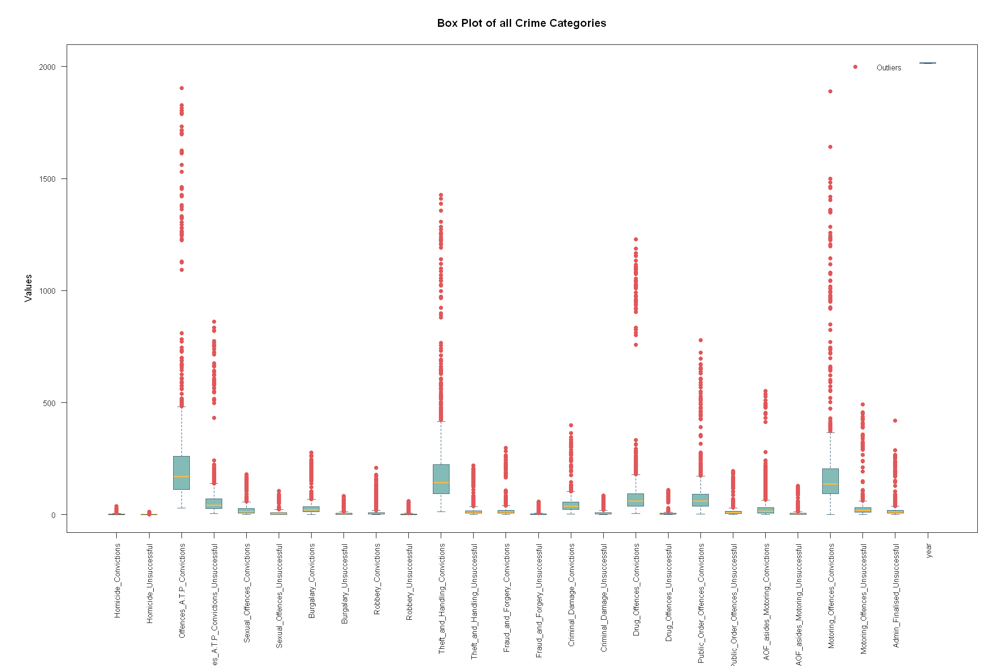

In [1240]:
# Set larger figure size
options(repr.plot.width = 18, repr.plot.height = 12)

# Filter numeric columns in combined_df
numeric_cols <- sapply(combined_df, is.numeric)
numeric_df <- combined_df[, numeric_cols]

# Create a larger plot area
par(mar = c(12, 6, 4, 2))  # Adjust the margins for better spacing

# Get column names for x-axis labels
x_labels <- colnames(numeric_df)

# Rotate x-axis labels by 45 degrees
boxplot(numeric_df, main = "Box Plot of all Crime Categories",
        xlab = "", ylab = "Values",
        col = "#83bcb6", border = "#365c70",
        boxwex = 0.5, outpch = 16, outcol = "#e15759",
        medcol = "#f5b948", whiskcol = "#365c70",
        staplecol = "#365c70", axiscol = "#365c70", names = x_labels,
        las = 2, cex.axis = 0.8)

# Add a legend
legend("topright", legend = c("Outliers"),
       pch = 16, col = "#e15759", pt.cex = 1,
       border = NA, bty = "n", cex = 0.8)

# Adjust plot margins and font size
par(mar = c(10, 6, 4, 2))


From the BOXPLOT, it can be seen that the most crimes convicted are in Offences Against the Person, Theft and Handling and Motoring Offences.

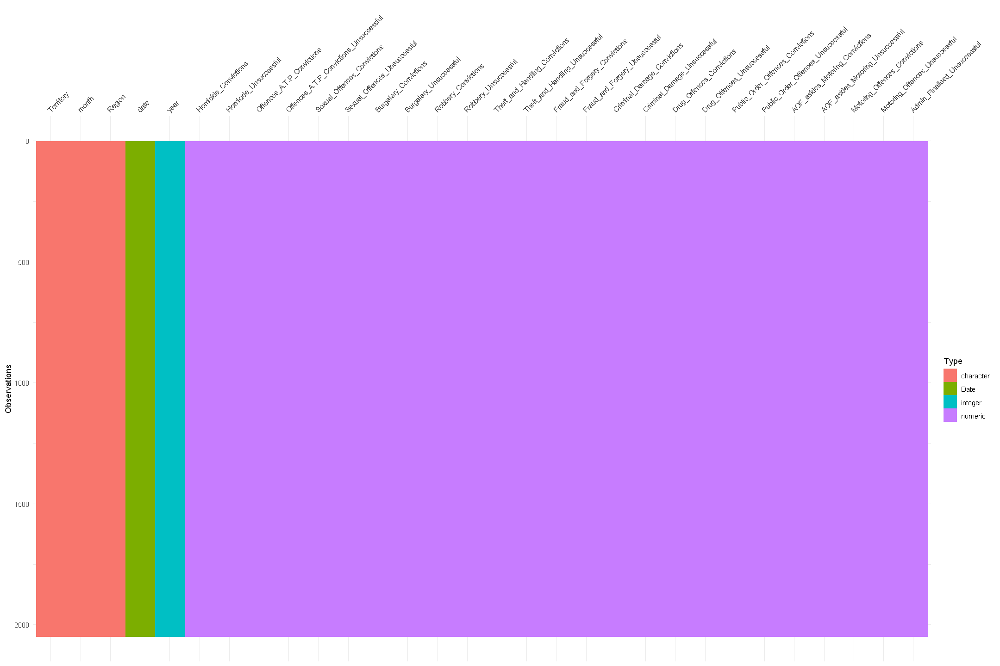

In [1241]:
vis_dat(combined_df)

In [1242]:
#create_report(combined_df)

In [1243]:
object.size(combined_df)

492920 bytes

# Visualise each variable

Homicide convictions

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   1.876   2.000  38.000 

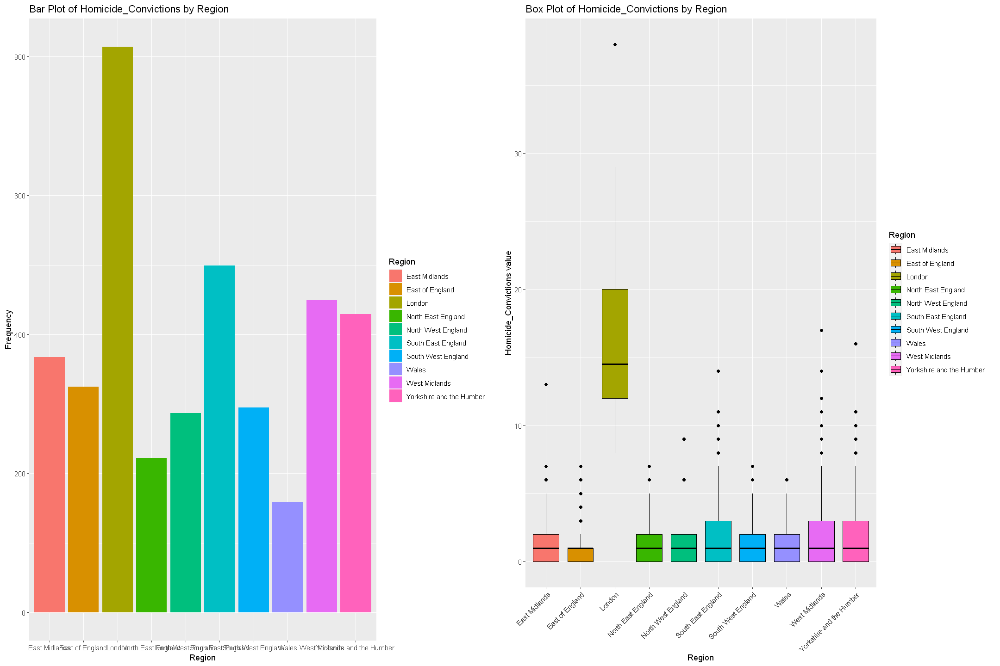

In [1244]:
summary(combined_df$`Homicide_Convictions`)
# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Homicide_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Homicide_Convictions by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Homicide_Convictions, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Homicide_Convictions by Region",
       x = "Region",
       y = "Homicide_Convictions value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)

Homicide_Unsuccessful


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.4537  0.0000 14.0000 

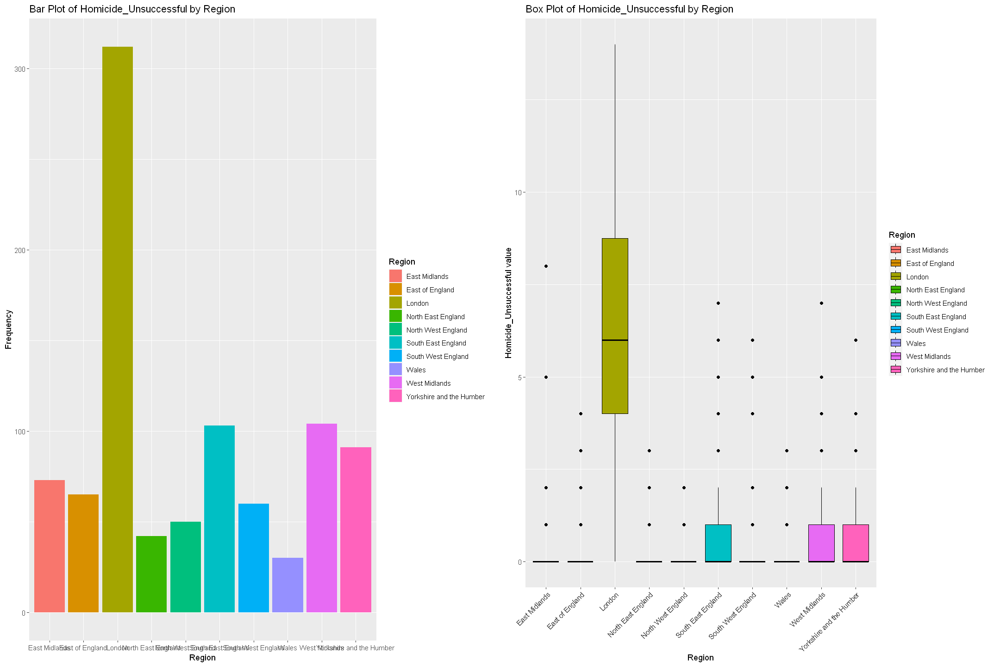

In [1245]:
summary(combined_df$Homicide_Unsuccessful)
# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Homicide_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Homicide_Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Homicide_Unsuccessful, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Homicide_Unsuccessful by Region",
       x = "Region",
       y = "Homicide_Unsuccessful value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)

Offences_A.T.P_Convictions

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   29.0   112.0   171.0   224.7   259.8  1904.0 

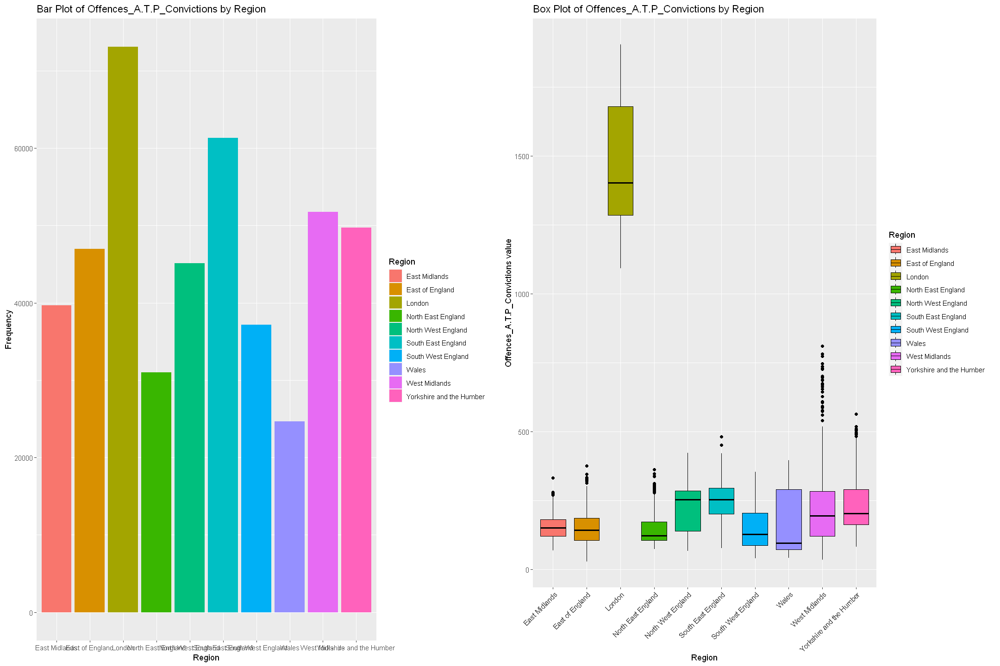

In [1246]:
summary(combined_df$Offences_A.T.P_Convictions)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Offences_A.T.P_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Offences_A.T.P_Convictions by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")

# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Offences_A.T.P_Convictions, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Offences_A.T.P_Convictions by Region",
       x = "Region",
       y = "Offences_A.T.P_Convictions value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Offences A.T.P Unsuccessful

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    5.0    27.0    43.0    67.8    72.0   862.0 

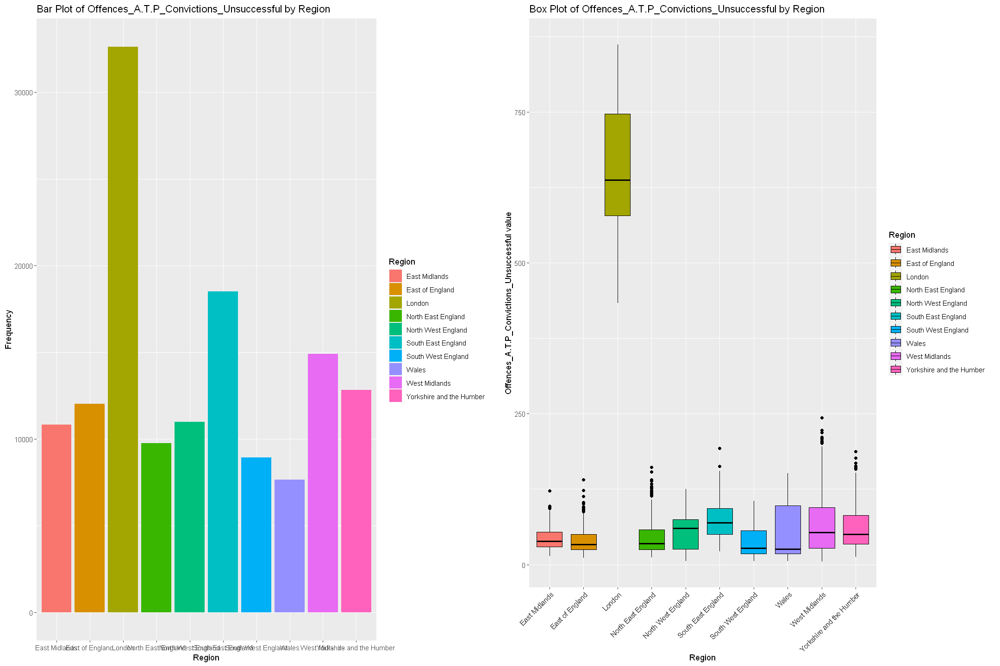

In [1247]:
summary(combined_df$Offences_A.T.P_Convictions_Unsuccessful)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Offences_A.T.P_Convictions_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Offences_A.T.P_Convictions_Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Offences_A.T.P_Convictions_Unsuccessful, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Offences_A.T.P_Convictions_Unsuccessful by Region",
       x = "Region",
       y = "Offences_A.T.P_Convictions_Unsuccessful value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Sexual_Offences_Convictions

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    7.00   14.00   21.34   27.00  181.00 

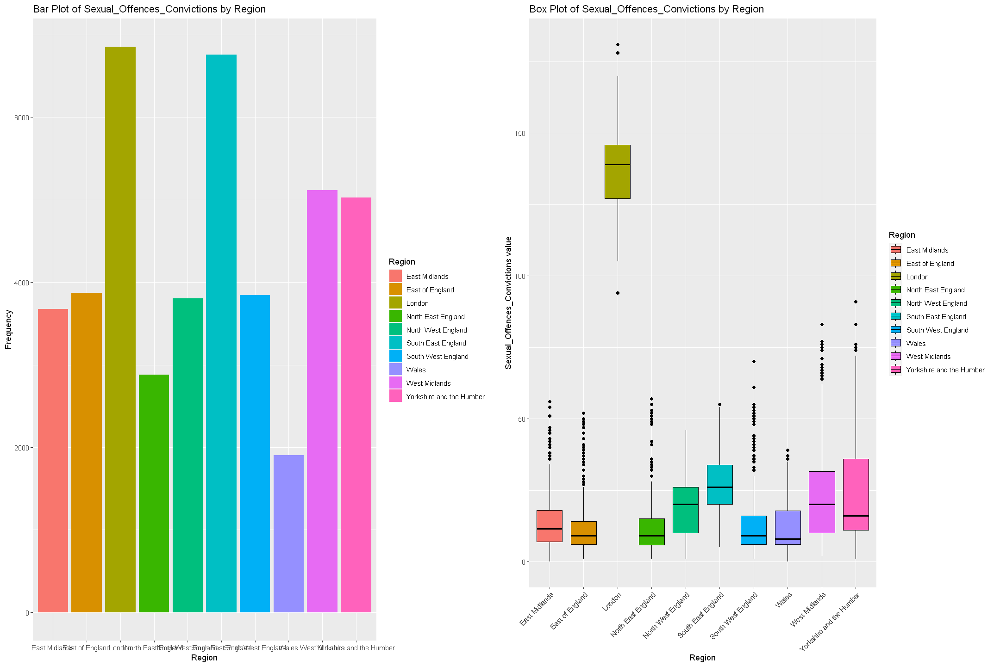

In [1248]:
summary(combined_df$Sexual_Offences_Convictions)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Sexual_Offences_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Sexual_Offences_Convictions by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Sexual_Offences_Convictions, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Sexual_Offences_Convictions by Region",
       x = "Region",
       y = "Sexual_Offences_Convictions value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)

Sexual_offences_Unsuccessful

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   1.000   4.000   7.806  10.000 107.000 

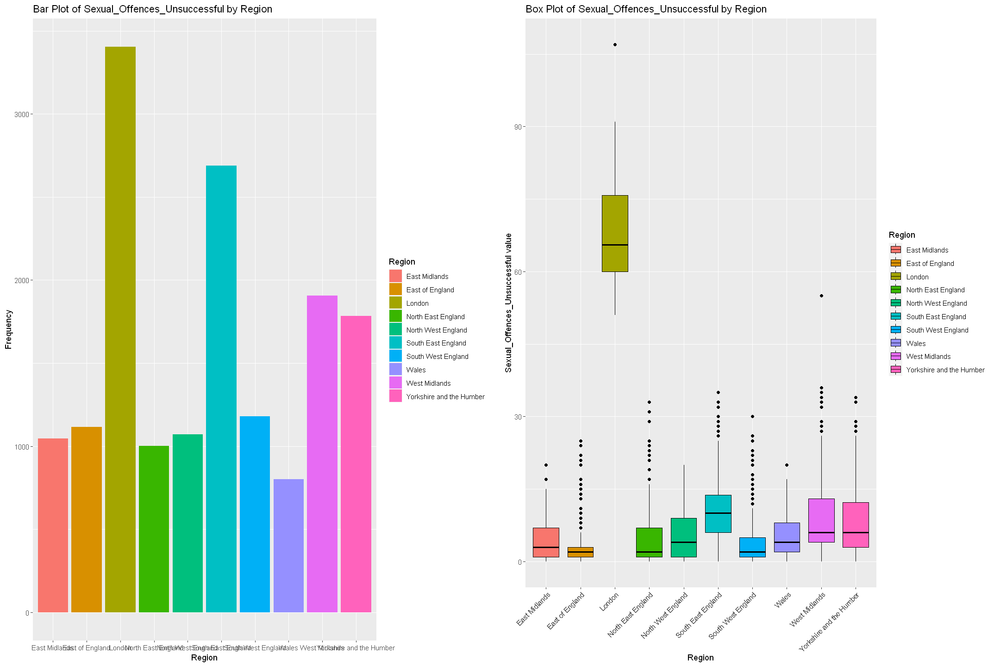

In [1249]:
summary(combined_df$Sexual_Offences_Unsuccessful)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Sexual_Offences_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Sexual_Offences_Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Sexual_Offences_Unsuccessful, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Sexual_Offences_Unsuccessful by Region",
       x = "Region",
       y = "Sexual_Offences_Unsuccessful value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Theft_and_Handling_Convictions

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   13.0    94.0   143.0   188.6   224.0  1426.0 

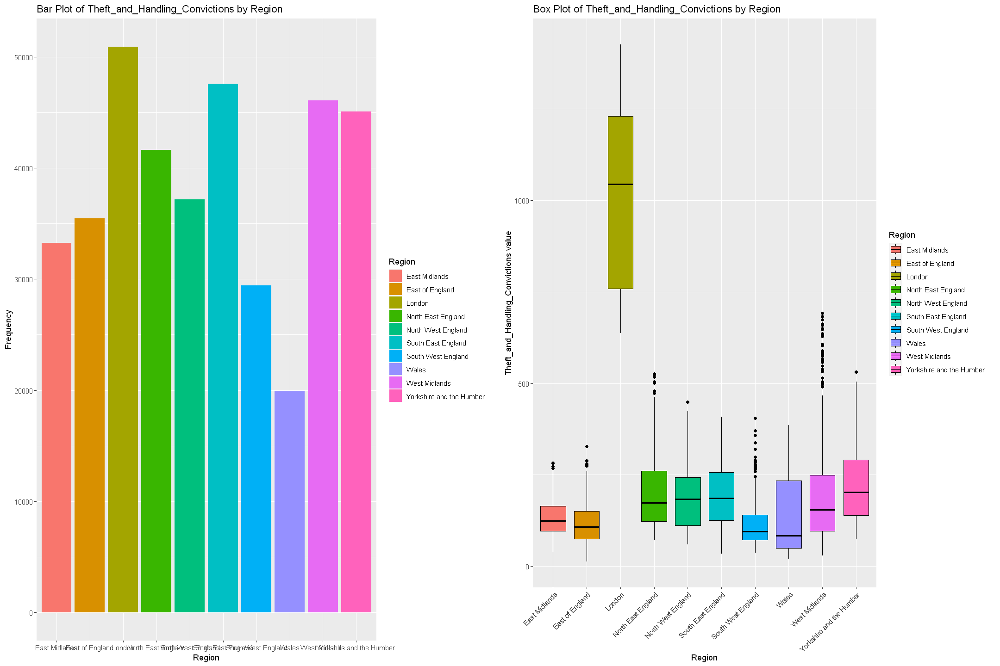

In [1250]:
summary(combined_df$Theft_and_Handling_Convictions)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Theft_and_Handling_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Theft_and_Handling_Convictions by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Theft_and_Handling_Convictions, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Theft_and_Handling_Convictions by Region",
       x = "Region",
       y = "Theft_and_Handling_Convictions value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Theft_and_Handling_Unsuccessful

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    6.00   11.00   17.14   18.00  220.00 

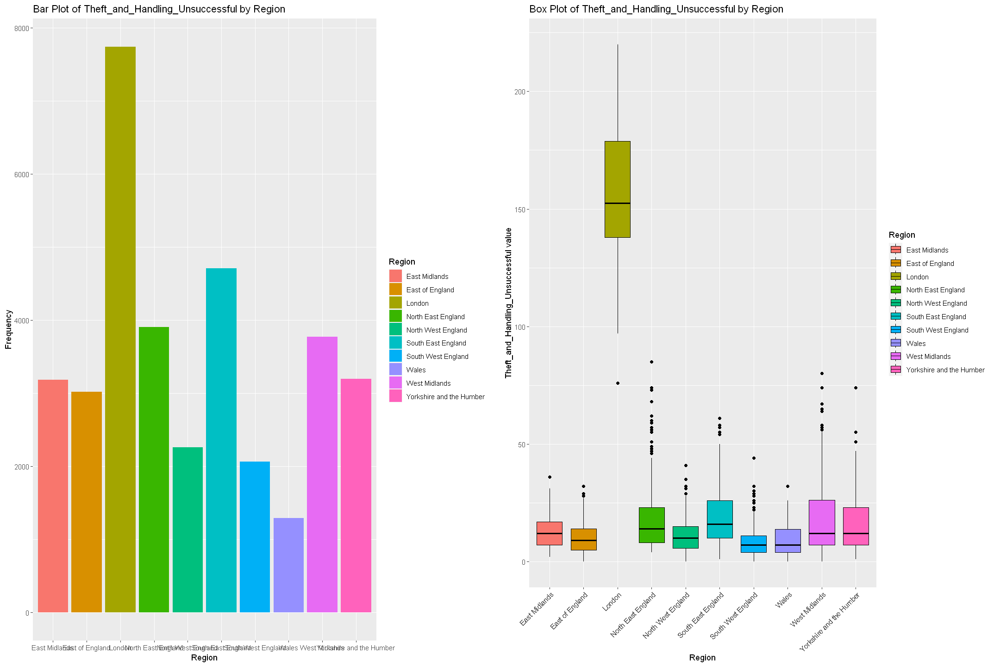

In [1251]:
summary(combined_df$Theft_and_Handling_Unsuccessful)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Theft_and_Handling_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Theft_and_Handling_Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Theft_and_Handling_Unsuccessful, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Theft_and_Handling_Unsuccessful by Region",
       x = "Region",
       y = "Theft_and_Handling_Unsuccessful value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Drug_Offences_Convictions

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   37.00   61.00   94.53   94.00 1228.00 

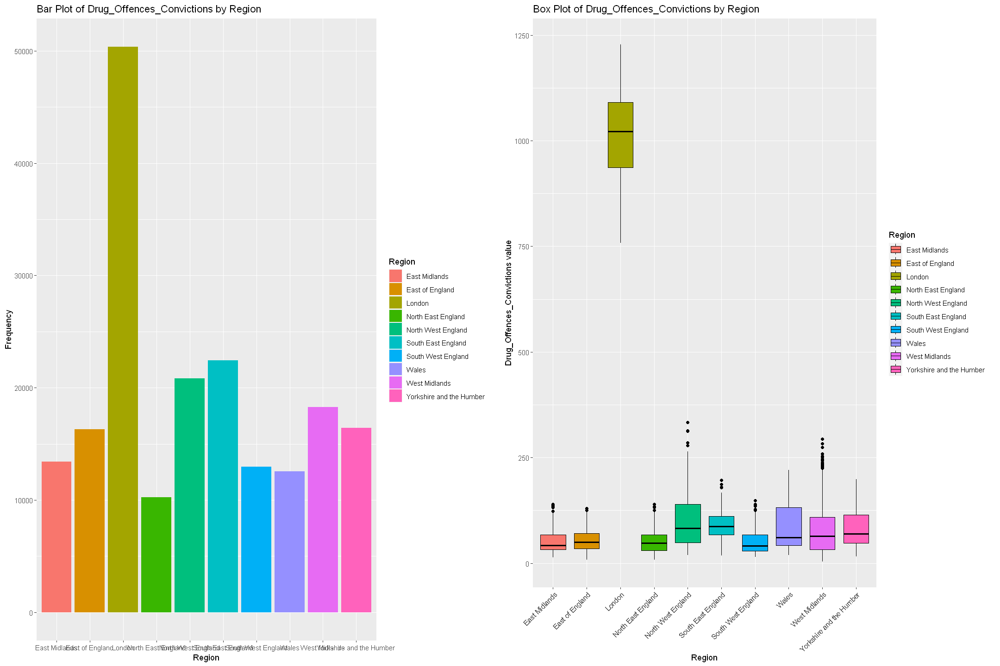

In [1252]:
summary(combined_df$Drug_Offences_Convictions)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Drug_Offences_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Drug_Offences_Convictions by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Drug_Offences_Convictions, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Drug_Offences_Convictions by Region",
       x = "Region",
       y = "Drug_Offences_Convictions value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Drug_Offences_Unsuccessful

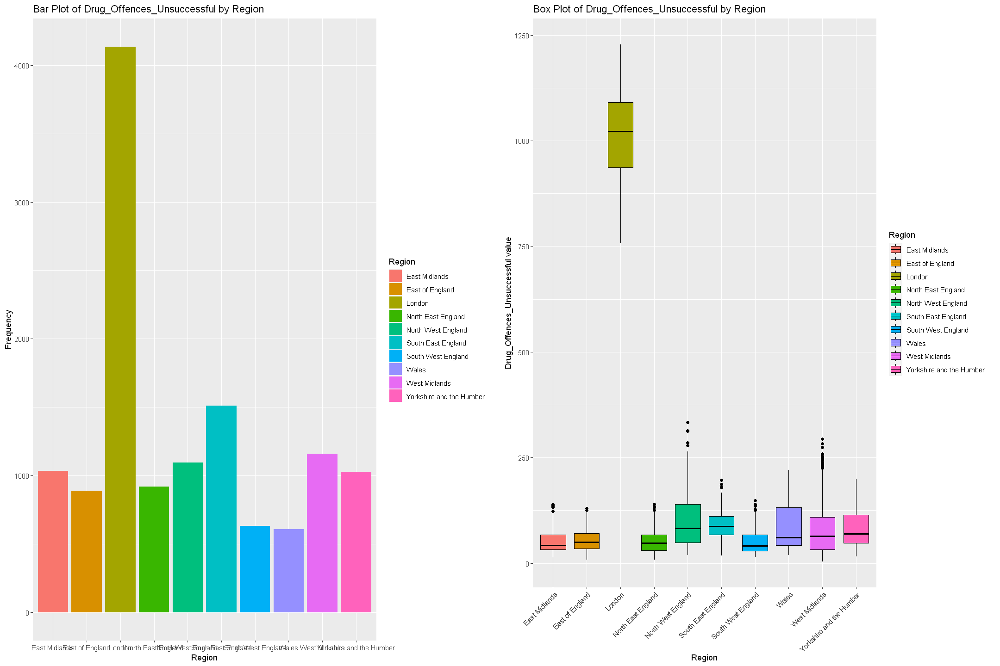

In [1253]:
# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Drug_Offences_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Drug_Offences_Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")

# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Drug_Offences_Convictions, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Drug_Offences_Unsuccessful by Region",
       x = "Region",
       y = "Drug_Offences_Unsuccessful value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Motoring Offences Convictions

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00   93.25  136.00  182.52  204.75 1889.00 

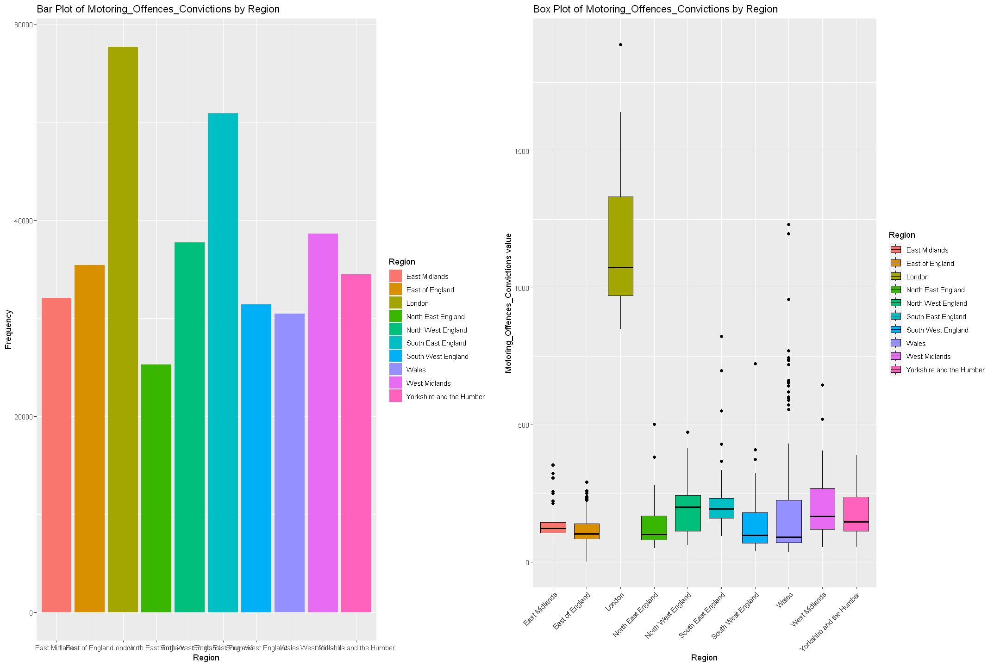

In [1254]:
summary(combined_df$Motoring_Offences_Convictions)

# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Motoring_Offences_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Motoring_Offences_Convictions by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Motoring_Offences_Convictions, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Motoring_Offences_Convictions by Region",
       x = "Region",
       y = "Motoring_Offences_Convictions value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)


Motoring Convictions indicates a high outlier in London region. Initially the dataset presumed that most motoring convictions occured in Metropolitan and City in London. However, the dataset indicates that South West also has some high motoring convictions.

Motoring_Offences_Unsuccessful

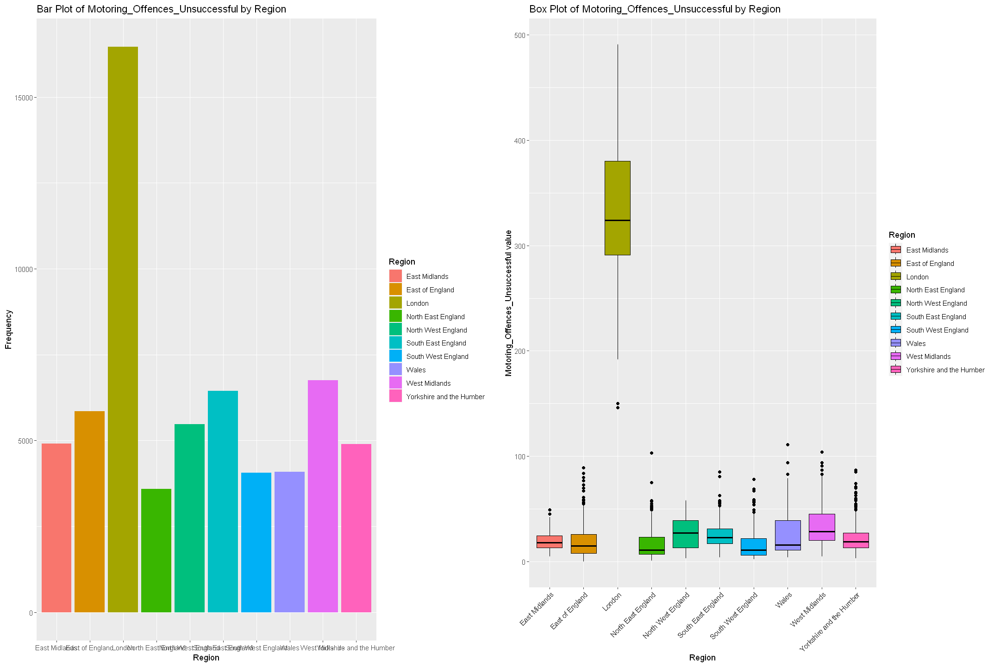

In [1255]:
# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Motoring_Offences_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Motoring_Offences_Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Motoring_Offences_Unsuccessful, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Motoring_Offences_Unsuccessful by Region",
       x = "Region",
       y = "Motoring_Offences_Unsuccessful value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)

Admin_Finalised_Unsuccessful

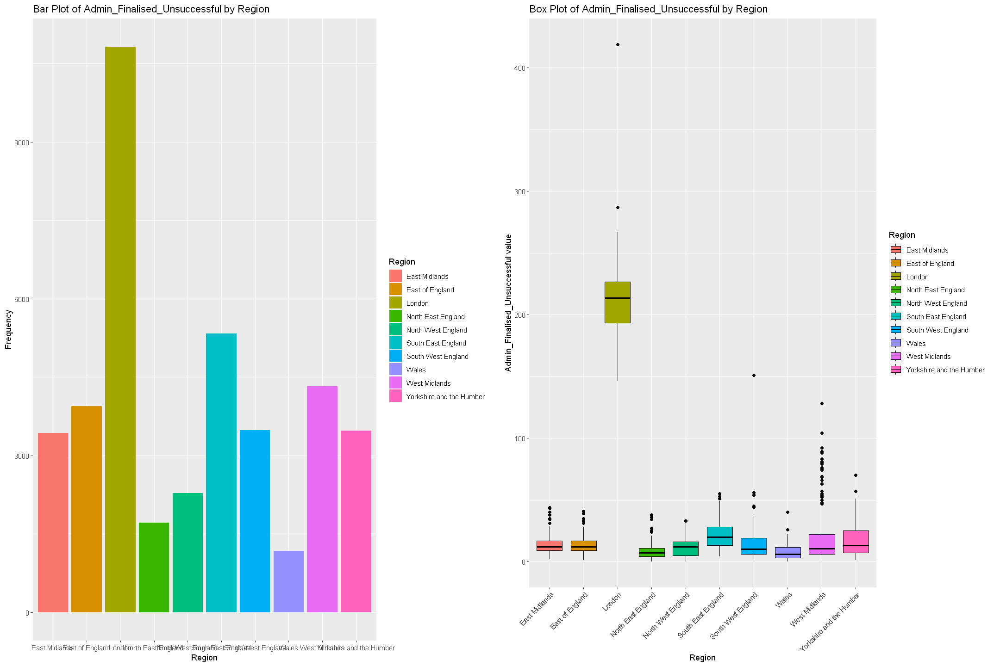

In [1256]:
# Create a bar plot by Region
barplot <- ggplot(data = combined_df, aes(x = Region, y = Admin_Finalised_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Bar Plot of Admin_Finalised_Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  scale_fill_discrete(name = "Region")


# Create a box plot by Region
boxplot <- ggplot(data = combined_df, aes(x = Region, y = Admin_Finalised_Unsuccessful, fill = Region)) +
  geom_boxplot(color = "black") +
  labs(title = "Box Plot of Admin_Finalised_Unsuccessful by Region",
       x = "Region",
       y = "Admin_Finalised_Unsuccessful value") +
  scale_fill_discrete(name = "Region") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

# Arrange the histograms and box plots side by side

grid.arrange(barplot, boxplot, ncol = 2)

In [1257]:
head(combined_df)

,Territory,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,⋯,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year,month,Region,date
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<date>
1,Avon and Somerset,2,0,244,72,27,13,53,2,11,⋯,17,72,17,174,42,19,2014,November,South West England,2014-11-01
2,Avon and Somerset,6,0,348,105,50,26,37,6,10,⋯,17,9,3,220,78,151,2016,January,South West England,2016-01-01
3,Avon and Somerset,2,1,254,71,48,15,37,2,10,⋯,14,10,2,160,14,24,2016,May,South West England,2016-05-01
4,Avon and Somerset,0,0,203,39,48,12,26,5,7,⋯,13,10,3,137,8,36,2017,December,South West England,2017-12-01
5,Avon and Somerset,7,0,300,89,52,18,30,1,8,⋯,19,52,15,196,40,24,2015,July,South West England,2015-07-01
6,Avon and Somerset,5,1,223,75,44,9,30,2,5,⋯,14,61,13,209,46,32,2015,May,South West England,2015-05-01


# Successful 2014 Convictions

In [1258]:
successful_Conviction <- combined_df %>%
select("Homicide_Convictions", "Robbery_Convictions", "Theft_and_Handling_Convictions","Robbery_Convictions", "Theft_and_Handling_Convictions", "Motoring_Offences_Convictions", "Offences_A.T.P_Convictions", "Sexual_Offences_Convictions", "Burgalary_Convictions", "Fraud_and_Forgery_Convictions", "Criminal_Damage_Convictions", "Drug_Offences_Convictions", "Public_Order_Offences_Convictions", "AOF_asides_Motoring_Convictions", "Motoring_Offences_Convictions", "year")

In [1259]:
unsuccessful_Conviction <- combined_df %>%
select("Homicide_Unsuccessful", "Offences_A.T.P_Convictions_Unsuccessful","Sexual_Offences_Unsuccessful","Burgalary_Unsuccessful","Robbery_Unsuccessful","Theft_and_Handling_Unsuccessful","Fraud_and_Forgery_Unsuccessful","Criminal_Damage_Unsuccessful","Drug_Offences_Unsuccessful","Public_Order_Offences_Unsuccessful","AOF_asides_Motoring_Unsuccessful","Motoring_Offences_Unsuccessful","Admin_Finalised_Unsuccessful","year")

In [1260]:
head(unsuccessful_Conviction)

,Homicide_Unsuccessful,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Unsuccessful,Burgalary_Unsuccessful,Robbery_Unsuccessful,Theft_and_Handling_Unsuccessful,Fraud_and_Forgery_Unsuccessful,Criminal_Damage_Unsuccessful,Drug_Offences_Unsuccessful,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,0,72,13,2,1,15,4,7,9,17,17,42,19,2014
2,0,105,26,6,0,26,4,11,6,17,3,78,151,2016
3,1,71,15,2,0,14,1,10,3,14,2,14,24,2016
4,0,39,12,5,1,7,0,3,3,13,3,8,36,2017
5,0,89,18,1,1,16,3,11,12,19,15,40,24,2015
6,1,75,9,2,1,10,5,5,6,14,13,46,32,2015


In [1261]:
head(successful_Conviction)

,Homicide_Convictions,Robbery_Convictions,Theft_and_Handling_Convictions,Motoring_Offences_Convictions,Offences_A.T.P_Convictions,Sexual_Offences_Convictions,Burgalary_Convictions,Fraud_and_Forgery_Convictions,Criminal_Damage_Convictions,Drug_Offences_Convictions,Public_Order_Offences_Convictions,AOF_asides_Motoring_Convictions,year
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,2,11,260,174,244,27,53,15,72,90,65,72,2014
2,6,10,203,220,348,50,37,18,55,127,63,9,2016
3,2,10,188,160,254,48,37,25,52,71,59,10,2016
4,0,7,126,137,203,48,26,19,38,61,64,10,2017
5,7,8,246,196,300,52,30,18,81,121,98,52,2015
6,5,5,237,209,223,44,30,18,59,92,82,61,2015


In [1262]:
head(unsuccessful_Conviction)

,Homicide_Unsuccessful,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Unsuccessful,Burgalary_Unsuccessful,Robbery_Unsuccessful,Theft_and_Handling_Unsuccessful,Fraud_and_Forgery_Unsuccessful,Criminal_Damage_Unsuccessful,Drug_Offences_Unsuccessful,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,year
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,0,72,13,2,1,15,4,7,9,17,17,42,19,2014
2,0,105,26,6,0,26,4,11,6,17,3,78,151,2016
3,1,71,15,2,0,14,1,10,3,14,2,14,24,2016
4,0,39,12,5,1,7,0,3,3,13,3,8,36,2017
5,0,89,18,1,1,16,3,11,12,19,15,40,24,2015
6,1,75,9,2,1,10,5,5,6,14,13,46,32,2015


successful_Conviction_category <- colnames(successful_Conviction)[1:12]

df_sum_conv <- colSums(successful_Conviction[successful_Conviction$year == 2015,][, 1:12])

df_sum_conv

df_sum_conv_dtframe2015 <- data.frame(successful_Conviction_category = successful_Conviction_category, sum = df_sum_conv, row.names = NULL)

df_sum_conv_dtframe2015

#plot the total sum of convictions for the year 2015

ggplot(df_sum_conv_dtframe2015, aes(x = sum, y = successful_Conviction_category, fill = successful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Convictions by offences for Year 2015")

In [1263]:
successful_Conviction_category <- colnames(successful_Conviction)[1:12]

In [1264]:
df_sum_conv <- colSums(successful_Conviction[successful_Conviction$year == 2014,][, 1:12])

In [1265]:
df_sum_conv

Homicide_Convictions               Robbery_Convictions 
                              709                              6037 
   Theft_and_Handling_Convictions     Motoring_Offences_Convictions 
                           115271                            104311 
       Offences_A.T.P_Convictions       Sexual_Offences_Convictions 
                            98328                              8813 
            Burgalary_Convictions     Fraud_and_Forgery_Convictions 
                            17506                              8441 
      Criminal_Damage_Convictions         Drug_Offences_Convictions 
                            27236                             51670 
Public_Order_Offences_Convictions   AOF_asides_Motoring_Convictions 
                            45713                             30937

In [1266]:
#convert the df_total_sum_conv to a dataframe


df_sum_conv_dtframe2014 <- data.frame(successful_Conviction_category = successful_Conviction_category, sum = df_sum_conv, row.names = NULL)

In [1267]:
df_sum_conv_dtframe2014

successful_Conviction_category,sum
<chr>,<dbl>
Homicide_Convictions,709
Robbery_Convictions,6037
Theft_and_Handling_Convictions,115271
Motoring_Offences_Convictions,104311
Offences_A.T.P_Convictions,98328
Sexual_Offences_Convictions,8813
Burgalary_Convictions,17506
Fraud_and_Forgery_Convictions,8441
Criminal_Damage_Convictions,27236


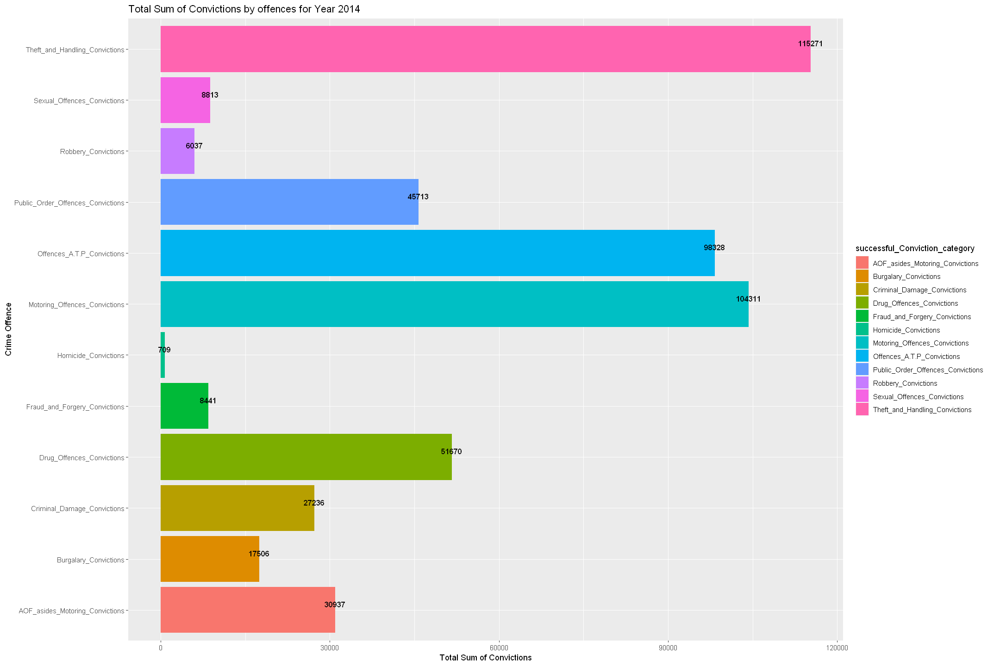

In [1268]:
#plot the total sum of convictions for the year 2018

ggplot(df_sum_conv_dtframe2014, aes(x = sum, y = successful_Conviction_category, fill = successful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Convictions by offences for Year 2014")

Theft and handling had a count of over 100,000.Over 94000 counts of offences against people were successfully prosecuted by the Crown prosecution department in 2014 under the Offences Against the Person column. 


# Unsuccessful convictions 2014

In [1269]:
unsuccessful_Conviction_category <- colnames(unsuccessful_Conviction)[1:12]

In [1270]:
df_sum_unsuccessful_conv <- colSums(unsuccessful_Conviction[unsuccessful_Conviction$year == 2014,][, 1:12])

In [1271]:
df_sum_unsuccessful_conv

Homicide_Unsuccessful Offences_A.T.P_Convictions_Unsuccessful 
                                    180                                   34050 
           Sexual_Offences_Unsuccessful                  Burgalary_Unsuccessful 
                                   3520                                    3129 
                   Robbery_Unsuccessful         Theft_and_Handling_Unsuccessful 
                                   1708                                   11073 
         Fraud_and_Forgery_Unsuccessful            Criminal_Damage_Unsuccessful 
                                   1390                                    4900 
             Drug_Offences_Unsuccessful      Public_Order_Offences_Unsuccessful 
                                   3429                                    8310 
       AOF_asides_Motoring_Unsuccessful          Motoring_Offences_Unsuccessful 
                                   6043                                   15828

In [1272]:
df_sum_unsuccessful_conv_dtframe2014 <- data.frame(unsuccessful_Conviction_category = unsuccessful_Conviction_category, sum = df_sum_unsuccessful_conv, row.names = NULL)

In [1273]:
df_sum_unsuccessful_conv_dtframe2014

unsuccessful_Conviction_category,sum
<chr>,<dbl>
Homicide_Unsuccessful,180
Offences_A.T.P_Convictions_Unsuccessful,34050
Sexual_Offences_Unsuccessful,3520
Burgalary_Unsuccessful,3129
Robbery_Unsuccessful,1708
Theft_and_Handling_Unsuccessful,11073
Fraud_and_Forgery_Unsuccessful,1390
Criminal_Damage_Unsuccessful,4900
Drug_Offences_Unsuccessful,3429


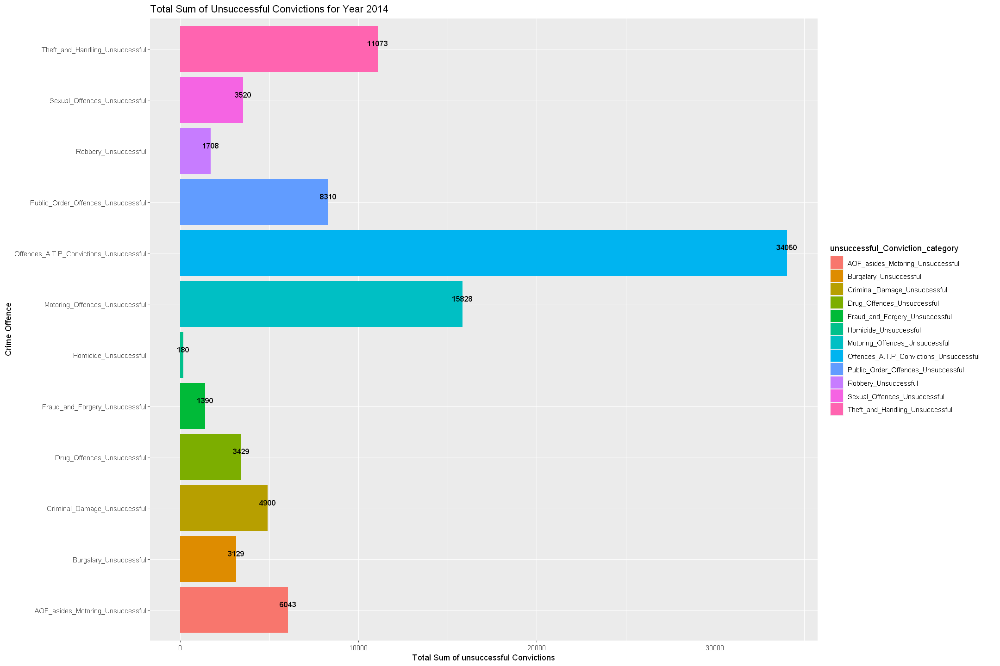

In [1274]:
#plot the total sum of Unsuccessful convictions for the year 2014

ggplot(df_sum_unsuccessful_conv_dtframe2014, aes(x = sum, y = unsuccessful_Conviction_category, fill = unsuccessful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of unsuccessful Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Unsuccessful Convictions for Year 2014")

The Crown prosecution service has 34,050 unsuccessful convictions listed under the Offences Against the Person category.
This means that despite the efforts made by the Crown Prosecution Department, they were unable to secure convictions in these specific cases related to offences against individuals.

# Successful (2015) Convictions

In [1275]:
successful_Conviction_category <- colnames(successful_Conviction)[1:12]

df_sum_conv <- colSums(successful_Conviction[successful_Conviction$year == 2015,][, 1:12])

df_sum_conv

df_sum_conv_dtframe2015 <- data.frame(successful_Conviction_category = successful_Conviction_category, sum = df_sum_conv, row.names = NULL)

df_sum_conv_dtframe2015


Homicide_Convictions               Robbery_Convictions 
                              740                              4533 
   Theft_and_Handling_Convictions     Motoring_Offences_Convictions 
                            95132                             84508 
       Offences_A.T.P_Convictions       Sexual_Offences_Convictions 
                           104677                              9457 
            Burgalary_Convictions     Fraud_and_Forgery_Convictions 
                            14425                              8289 
      Criminal_Damage_Convictions         Drug_Offences_Convictions 
                            24159                             44138 
Public_Order_Offences_Convictions   AOF_asides_Motoring_Convictions 
                            38259                             16864

successful_Conviction_category,sum
<chr>,<dbl>
Homicide_Convictions,740
Robbery_Convictions,4533
Theft_and_Handling_Convictions,95132
Motoring_Offences_Convictions,84508
Offences_A.T.P_Convictions,104677
Sexual_Offences_Convictions,9457
Burgalary_Convictions,14425
Fraud_and_Forgery_Convictions,8289
Criminal_Damage_Convictions,24159


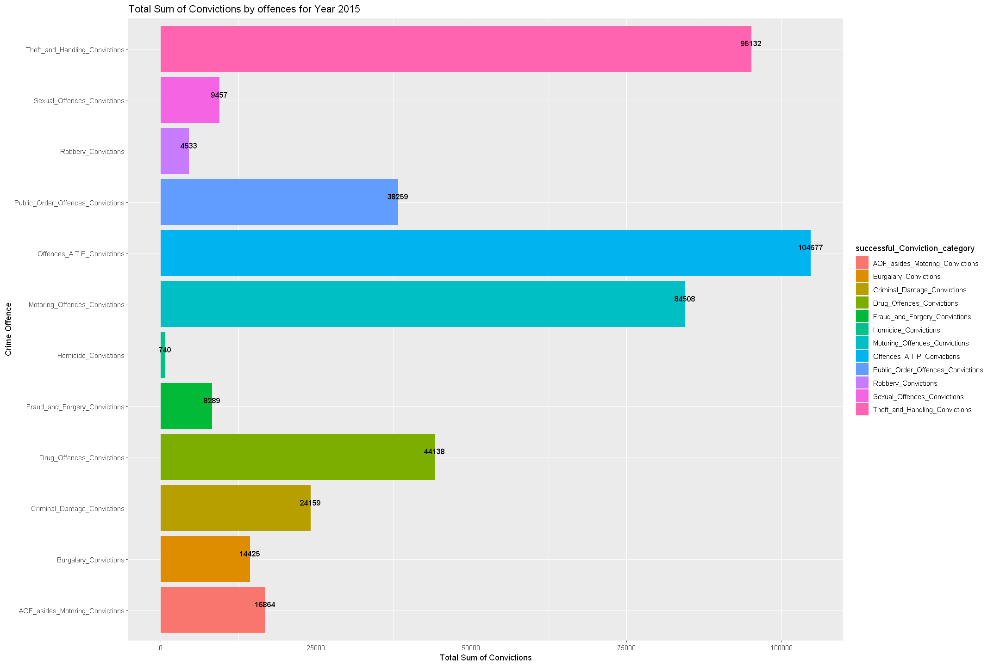

In [1276]:
#plot the total sum of convictions for the year 2015

ggplot(df_sum_conv_dtframe2015, aes(x = sum, y = successful_Conviction_category, fill = successful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Convictions by offences for Year 2015")

# Unsuccessful Convictions (2015)

In [1277]:
unsuccessful_Convictions <- combined_df %>%
select("Homicide_Unsuccessful", "Robbery_Unsuccessful", "Theft_and_Handling_Unsuccessful", "Motoring_Offences_Unsuccessful", "Offences_A.T.P_Convictions_Unsuccessful", "Sexual_Offences_Unsuccessful", "Burgalary_Unsuccessful", "Fraud_and_Forgery_Unsuccessful", "Criminal_Damage_Unsuccessful", "Drug_Offences_Unsuccessful", "Public_Order_Offences_Unsuccessful", "AOF_asides_Motoring_Unsuccessful", "Motoring_Offences_Unsuccessful", "year")

In [1278]:
head(unsuccessful_Convictions)

,Homicide_Unsuccessful,Robbery_Unsuccessful,Theft_and_Handling_Unsuccessful,Motoring_Offences_Unsuccessful,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Unsuccessful,Burgalary_Unsuccessful,Fraud_and_Forgery_Unsuccessful,Criminal_Damage_Unsuccessful,Drug_Offences_Unsuccessful,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Unsuccessful,year
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,0,1,15,42,72,13,2,4,7,9,17,17,2014
2,0,0,26,78,105,26,6,4,11,6,17,3,2016
3,1,0,14,14,71,15,2,1,10,3,14,2,2016
4,0,1,7,8,39,12,5,0,3,3,13,3,2017
5,0,1,16,40,89,18,1,3,11,12,19,15,2015
6,1,1,10,46,75,9,2,5,5,6,14,13,2015


In [1279]:
unsuccessful_Conviction_category <- colnames(unsuccessful_Convictions)[1:12]

In [1280]:
df_sum_unsuccessful_conv <- colSums(unsuccessful_Convictions[unsuccessful_Convictions$year == 2015,][, 1:12])

In [1281]:
df_sum_unsuccessful_conv

Homicide_Unsuccessful                    Robbery_Unsuccessful 
                                    173                                    1271 
        Theft_and_Handling_Unsuccessful          Motoring_Offences_Unsuccessful 
                                   8878                                   15310 
Offences_A.T.P_Convictions_Unsuccessful            Sexual_Offences_Unsuccessful 
                                  33981                                    3637 
                 Burgalary_Unsuccessful          Fraud_and_Forgery_Unsuccessful 
                                   2705                                    1466 
           Criminal_Damage_Unsuccessful              Drug_Offences_Unsuccessful 
                                   4354                                    2950 
     Public_Order_Offences_Unsuccessful        AOF_asides_Motoring_Unsuccessful 
                                   7098                                    3491

In [1282]:
df_sum_unsuccessful_conv_dtframe2015 <- data.frame(unsuccessful_Conviction_category = unsuccessful_Conviction_category, sum = df_sum_unsuccessful_conv, row.names = NULL)

In [1283]:
df_sum_unsuccessful_conv_dtframe2015

unsuccessful_Conviction_category,sum
<chr>,<dbl>
Homicide_Unsuccessful,173
Robbery_Unsuccessful,1271
Theft_and_Handling_Unsuccessful,8878
Motoring_Offences_Unsuccessful,15310
Offences_A.T.P_Convictions_Unsuccessful,33981
Sexual_Offences_Unsuccessful,3637
Burgalary_Unsuccessful,2705
Fraud_and_Forgery_Unsuccessful,1466
Criminal_Damage_Unsuccessful,4354


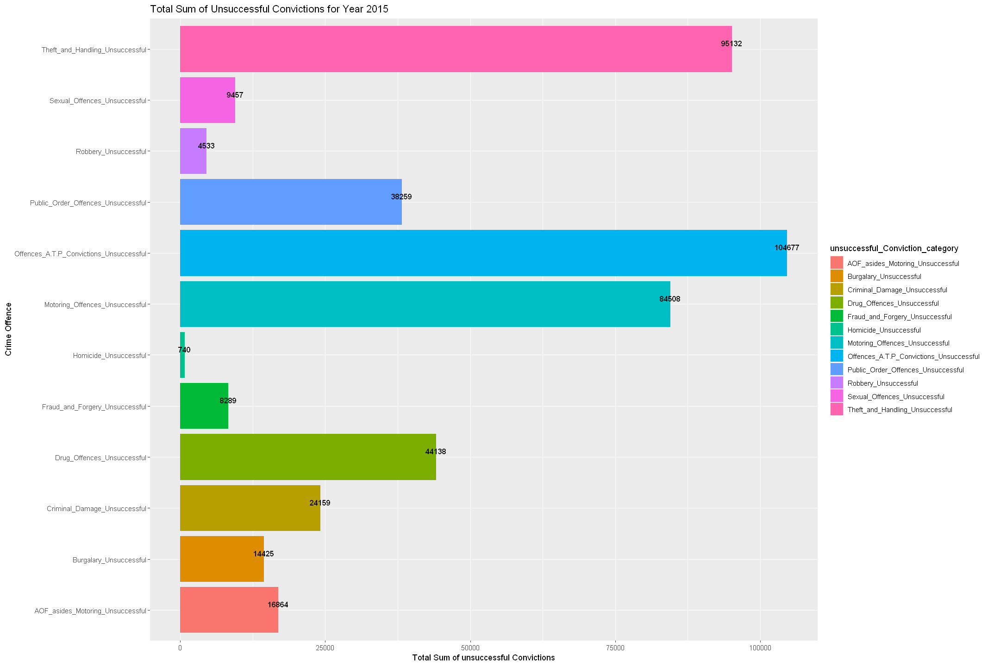

In [1284]:
#plot the total sum of convictions for the year 2015

ggplot(df_sum_conv_dtframe2015, aes(x = sum, y = unsuccessful_Conviction_category, fill = unsuccessful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of unsuccessful Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Unsuccessful Convictions for Year 2015")

# Successful Convictions (2016)

In [1285]:
successful_Conviction_category <- colnames(successful_Conviction)[1:12]

df_sum_conv <- colSums(successful_Conviction[successful_Conviction$year == 2016,][, 1:12])

df_sum_conv

df_sum_conv_dtframe2016 <- data.frame(successful_Conviction_category = successful_Conviction_category, sum = df_sum_conv, row.names = NULL)

df_sum_conv_dtframe2016


Homicide_Convictions               Robbery_Convictions 
                              950                              3378 
   Theft_and_Handling_Convictions     Motoring_Offences_Convictions 
                            72011                             70155 
       Offences_A.T.P_Convictions       Sexual_Offences_Convictions 
                           100384                              9879 
            Burgalary_Convictions     Fraud_and_Forgery_Convictions 
                            11292                              8901 
      Criminal_Damage_Convictions         Drug_Offences_Convictions 
                            18238                             39393 
Public_Order_Offences_Convictions   AOF_asides_Motoring_Convictions 
                            31835                              6916

successful_Conviction_category,sum
<chr>,<dbl>
Homicide_Convictions,950
Robbery_Convictions,3378
Theft_and_Handling_Convictions,72011
Motoring_Offences_Convictions,70155
Offences_A.T.P_Convictions,100384
Sexual_Offences_Convictions,9879
Burgalary_Convictions,11292
Fraud_and_Forgery_Convictions,8901
Criminal_Damage_Convictions,18238


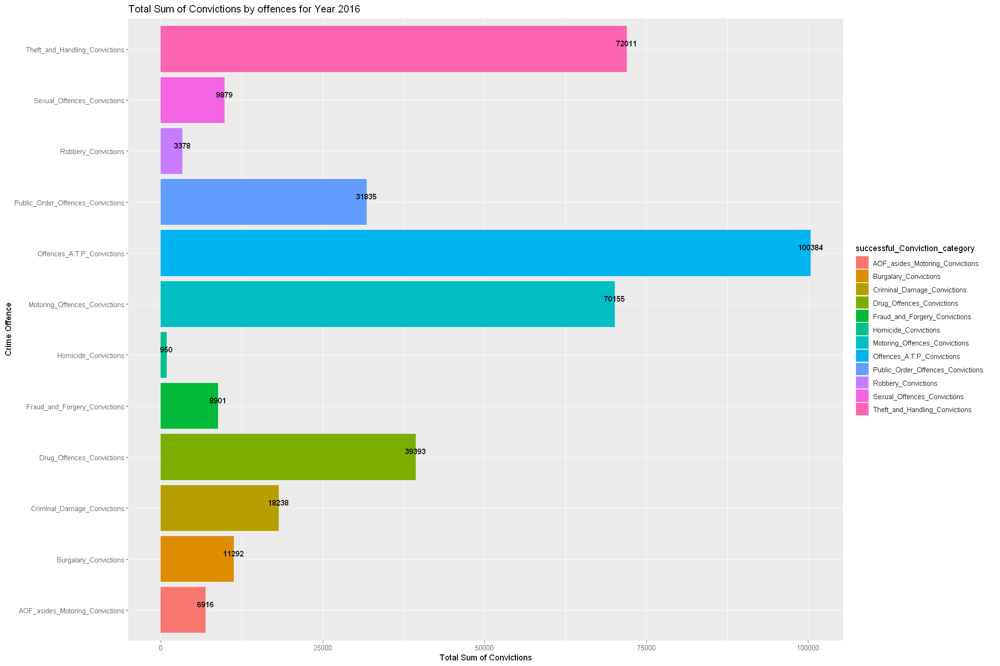

In [1286]:
#plot the total sum of convictions for the year 2016

ggplot(df_sum_conv_dtframe2016, aes(x = sum, y = successful_Conviction_category, fill = successful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Convictions by offences for Year 2016")

# Unsuccessful convictions 2016

In [1287]:
unsuccessful_Conviction_category <- colnames(unsuccessful_Convictions)[1:12]

df_sum_unsuccessful_conv <- colSums(unsuccessful_Convictions[unsuccessful_Convictions$year == 2016,][, 1:12])

df_sum_unsuccessful_conv

df_sum_unsuccessful_conv_dtframe2016 <- data.frame(unsuccessful_Conviction_category = unsuccessful_Conviction_category, sum = df_sum_unsuccessful_conv, row.names = NULL)

df_sum_unsuccessful_conv_dtframe2016


Homicide_Unsuccessful                    Robbery_Unsuccessful 
                                    224                                     913 
        Theft_and_Handling_Unsuccessful          Motoring_Offences_Unsuccessful 
                                   6345                                   12398 
Offences_A.T.P_Convictions_Unsuccessful            Sexual_Offences_Unsuccessful 
                                  28565                                    3584 
                 Burgalary_Unsuccessful          Fraud_and_Forgery_Unsuccessful 
                                   2033                                    1454 
           Criminal_Damage_Unsuccessful              Drug_Offences_Unsuccessful 
                                   3374                                    2626 
     Public_Order_Offences_Unsuccessful        AOF_asides_Motoring_Unsuccessful 
                                   5851                                    1109

unsuccessful_Conviction_category,sum
<chr>,<dbl>
Homicide_Unsuccessful,224
Robbery_Unsuccessful,913
Theft_and_Handling_Unsuccessful,6345
Motoring_Offences_Unsuccessful,12398
Offences_A.T.P_Convictions_Unsuccessful,28565
Sexual_Offences_Unsuccessful,3584
Burgalary_Unsuccessful,2033
Fraud_and_Forgery_Unsuccessful,1454
Criminal_Damage_Unsuccessful,3374


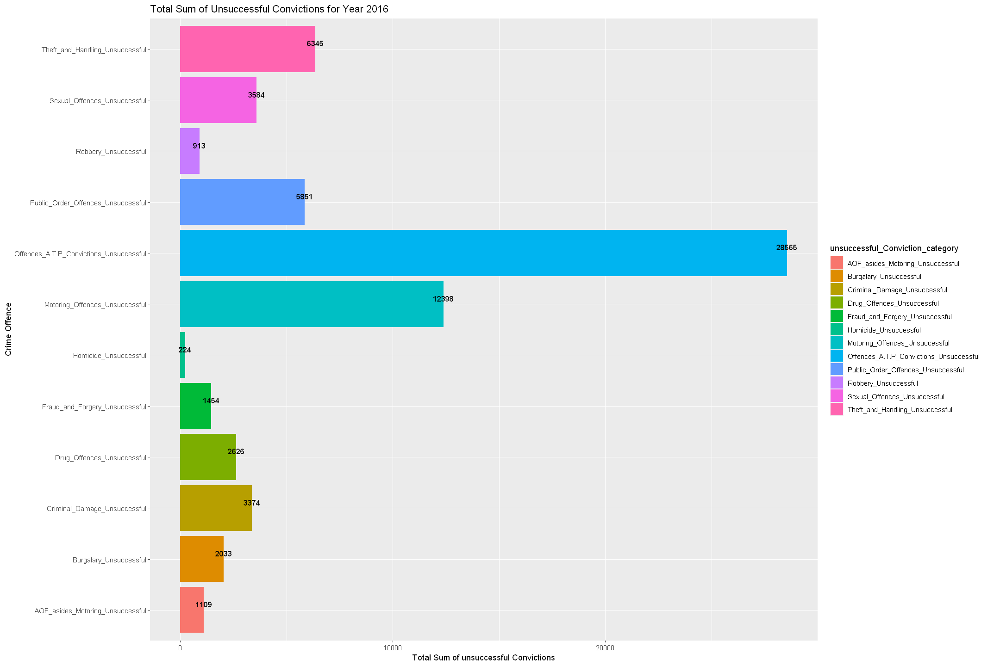

In [1288]:
#plot the total sum of Unsuccessful convictions for the year 2016

ggplot(df_sum_unsuccessful_conv_dtframe2016, aes(x = sum, y = unsuccessful_Conviction_category, fill = unsuccessful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of unsuccessful Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Unsuccessful Convictions for Year 2016")

# Successful Convictions (2017)

In [1289]:
successful_Conviction_category <- colnames(successful_Conviction)[1:12]

df_sum_conv <- colSums(successful_Conviction[successful_Conviction$year == 2017,][, 1:12])

df_sum_conv


Homicide_Convictions               Robbery_Convictions 
                              768                              2894 
   Theft_and_Handling_Convictions     Motoring_Offences_Convictions 
                            57724                             61470 
       Offences_A.T.P_Convictions       Sexual_Offences_Convictions 
                            85145                              8478 
            Burgalary_Convictions     Fraud_and_Forgery_Convictions 
                             9764                              7661 
      Criminal_Damage_Convictions         Drug_Offences_Convictions 
                            15146                             31854 
Public_Order_Offences_Convictions   AOF_asides_Motoring_Convictions 
                            26575                              6249

In [1290]:
df_sum_conv_dtframe2017 <- data.frame(successful_Conviction_category = successful_Conviction_category, sum = df_sum_conv, row.names = NULL)

df_sum_conv_dtframe2017

successful_Conviction_category,sum
<chr>,<dbl>
Homicide_Convictions,768
Robbery_Convictions,2894
Theft_and_Handling_Convictions,57724
Motoring_Offences_Convictions,61470
Offences_A.T.P_Convictions,85145
Sexual_Offences_Convictions,8478
Burgalary_Convictions,9764
Fraud_and_Forgery_Convictions,7661
Criminal_Damage_Convictions,15146


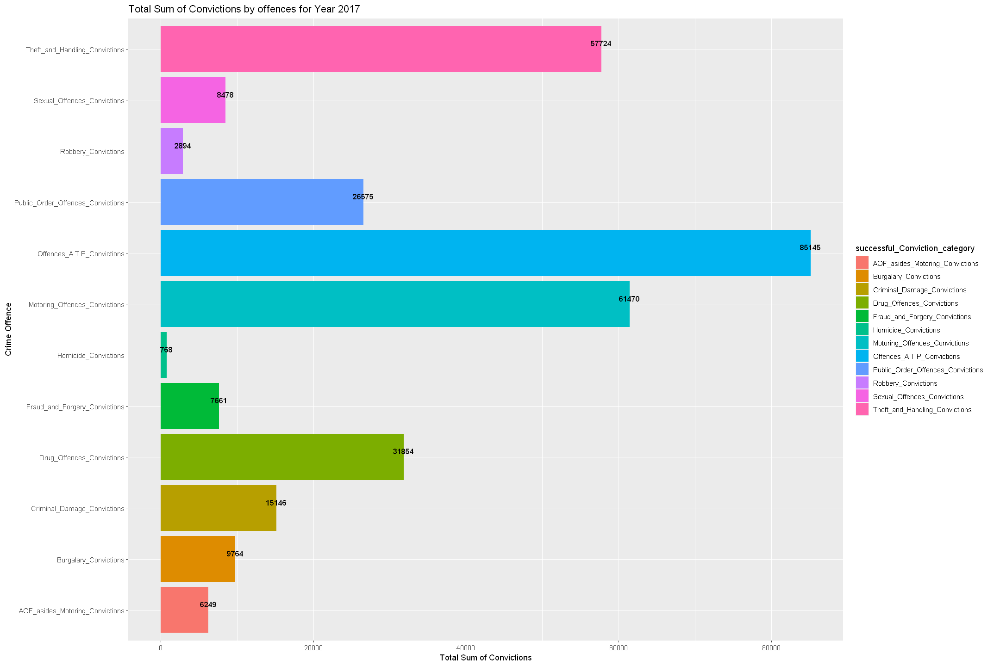

In [1291]:
#plot the total sum of convictions for the year 2017

ggplot(df_sum_conv_dtframe2017, aes(x = sum, y = successful_Conviction_category, fill = successful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Convictions by offences for Year 2017")

# Unsuccessful Convictions (2017)

In [1292]:
unsuccessful_Conviction_category <- colnames(unsuccessful_Convictions)[1:12]

df_sum_unsuccessful_conv <- colSums(unsuccessful_Convictions[unsuccessful_Convictions$year == 2017,][, 1:12])

df_sum_unsuccessful_conv

df_sum_unsuccessful_conv_dtframe2017 <- data.frame(unsuccessful_Conviction_category = unsuccessful_Conviction_category, sum = df_sum_unsuccessful_conv, row.names = NULL)

df_sum_unsuccessful_conv_dtframe2017


Homicide_Unsuccessful                    Robbery_Unsuccessful 
                                    196                                     784 
        Theft_and_Handling_Unsuccessful          Motoring_Offences_Unsuccessful 
                                   4849                                    9943 
Offences_A.T.P_Convictions_Unsuccessful            Sexual_Offences_Unsuccessful 
                                  23086                                    2899 
                 Burgalary_Unsuccessful          Fraud_and_Forgery_Unsuccessful 
                                   1496                                    1164 
           Criminal_Damage_Unsuccessful              Drug_Offences_Unsuccessful 
                                   2411                                    2131 
     Public_Order_Offences_Unsuccessful        AOF_asides_Motoring_Unsuccessful 
                                   4527                                     948

unsuccessful_Conviction_category,sum
<chr>,<dbl>
Homicide_Unsuccessful,196
Robbery_Unsuccessful,784
Theft_and_Handling_Unsuccessful,4849
Motoring_Offences_Unsuccessful,9943
Offences_A.T.P_Convictions_Unsuccessful,23086
Sexual_Offences_Unsuccessful,2899
Burgalary_Unsuccessful,1496
Fraud_and_Forgery_Unsuccessful,1164
Criminal_Damage_Unsuccessful,2411


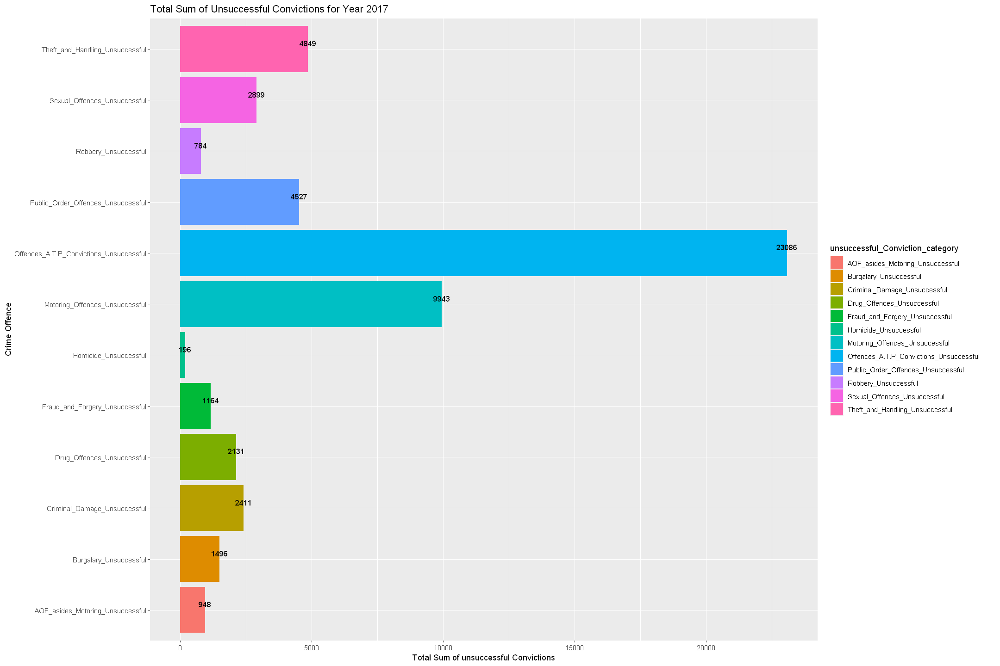

In [1293]:
#plot the total sum of Unsuccessful convictions for the year 2016

ggplot(df_sum_unsuccessful_conv_dtframe2017, aes(x = sum, y = unsuccessful_Conviction_category, fill = unsuccessful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of unsuccessful Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Unsuccessful Convictions for Year 2017")

# Successful Convictions (2018)

In [1294]:
successful_Conviction_category <- colnames(successful_Conviction)[1:12]

df_sum_conv <- colSums(successful_Conviction[successful_Conviction$year == 2018,][, 1:12])

df_sum_conv


Homicide_Convictions               Robbery_Convictions 
                              679                              2551 
   Theft_and_Handling_Convictions     Motoring_Offences_Convictions 
                            46555                             53732 
       Offences_A.T.P_Convictions       Sexual_Offences_Convictions 
                            72056                              7114 
            Burgalary_Convictions     Fraud_and_Forgery_Convictions 
                             8190                              6458 
      Criminal_Damage_Convictions         Drug_Offences_Convictions 
                            12723                             26723 
Public_Order_Offences_Convictions   AOF_asides_Motoring_Convictions 
                            22722                              5575

In [1295]:
df_sum_conv_dtframe2018 <- data.frame(successful_Conviction_category = successful_Conviction_category, sum = df_sum_conv, row.names = NULL)

df_sum_conv_dtframe2018

successful_Conviction_category,sum
<chr>,<dbl>
Homicide_Convictions,679
Robbery_Convictions,2551
Theft_and_Handling_Convictions,46555
Motoring_Offences_Convictions,53732
Offences_A.T.P_Convictions,72056
Sexual_Offences_Convictions,7114
Burgalary_Convictions,8190
Fraud_and_Forgery_Convictions,6458
Criminal_Damage_Convictions,12723


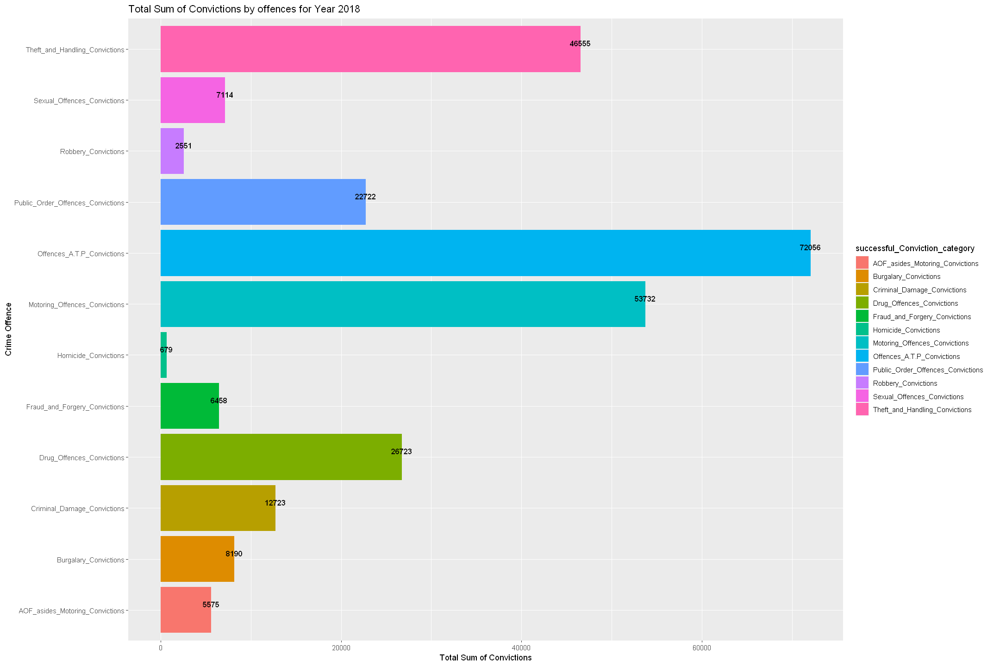

In [1296]:
#plot the total sum of convictions for the year 2018

ggplot(df_sum_conv_dtframe2018, aes(x = sum, y = successful_Conviction_category, fill = successful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Convictions by offences for Year 2018")

# Unsuccessful Convictions (2018)

In [1297]:
unsuccessful_Conviction_category <- colnames(unsuccessful_Convictions)[1:12]

df_sum_unsuccessful_conv <- colSums(unsuccessful_Convictions[unsuccessful_Convictions$year == 2018,][, 1:12])

df_sum_unsuccessful_conv

Homicide_Unsuccessful                    Robbery_Unsuccessful 
                                    157                                     667 
        Theft_and_Handling_Unsuccessful          Motoring_Offences_Unsuccessful 
                                   3987                                    9076 
Offences_A.T.P_Convictions_Unsuccessful            Sexual_Offences_Unsuccessful 
                                  19310                                    2363 
                 Burgalary_Unsuccessful          Fraud_and_Forgery_Unsuccessful 
                                   1228                                     969 
           Criminal_Damage_Unsuccessful              Drug_Offences_Unsuccessful 
                                   1995                                    1872 
     Public_Order_Offences_Unsuccessful        AOF_asides_Motoring_Unsuccessful 
                                   3726                                     805

In [1298]:
df_sum_unsuccessful_conv_dtframe2018 <- data.frame(unsuccessful_Conviction_category = unsuccessful_Conviction_category, sum = df_sum_unsuccessful_conv, row.names = NULL)

df_sum_unsuccessful_conv_dtframe2018

unsuccessful_Conviction_category,sum
<chr>,<dbl>
Homicide_Unsuccessful,157
Robbery_Unsuccessful,667
Theft_and_Handling_Unsuccessful,3987
Motoring_Offences_Unsuccessful,9076
Offences_A.T.P_Convictions_Unsuccessful,19310
Sexual_Offences_Unsuccessful,2363
Burgalary_Unsuccessful,1228
Fraud_and_Forgery_Unsuccessful,969
Criminal_Damage_Unsuccessful,1995


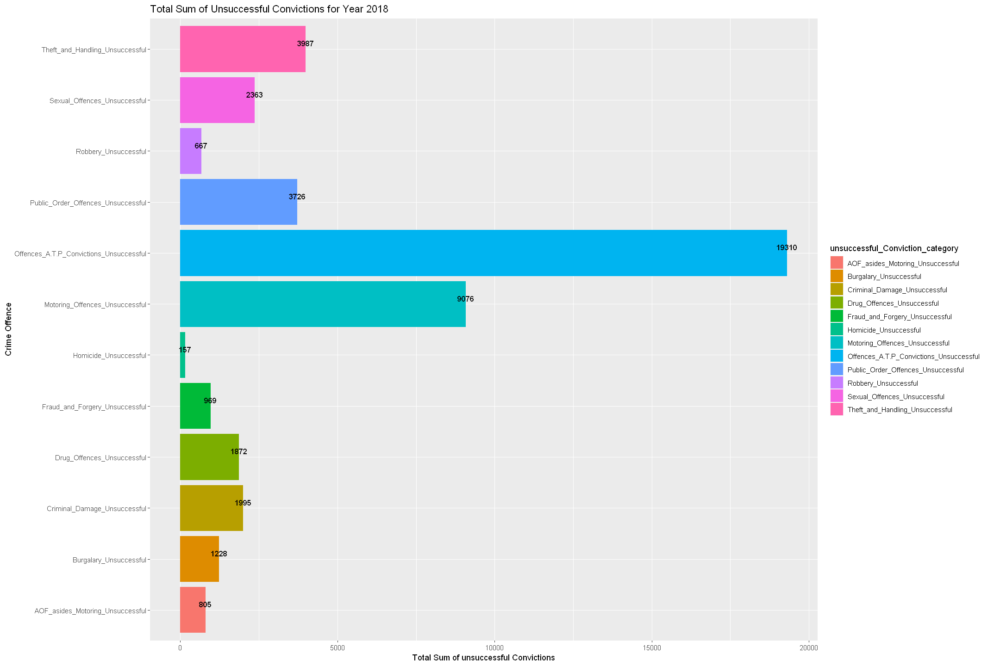

In [1299]:
#plot the total sum of Unsuccessful convictions for the year 2018

ggplot(df_sum_unsuccessful_conv_dtframe2018, aes(x = sum, y = unsuccessful_Conviction_category, fill = unsuccessful_Conviction_category)) +

  geom_bar(stat = "identity") +

  geom_text(aes(label = sum), vjust = -0.5, color = "black", size = 3.5, fontface = "bold") +

  labs(x = "Total Sum of unsuccessful Convictions", y = "Crime Offence") +

  ggtitle("Total Sum of Unsuccessful Convictions for Year 2018")

In [1300]:
successful_crimes <- c("Homicide_Convictions", "Robbery_Convictions", "Theft_and_Handling_Convictions",
                      "Robbery_Convictions", "Theft_and_Handling_Convictions", "Motoring_Offences_Convictions",
                      "Offences_A.T.P_Convictions", "Sexual_Offences_Convictions", "Burgalary_Convictions",
                      "Fraud_and_Forgery_Convictions", "Criminal_Damage_Convictions", "Drug_Offences_Convictions",
                      "Public_Order_Offences_Convictions", "AOF_asides_Motoring_Convictions",
                      "Motoring_Offences_Convictions")

# Create a subset of the dataset with only the successful offense variables
subset_data_successful <- combined_df[, successful_crimes]

# Calculate the sum of all successful offenses
total_successful_crimes <- sum(as.matrix(subset_data_successful))

# Print the result
cat("Total Successful crimes:", total_successful_crimes, "\n")


Total Successful crimes: 2692553 


In [1301]:
unsuccessful_crimes <- c("Homicide_Unsuccessful", "Robbery_Unsuccessful", "Theft_and_Handling_Unsuccessful",
               "Motoring_Offences_Unsuccessful", "Offences_A.T.P_Convictions_Unsuccessful",
               "Sexual_Offences_Unsuccessful", "Burgalary_Unsuccessful", "Fraud_and_Forgery_Unsuccessful",
               "Criminal_Damage_Unsuccessful", "Drug_Offences_Unsuccessful",
               "Public_Order_Offences_Unsuccessful", "AOF_asides_Motoring_Unsuccessful",
               "Motoring_Offences_Unsuccessful")

# Create a subset of the dataset with only the unsuccessful offense variables
subset_data_unsuccessful <- combined_df[, unsuccessful_crimes]

# Calculate the sum of all unsuccessful offenses
total_unsuccessful_crimes <- sum(as.matrix(subset_data_unsuccessful))

# Print the result
cat("Total Unsuccessful crimes:", total_unsuccessful_crimes, "\n")

Total Unsuccessful crimes: 410494 


# Comparison of unsuccessful and Successful Conviction

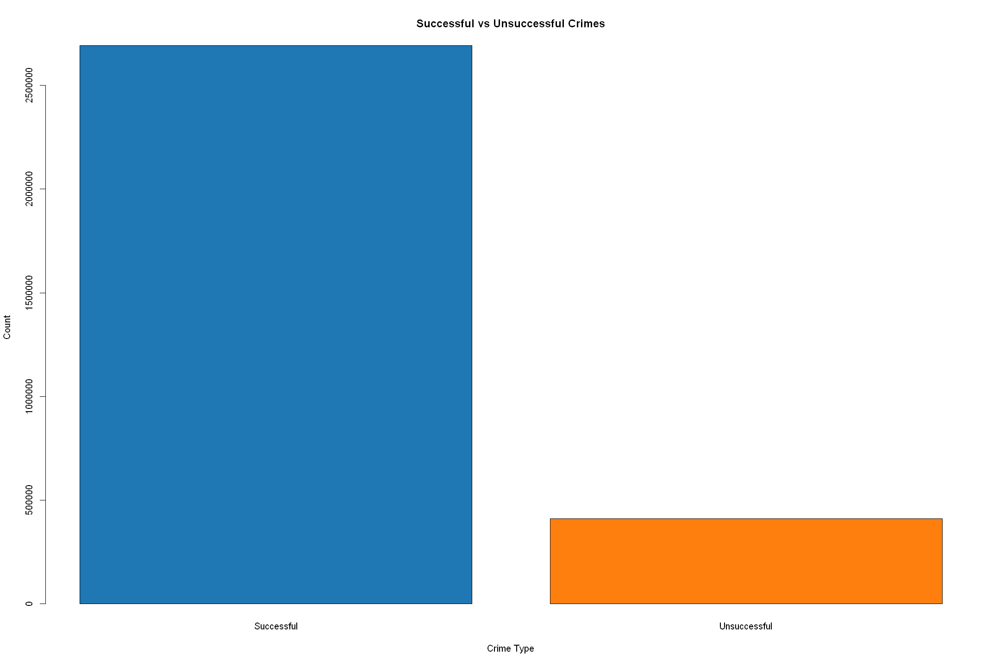

In [1302]:
# Create a data frame for plotting
crimes_data <- data.frame(Type = c("Successful", "Unsuccessful"),
                          Count = c(total_successful_crimes, total_unsuccessful_crimes))

# Plotting the bar chart
barplot(crimes_data$Count, names.arg = crimes_data$Type, col = c("#1f77b4", "#ff7f0e"),
        xlab = "Crime Type", ylab = "Count", main = "Successful vs Unsuccessful Crimes")

# Columns of Interest

Homicide convictions

In [1303]:
colnames(combined_df)

[1] "Territory"                              
 [2] "Homicide_Convictions"                   
 [3] "Homicide_Unsuccessful"                  
 [4] "Offences_A.T.P_Convictions"             
 [5] "Offences_A.T.P_Convictions_Unsuccessful"
 [6] "Sexual_Offences_Convictions"            
 [7] "Sexual_Offences_Unsuccessful"           
 [8] "Burgalary_Convictions"                  
 [9] "Burgalary_Unsuccessful"                 
[10] "Robbery_Convictions"                    
[11] "Robbery_Unsuccessful"                   
[12] "Theft_and_Handling_Convictions"         
[13] "Theft_and_Handling_Unsuccessful"        
[14] "Fraud_and_Forgery_Convictions"          
[15] "Fraud_and_Forgery_Unsuccessful"         
[16] "Criminal_Damage_Convictions"            
[17] "Criminal_Damage_Unsuccessful"           
[18] "Drug_Offences_Convictions"              
[19] "Drug_Offences_Unsuccessful"             
[20] "Public_Order_Offences_Convictions"      
[21] "Public_Order_Offences_Unsuccessful"     
[22] "AOF_asides_Motoring_Convictions"        
[23] "AOF_asides_Motoring_Unsuccessful"       
[24] "Motoring_Offences_Convictions"          
[25] "Motoring_Offences_Unsuccessful"         
[26] "Admin_Finalised_Unsuccessful"           
[27] "year"                                   
[28] "month"                                  
[29] "Region"                                 
[30] "date"

# A tibble: 10 × 2
   Region                   Mean_Column
   <chr>                          <dbl>
 1 East Midlands                   1.47
 2 East of England                 1.08
 3 London                         16.3 
 4 North East England              1.11
 5 North West England              1.44
 6 South East England              2.00
 7 South West England              1.18
 8 Wales                           1.06
 9 West Midlands                   2.24
10 Yorkshire and the Humber        2.14


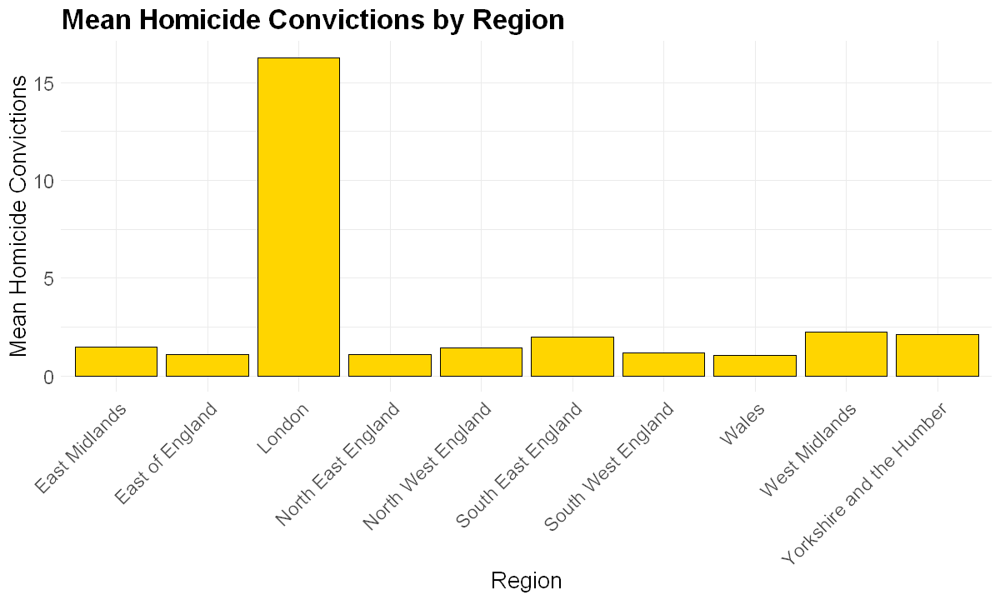

In [1304]:
# Calculate the summary and group the column by region
summary_stats <- combined_df %>%
  group_by(Region) %>%
  dplyr::summarize(Mean_Column = mean(Homicide_Convictions))
print(summary_stats)
# Visualise with Bar chart
bar_chart <- ggplot(summary_stats, aes(x = Region, y = Mean_Column)) +
  geom_bar(stat = "identity", fill = "#ffd500", color = "black") +
  labs(title = "Mean Homicide Convictions by Region",
       x = "Region",
       y = "Mean Homicide Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# plot sizing
options(repr.plot.width = 10, repr.plot.height = 6)

print(bar_chart)

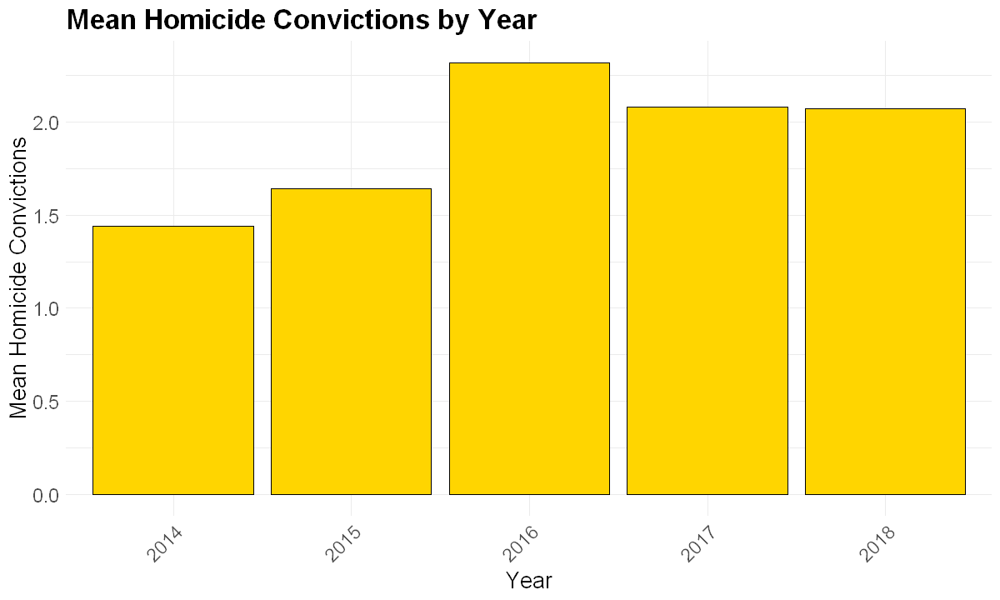

In [1305]:

# Calculate summary statistics by grouping column by year
summary_stats <- combined_df %>%
  group_by(year) %>%
  dplyr::summarize(Mean_Column = mean(Homicide_Convictions))

# Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = as.factor(year), y = Mean_Column)) +
  geom_bar(stat = "identity", fill = "#ffd500", color = "black") +
  labs(title = "Mean Homicide Convictions by Year",
       x = "Year",
       y = "Mean Homicide Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 6)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.


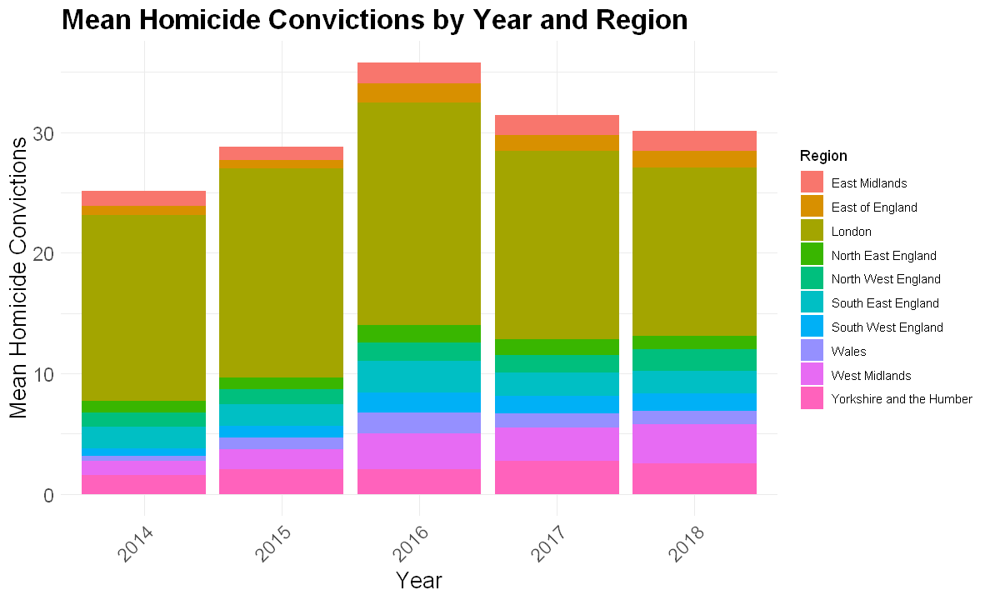

In [1306]:
# Calculate summary statistics by grouping column by region and year
summary_stats <- combined_df %>%
  group_by(Region, year) %>%
  dplyr::summarize(Mean_Column = mean(Homicide_Convictions))

# Stacked Bar Chart
stacked_bar <- ggplot(summary_stats, aes(x = as.factor(year), y = Mean_Column, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Mean Homicide Convictions by Year and Region",
       x = "Year",
       y = "Mean Homicide Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "right")

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 6)

# Display the chart
print(stacked_bar)


Sexual_Offences_Convictions

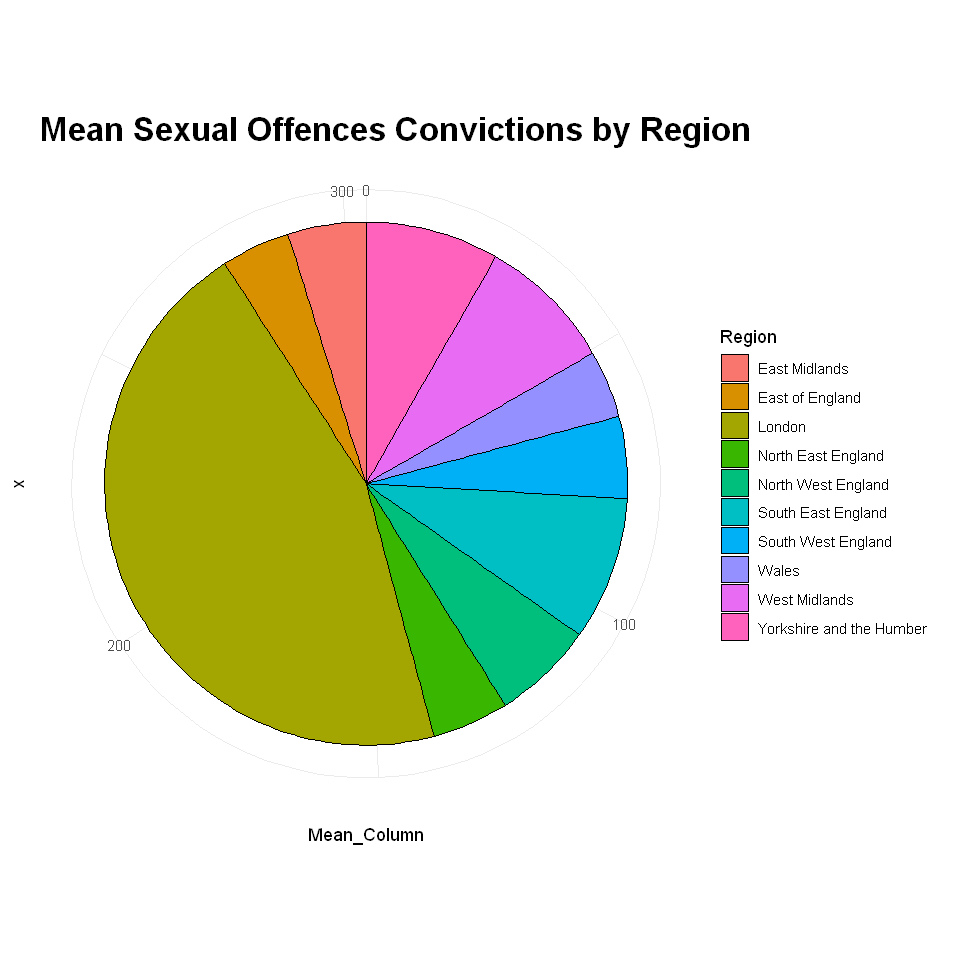

In [1307]:
# Calculate summary statistics by grouping column by region
summary_stats <- combined_df %>%
  group_by(Region) %>%
  dplyr::summarize(Mean_Column = mean(Sexual_Offences_Convictions))

# Pie Chart
pie_chart <- ggplot(summary_stats, aes(x = "", y = Mean_Column, fill = Region)) +
  geom_bar(stat = "identity", width = 1, color = "black") +
  coord_polar("y") +
  labs(title = "Mean Sexual Offences Convictions by Region",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        legend.position = "right")

# Set the size of the plot
options(repr.plot.width = 8, repr.plot.height = 8)  # Adjust the values for the desired size

# Display the chart
print(pie_chart)


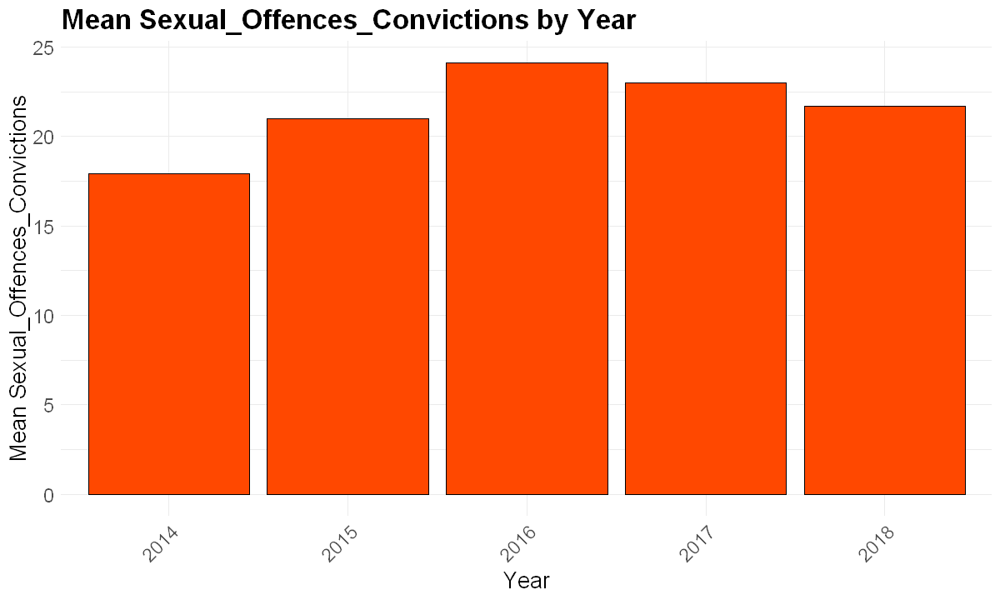

In [1308]:
# Calculate summary statistics by grouping column by year
summary_stats <- combined_df %>%
  group_by(year) %>%
  dplyr::summarize(Mean_Column = mean(Sexual_Offences_Convictions))

# Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = as.factor(year), y = Mean_Column)) +
  geom_bar(stat = "identity", fill = "#ff4800", color = "black") +
  labs(title = "Mean Sexual_Offences_Convictions by Year",
       x = "Year",
       y = "Mean Sexual_Offences_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 6)

# Display the chart
print(bar_chart)


In [1309]:
head(combined_df$year)

[1] 2014 2016 2016 2017 2015 2015

In 2016 majority of crimes under sexual offences was recorded

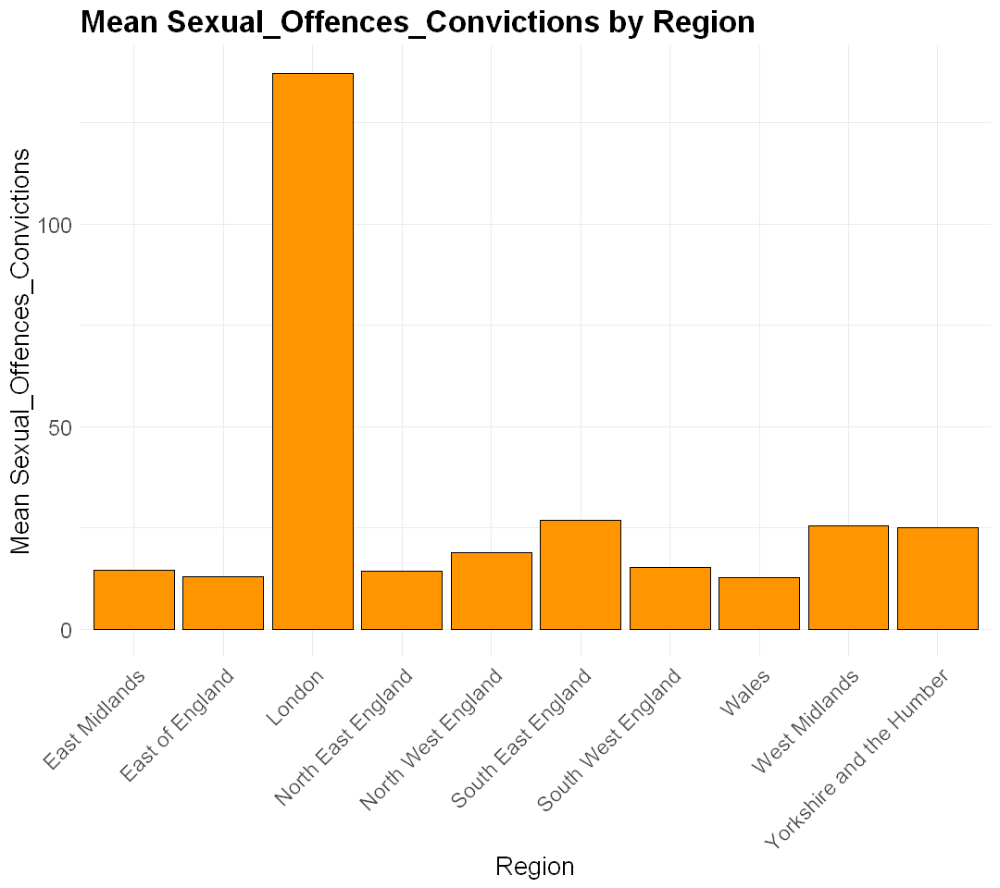

In [1310]:
# Calculate summary statistics by grouping column by region
summary_stats <- combined_df %>%
  group_by(Region) %>%
  dplyr::summarize(Mean_Column = mean(Sexual_Offences_Convictions))

# Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = Region, y = Mean_Column)) +
  geom_bar(stat = "identity", fill = "#ff9500", color = "black") +
  labs(title = "Mean Sexual_Offences_Convictions by Region",
       x = "Region",
       y = "Mean Sexual_Offences_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 9, repr.plot.height = 8)

# Display the chart
print(bar_chart)

Excluding London

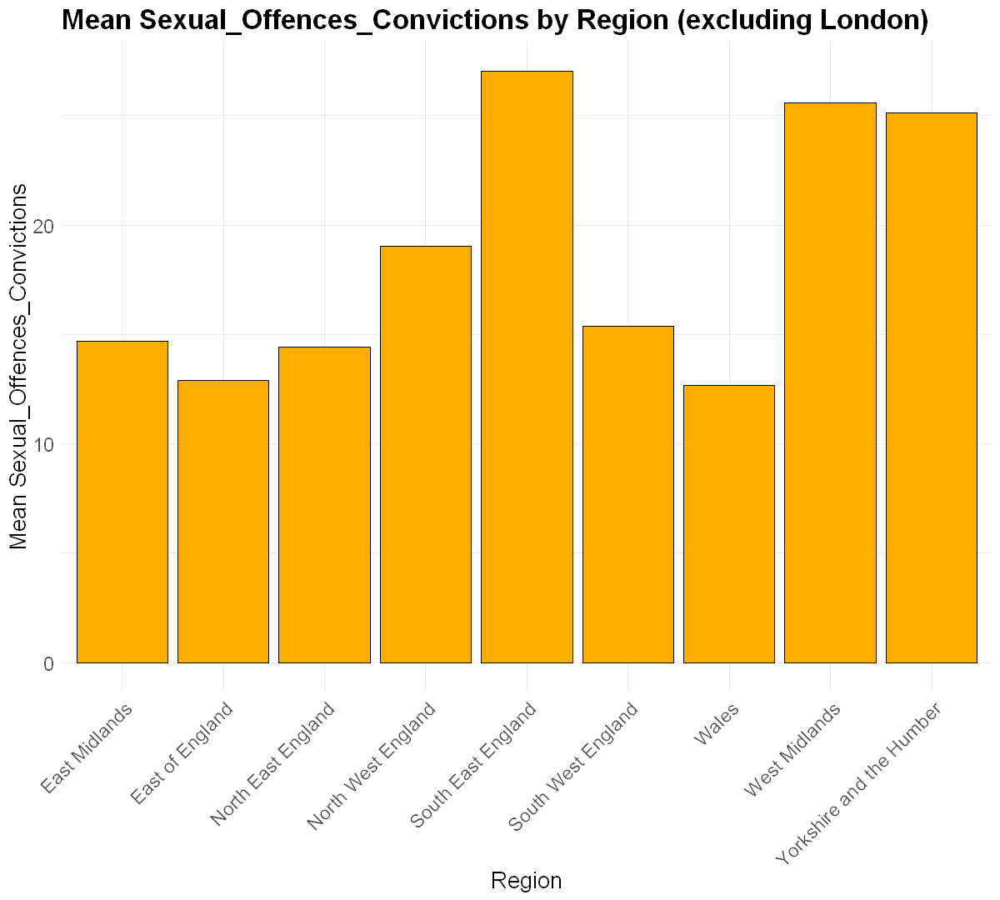

In [1311]:
# Filter out the specific region (e.g., "London")
filtered_data <- combined_df %>%
  filter(Region != "London")

# Calculate summary statistics by grouping column by region
summary_stats <- filtered_data %>%
  group_by(Region) %>%
  dplyr::summarize(Mean_Column = mean(Sexual_Offences_Convictions))

# Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = Region, y = Mean_Column)) +
  geom_bar(stat = "identity", fill = "#ffae00", color = "black") +
  labs(title = "Mean Sexual_Offences_Convictions by Region (excluding London)",
       x = "Region",
       y = "Mean Sexual_Offences_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 9)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'Territory'. You can override using the
`.groups` argument.


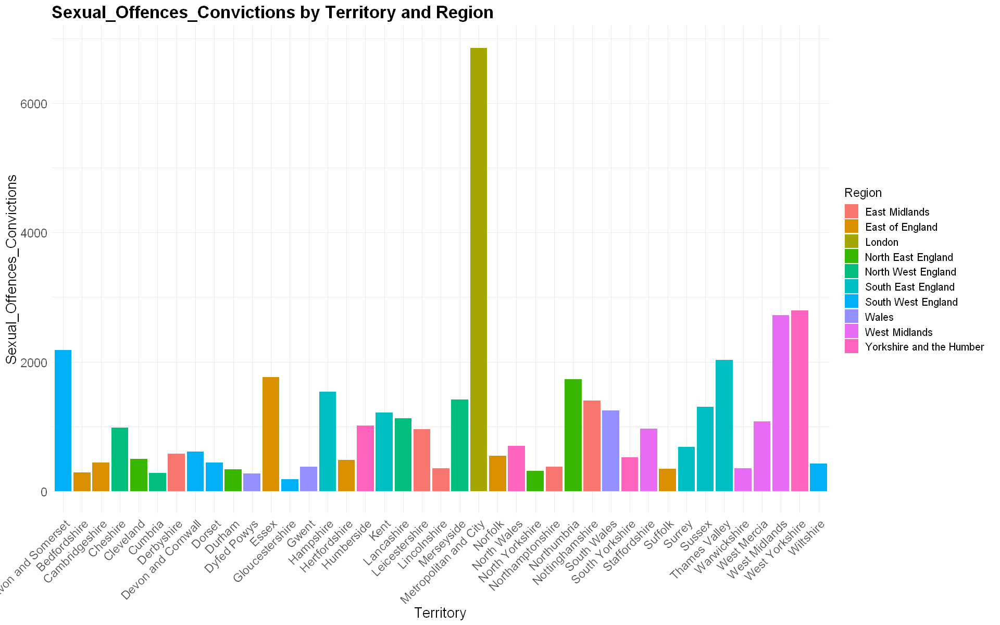

In [1312]:
# Calculate summary statistics by grouping column by Territory and Region
summary_stats <- combined_df %>%
  group_by(Territory, Region) %>%
  dplyr::summarize(Sexual_Offences_Convictions = sum(Sexual_Offences_Convictions))

# Stacked Bar Chart
stacked_bar_chart <- ggplot(summary_stats, aes(x = Territory, y = Sexual_Offences_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Sexual_Offences_Convictions by Territory and Region",
       x = "Territory",
       y = "Sexual_Offences_Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1, vjust = 1),  # Adjust the angle and justification
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))

# Set the size of the plot
options(repr.plot.width = 16, repr.plot.height = 10)

# Display the chart
print(stacked_bar_chart)


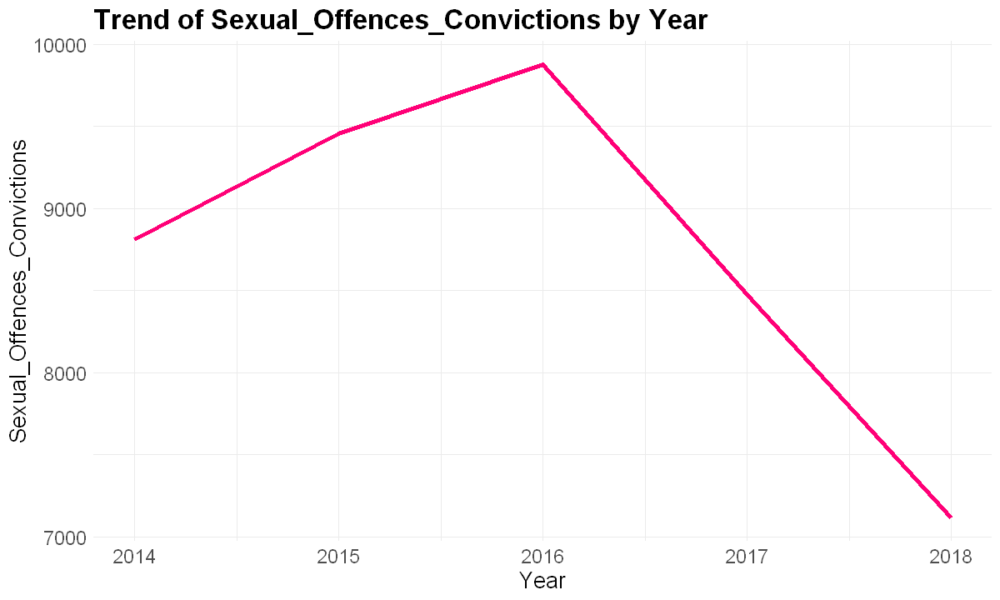

In [1313]:
# Calculate summary statistics by grouping column by year
summary_stats <- combined_df %>%
  group_by(year) %>%
  dplyr::summarize(Sexual_Offences_Convictions = sum(Sexual_Offences_Convictions))

# Line Graph
line_graph <- ggplot(summary_stats, aes(x = year, y = Sexual_Offences_Convictions)) +
  geom_line(color = "#ff0077", size = 1.5) +
  labs(title = "Trend of Sexual_Offences_Convictions by Year",
       x = "Year",
       y = "Sexual_Offences_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 6)

# Display the chart
print(line_graph)


In [1314]:
# Create a copy of the combined_df dataset
plot_data <- combined_df

# Create an interactive plot using ggplot and convert it to plotly
plot <- ggplot(plot_data, aes(x = Territory, y = Sexual_Offences_Convictions, fill = Region, text = paste("Territory: ", Territory, "<br>Region: ", Region, "<br>Year: ", year, "<br>Sexual_Offences_Convictions: ", Sexual_Offences_Convictions))) +
  geom_bar(stat = "identity") +
  facet_wrap(~ year, ncol = 2) +
  labs(title = "Sexual_Offences_Convictions by Territory, Region, and Year",
       x = "Territory",
       y = "Sexual_Offences_Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 12),
        axis.text = element_text(size = 9),
        axis.text.x = element_text(angle = 45, hjust = 2, vjust = 2),
        legend.position = "right") +
  guides(fill = guide_legend(title = "Region"))

# Convert ggplot object to plotly for interactivity
plot <- ggplotly(plot, tooltip = "text")

# Customize plotly options
plot %>%
  layout(
    height = 700,
    xaxis = list(
      tickangle = -45,
      tickfont = list(size = 10),
      automargin = TRUE
    )
  )

# Display the interactive plot
print(plot)


Warning message:
"Specifying width/height in layout() is now deprecated.
Please specify in ggplotly() or plot_ly()"


HTML widgets cannot be represented in plain text (need html)

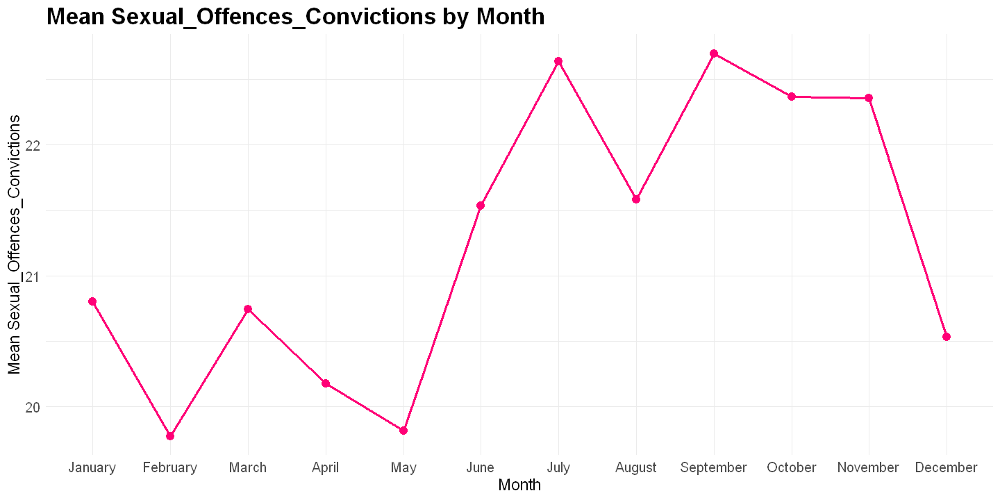

In [1315]:
# Convert the "year" and "month" columns to factors for correct ordering
combined_df$month <- factor(combined_df$month, levels = month.name)

# Calculate the mean of Sexual_Offences_Convictions by month
summary_stats <- combined_df %>%
  group_by(month) %>%
  dplyr::summarize(Mean_Column = mean(Sexual_Offences_Convictions))

# Line plot
line_plot <- ggplot(summary_stats, aes(x = month, y = Mean_Column, group = 1)) +
  geom_line(color = "#ff0077", size = 1) +
  geom_point(color = "#ff0077", size = 3) +
  labs(title = "Mean Sexual_Offences_Convictions by Month",
       x = "Month",
       y = "Mean Sexual_Offences_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 14),
        axis.text = element_text(size = 12),
        legend.position = "none")

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 6)

# Display the line plot
print(line_plot)


In [1316]:
head(combined_df$year)

[1] 2014 2016 2016 2017 2015 2015

`summarise()` has grouped output by 'year'. You can override using the
`.groups` argument.


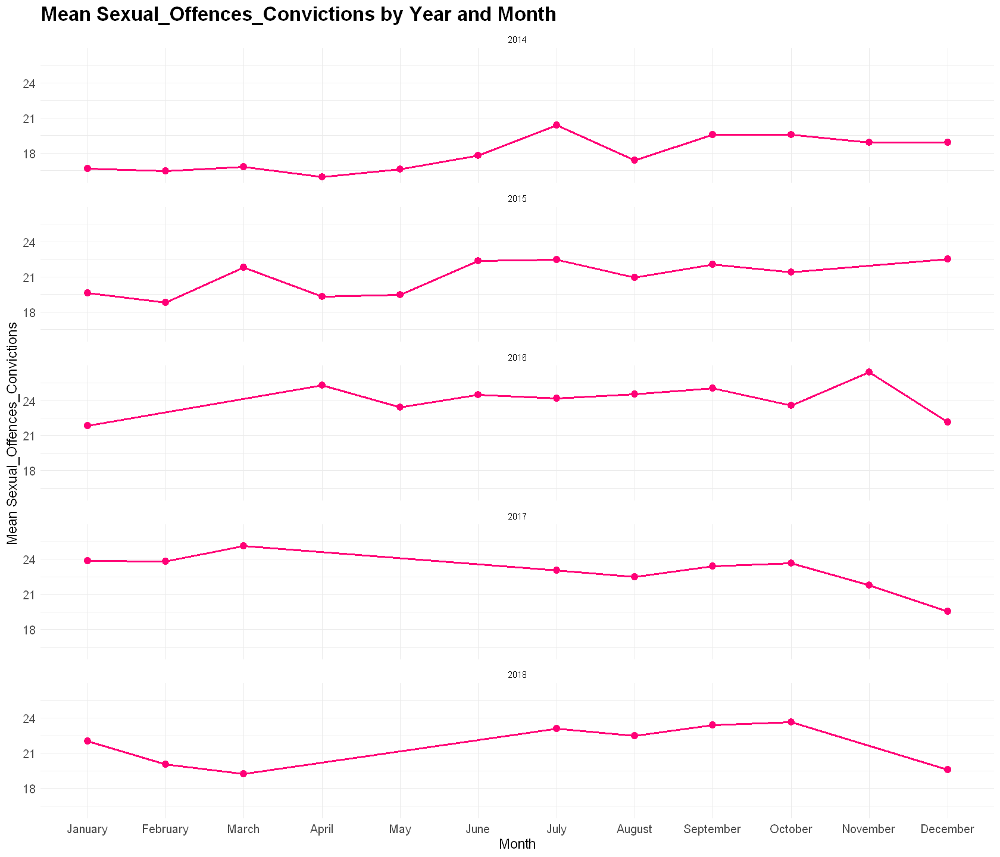

In [1317]:
# Convert the "year" and "month" columns to factors for correct ordering
combined_df$year <- factor(combined_df$year)
combined_df$month <- factor(combined_df$month, levels = month.name)

# Calculate the mean of Sexual_Offences_Convictions by year and month
summary_stats <- combined_df %>%
  group_by(year, month) %>%
  dplyr::summarize(Mean_Column = mean(Sexual_Offences_Convictions))

# Line plot with facets for each year
line_plot <- ggplot(summary_stats, aes(x = month, y = Mean_Column, group = year)) +
  geom_line(color = "#ff0077", size = 1) +
  geom_point(color = "#ff0077", size = 3) +
  facet_wrap(~ year, ncol = 1) +
  labs(title = "Mean Sexual_Offences_Convictions by Year and Month",
       x = "Month",
       y = "Mean Sexual_Offences_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 14),
        axis.text = element_text(size = 12),
        legend.position = "none")

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 12)

# Display the line plot
print(line_plot)


Burgalary_Convictions

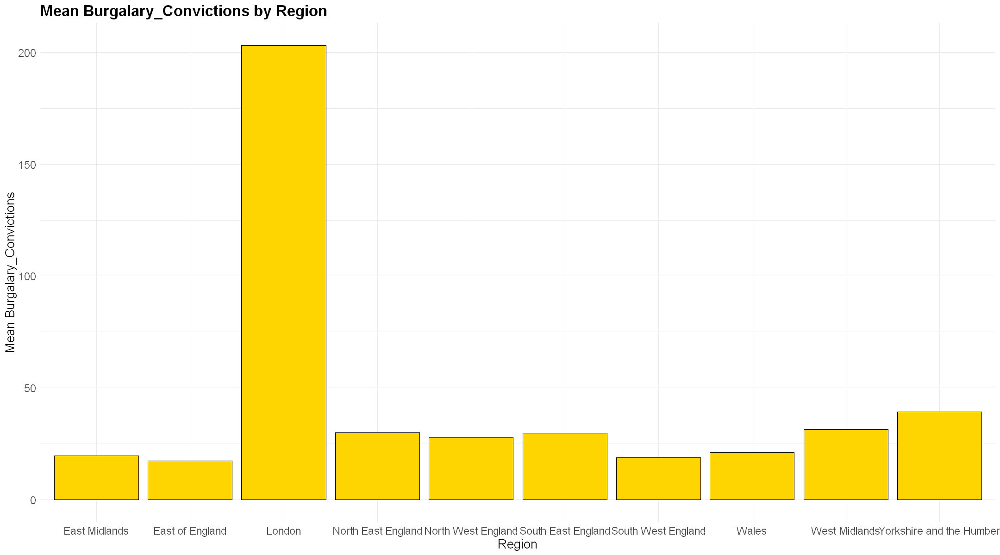

In [1318]:
# Calculate summary statistics by grouping column by region
summary_stats <- combined_df %>%
  group_by(Region) %>%
  dplyr::summarize(Mean_Burglary = mean(Burgalary_Convictions))

# Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = Region, y = Mean_Burglary)) +
  geom_bar(stat = "identity", fill = "#ffd500", color = "black") +
  labs(title = "Mean Burgalary_Convictions by Region",
       x = "Region",
       y = "Mean Burgalary_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

# Set the size of the plot
options(repr.plot.width = 18, repr.plot.height = 10)

# Display the chart
print(bar_chart)


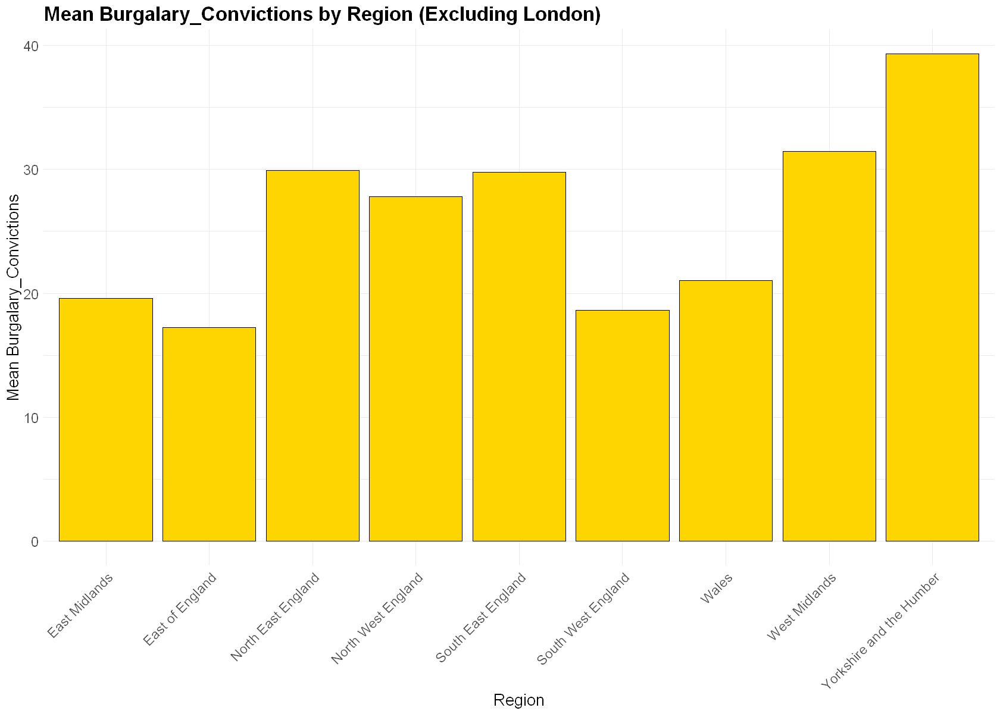

In [1319]:
# Exclude London from the data
summary_stats <- combined_df %>%
  filter(Region != "London") %>%
  group_by(Region) %>%
  dplyr::summarize(Mean_Burgalary = mean(Burgalary_Convictions))

# Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = Region, y = Mean_Burgalary)) +
  geom_bar(stat = "identity", fill = "#ffd500", color = "black") +
  labs(title = "Mean Burgalary_Convictions by Region (Excluding London)",
       x = "Region",
       y = "Mean Burgalary_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 10)

# Display the chart
print(bar_chart)



`summarise()` has grouped output by 'year'. You can override using the
`.groups` argument.


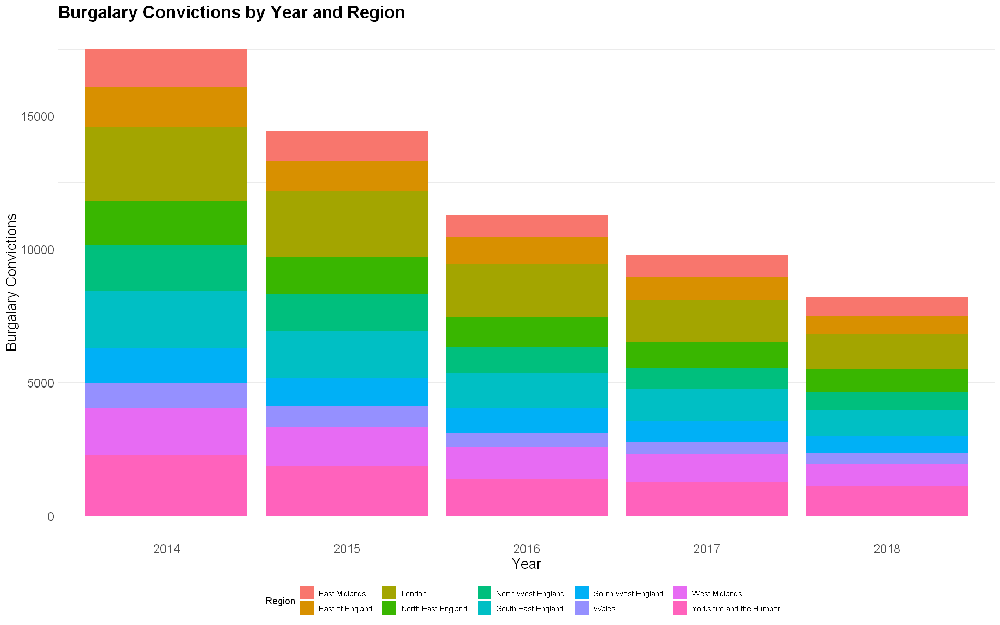

In [1320]:
# Calculate summary statistics by grouping column by year and region
summary_stats <- combined_df %>%
  group_by(year, Region) %>%
  dplyr::summarize(Burgalary_Convictions = sum(Burgalary_Convictions))

# Stacked Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = year, y = Burgalary_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Burgalary Convictions by Year and Region",
       x = "Year",
       y = "Burgalary Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.position = "bottom")

# Set the size of the plot
options(repr.plot.width = 16, repr.plot.height = 10)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'year'. You can override using the
`.groups` argument.


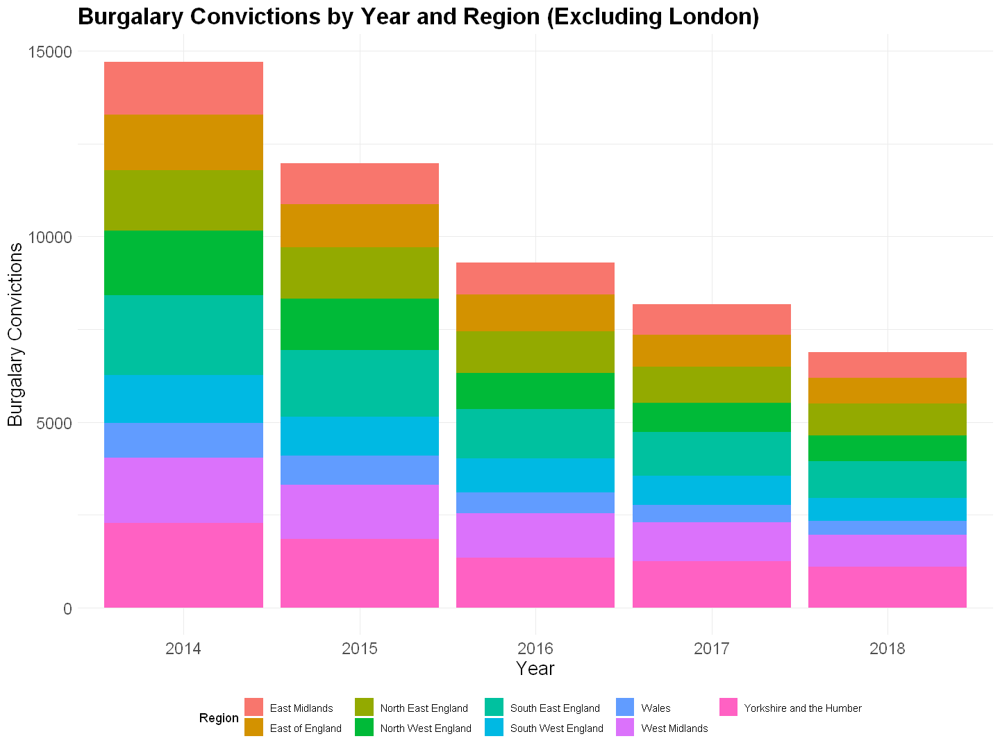

In [1321]:
# Filter the data to exclude London
filtered_data <- combined_df %>%
  filter(Region != "London")

# Calculate summary statistics by grouping column by year and region (excluding London)
summary_stats <- filtered_data %>%
  group_by(year, Region) %>%
  dplyr::summarize(Burgalary_Convictions = sum(Burgalary_Convictions))

# Stacked Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = year, y = Burgalary_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Burgalary Convictions by Year and Region (Excluding London)",
       x = "Year",
       y = "Burgalary Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.position = "bottom")

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 9)

# Display the chart
print(bar_chart)


DRUG OFFENCES CONVICTIONS

`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.


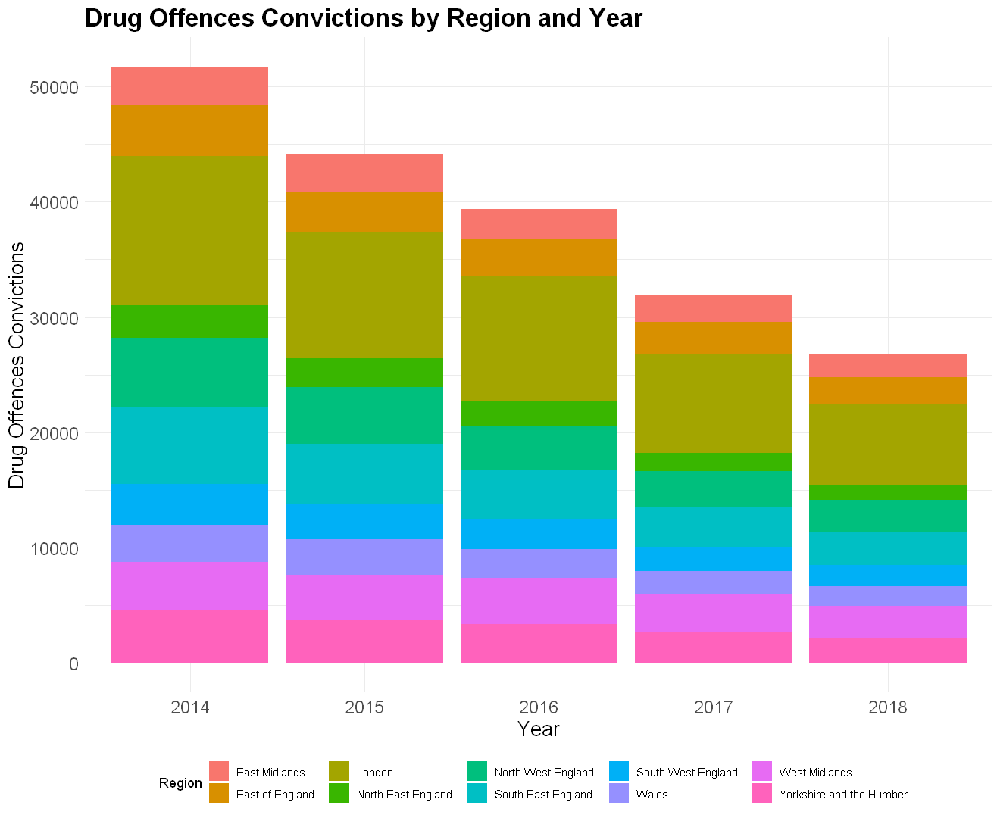

In [1322]:
# Calculate summary statistics by grouping column by region and year
summary_stats <- combined_df %>%
  group_by(Region, year) %>%
  dplyr::summarize(Drug_Offences_Convictions = sum(Drug_Offences_Convictions))

# Stacked Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = year, y = Drug_Offences_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Drug Offences Convictions by Region and Year",
       x = "Year",
       y = "Drug Offences Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.position = "bottom")

# Set the size of the plot
options(repr.plot.width = 11, repr.plot.height = 9)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.


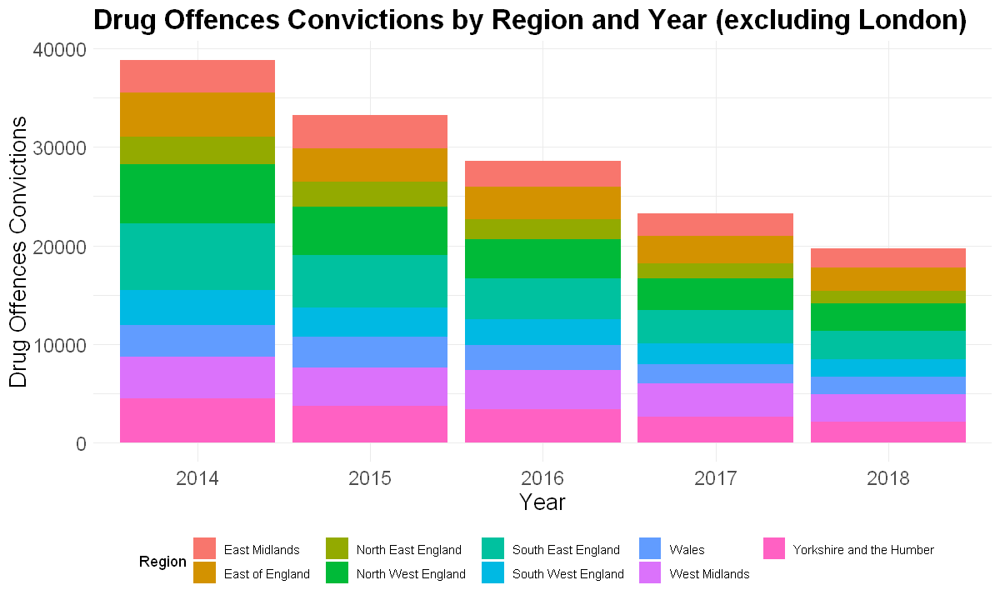

In [1323]:
# Exclude London from the data
filtered_data <- combined_df %>%
  filter(Region != "London")

# Calculate summary statistics by grouping column by region and year
summary_stats <- filtered_data %>%
  group_by(Region, year) %>%
  dplyr::summarize(Drug_Offences_Convictions = sum(Drug_Offences_Convictions))

# Stacked Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = year, y = Drug_Offences_Convictions, fill = Region)) +
  geom_bar(stat = "identity") +
  labs(title = "Drug Offences Convictions by Region and Year (excluding London)",
       x = "Year",
       y = "Drug Offences Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.position = "bottom")

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 6)

# Display the chart
print(bar_chart)


South East England has the most drug offences convictions

`summarise()` has grouped output by 'Territory'. You can override using the
`.groups` argument.


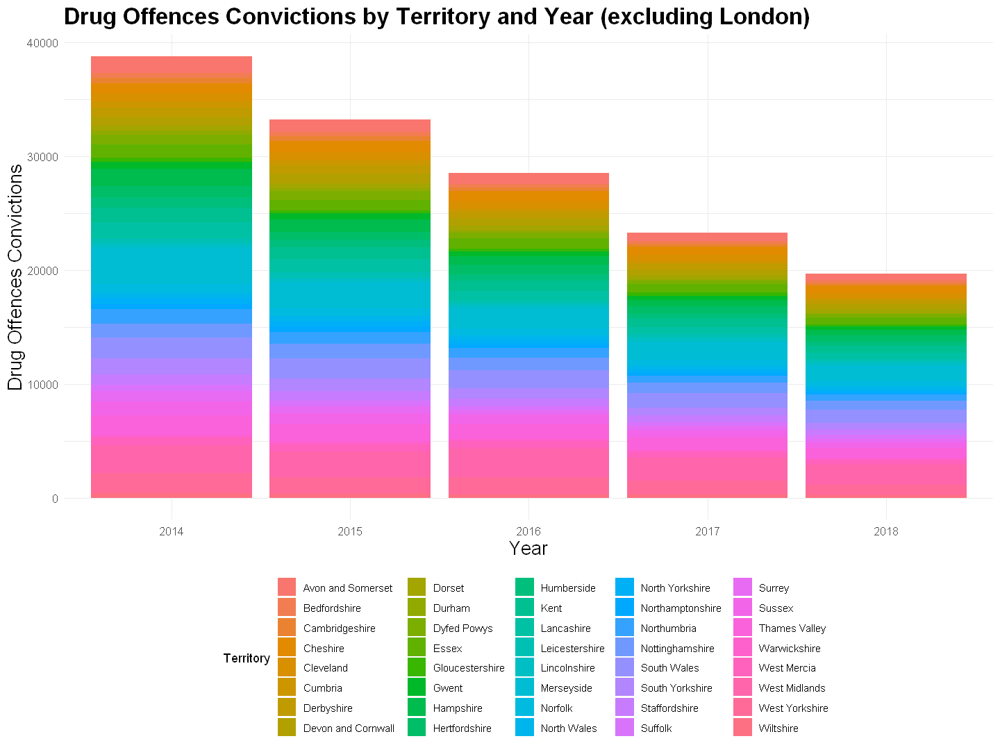

In [1324]:
# Exclude London from the data
filtered_data <- combined_df %>%
  filter(Region != "London")

# Calculate summary statistics by grouping column by Territory and year
summary_stats <- filtered_data %>%
  group_by(Territory, year) %>%
  dplyr::summarize(Drug_Offences_Convictions = sum(Drug_Offences_Convictions))

# Stacked Bar Chart
bar_chart <- ggplot(summary_stats, aes(x = year, y = Drug_Offences_Convictions, fill = Territory)) +
  geom_bar(stat = "identity") +
  labs(title = "Drug Offences Convictions by Territory and Year (excluding London)",
       x = "Year",
       y = "Drug Offences Convictions",
       fill = "Territory") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 10),
        legend.position = "bottom")

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 9)

# Display the chart
print(bar_chart)


[1] 94.52585

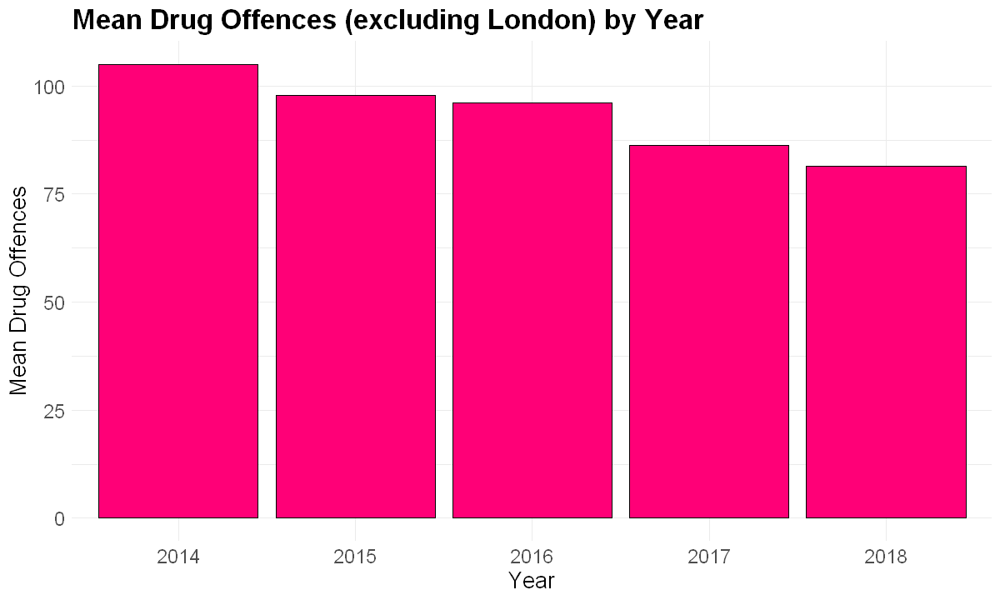

In [1325]:
# Calculate the mean of Drug_Offences_Convictions by year excluding London
mean_stats <- combined_df %>%
  filter(Territory != "London") %>%
  group_by(year) %>%
  dplyr::summarize(Mean_Drug_Offences = mean(Drug_Offences_Convictions, na.rm = TRUE))

mean(combined_df$Drug_Offences_Convictions)
# Bar chart of mean Drug_Offences_Convictions by year
bar_chart <- ggplot(mean_stats, aes(x = as.factor(year), y = Mean_Drug_Offences)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Mean Drug Offences (excluding London) by Year",
       x = "Year",
       y = "Mean Drug Offences") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 6)

# Display the chart
print(bar_chart)


we find that frequency of drug offences convictons is dropping year by year. 2014 had the highest convictions and in 2018, it reduuced but not by a large margin.

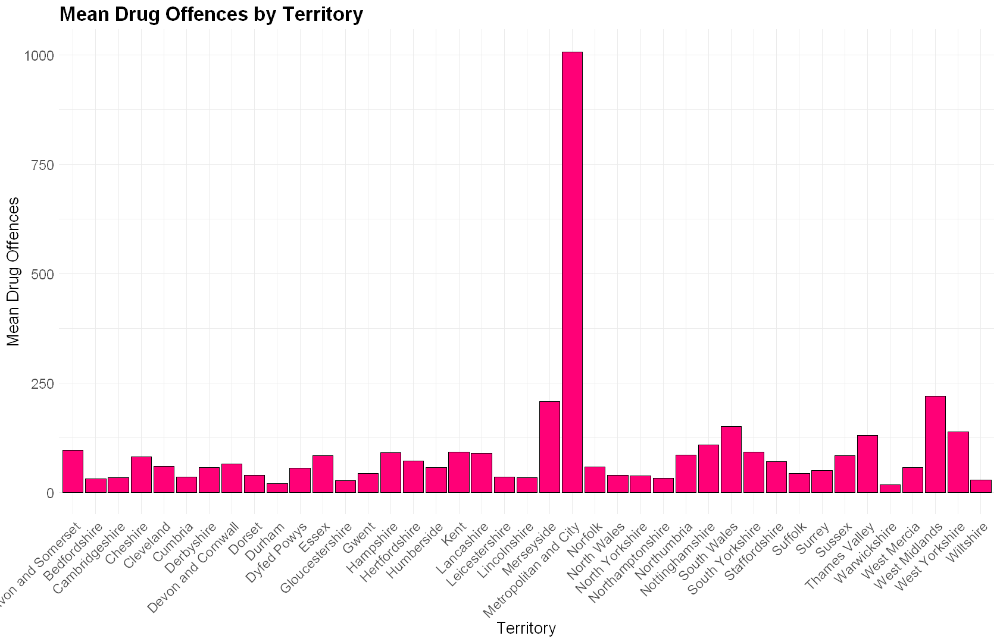

In [1326]:
# Calculate the mean of Drug_Offences_Convictions by territory
mean_stats <- combined_df %>%
  group_by(Territory) %>%
  dplyr::summarize(Mean_Drug_Offences = mean(Drug_Offences_Convictions, na.rm = TRUE))

# Bar chart of mean Drug_Offences_Convictions by territory
bar_chart <- ggplot(mean_stats, aes(x = Territory, y = Mean_Drug_Offences)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Mean Drug Offences by Territory",
       x = "Territory",
       y = "Mean Drug Offences") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 9)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'year'. You can override using the
`.groups` argument.


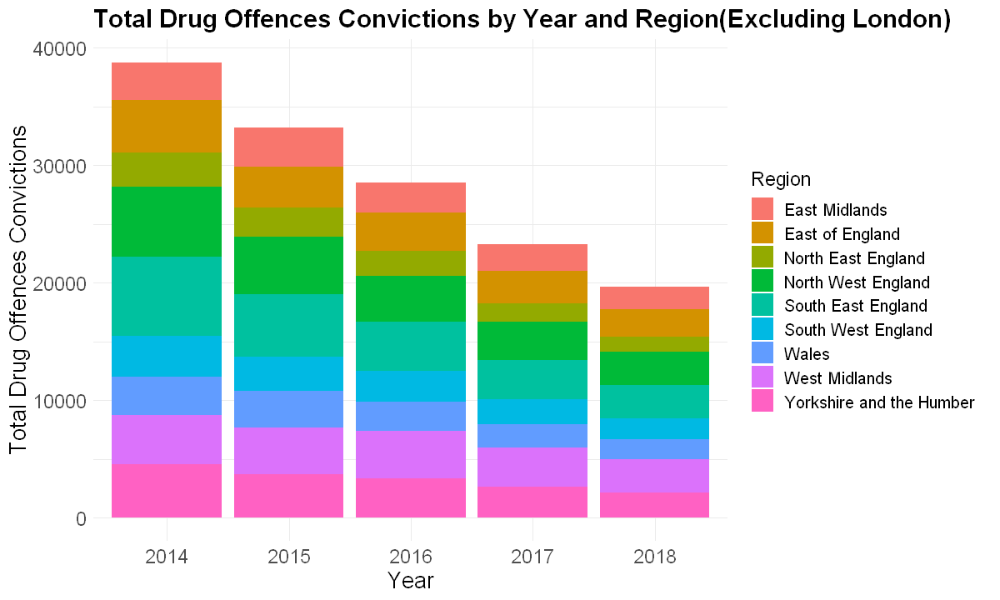

In [1327]:
# Filter the data to exclude London
filtered_df <- combined_df %>%
  filter(Region != "London") 

# total Drug_Offences_Convictions by year and region
year_region_stats <- filtered_df %>%
  group_by(year, Region) %>%
  dplyr::summarise(Total_Drug_Offences = sum(Drug_Offences_Convictions, na.rm = TRUE))

# Customising the bar plot
bar_plot <- ggplot(year_region_stats, aes(x = year, y = Total_Drug_Offences, fill = Region)) +
  geom_bar(stat = "identity", position = "stack") +
  labs(title = "Total Drug Offences Convictions by Year and Region(Excluding London)",
       x = "Year",
       y = "Total Drug Offences Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 18, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))


options(repr.plot.width = 10, repr.plot.height = 6)

print(bar_plot)


In [1328]:
# Select only numeric columns
numeric_cols <- combined_df[, sapply(combined_df, is.numeric)]

# Calculate the mean for each column
means <- sapply(numeric_cols, mean, na.rm = TRUE)

# Print the means
print(means)


                   Homicide_Convictions                   Homicide_Unsuccessful 
                              1.8760976                               0.4536585 
             Offences_A.T.P_Convictions Offences_A.T.P_Convictions_Unsuccessful 
                            224.6780488                              67.8009756 
            Sexual_Offences_Convictions            Sexual_Offences_Unsuccessful 
                             21.3370732                               7.8063415 
                  Burgalary_Convictions                  Burgalary_Unsuccessful 
                             29.8424390                               5.1663415 
                    Robbery_Convictions                    Robbery_Unsuccessful 
                              9.4600000                               2.6063415 
         Theft_and_Handling_Convictions         Theft_and_Handling_Unsuccessful 
                            188.6307317                              17.1375610 
          Fraud_and_Forgery_

Homicide Convictions

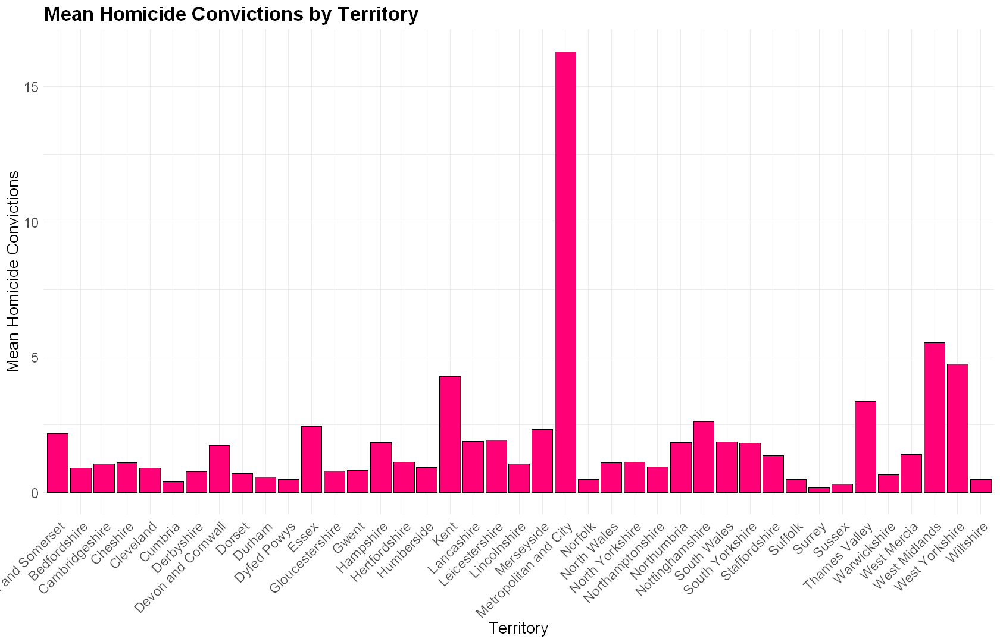

In [1329]:
mean_stats <- combined_df %>%
  group_by(Territory) %>%
  dplyr::summarize(Mean_Homicide_Convictions = mean(Homicide_Convictions, na.rm = TRUE))

# Bar chart of mean Homicide Convictions by territory
bar_chart <- ggplot(mean_stats, aes(x = Territory, y = Mean_Homicide_Convictions)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Mean Homicide Convictions by Territory",
       x = "Territory",
       y = "Mean Homicide Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 9)

# Display the chart
print(bar_chart)


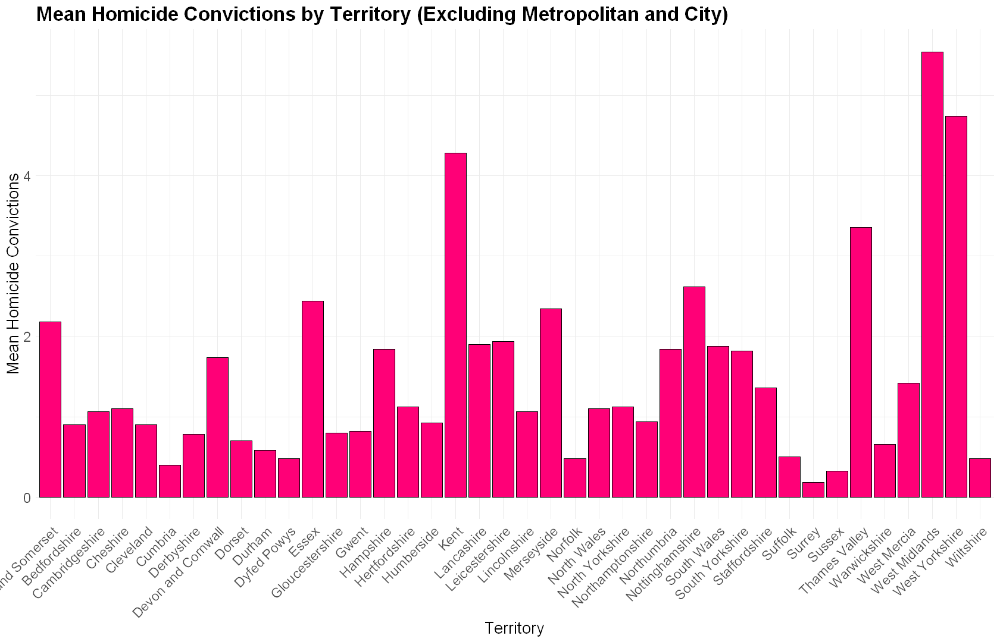

In [1330]:
# Filter out Metropolitan and City from the dataset
filtered_df <- combined_df %>%
  filter(!Territory %in% c("Metropolitan and City"))

# Calculate the mean of Homicide Convictions by territory (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(Territory) %>%
  dplyr::summarize(Mean_Homicide_Convictions = mean(Homicide_Convictions, na.rm = TRUE))

# Bar chart of mean Homicide Convictions by territory
bar_chart <- ggplot(mean_stats, aes(x = Territory, y = Mean_Homicide_Convictions)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Mean Homicide Convictions by Territory (Excluding Metropolitan and City)",
       x = "Territory",
       y = "Mean Homicide Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 9)

# Display the chart
print(bar_chart)


Apart from London Metropolitan City, West Midlands and West Yorkshire shows the highest occuring Homicide convictions

`summarise()` has grouped output by 'year', 'Region'. You can override using
the `.groups` argument.


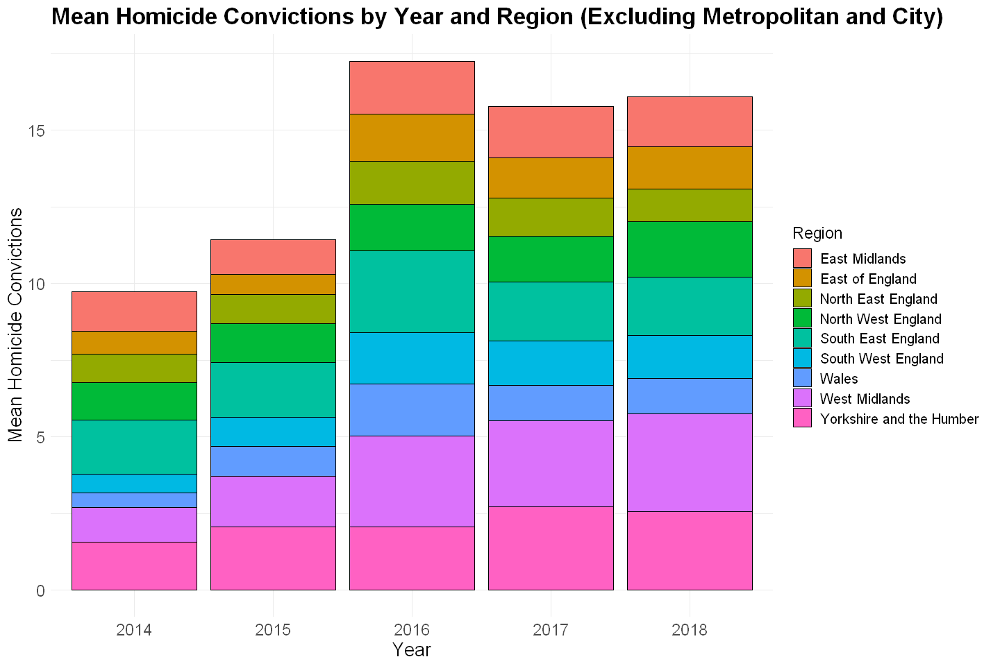

In [1331]:
filtered_df <- combined_df %>%
  filter(!Territory %in% c("Metropolitan and City"))

# Calculate the mean of Homicide Convictions by year and region (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(year, Region, .groups = "drop") %>%
  dplyr::summarize(Mean_Homicide_Convictions = mean(Homicide_Convictions, na.rm = TRUE))

# Bar chart of mean Homicide Convictions by year and region
bar_chart <- ggplot(mean_stats, aes(x = year, y = Mean_Homicide_Convictions, fill = Region)) +
  geom_bar(stat = "identity", position = "stack", color = "black") +
  labs(title = "Mean Homicide Convictions by Year and Region (Excluding Metropolitan and City)",
       x = "Year",
       y = "Mean Homicide Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

print(bar_chart)


Homicide Unsuccessful

`summarise()` has grouped output by 'year', 'Region'. You can override using
the `.groups` argument.


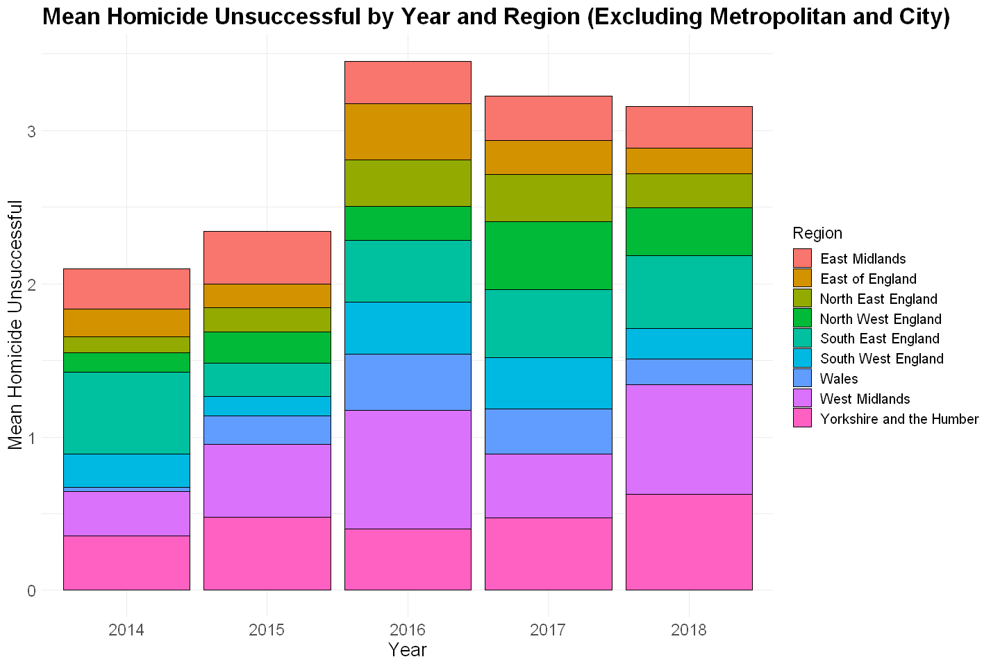

In [1332]:
# Calculate the mean of Homicide_Unsuccessful by year and region (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(year, Region, .groups = "drop") %>%
  dplyr::summarise(Mean_Homicide_Unsuccessful = mean(Homicide_Unsuccessful, na.rm = TRUE))

# Bar chart of mean Homicide_Unsuccessful by year and region
bar_chart <- ggplot(mean_stats, aes(x = year, y = Mean_Homicide_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity", position = "stack", color = "black") +
  labs(title = "Mean Homicide Unsuccessful by Year and Region (Excluding Metropolitan and City)",
       x = "Year",
       y = "Mean Homicide Unsuccessful",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

print(bar_chart)


# Robbery Convictions

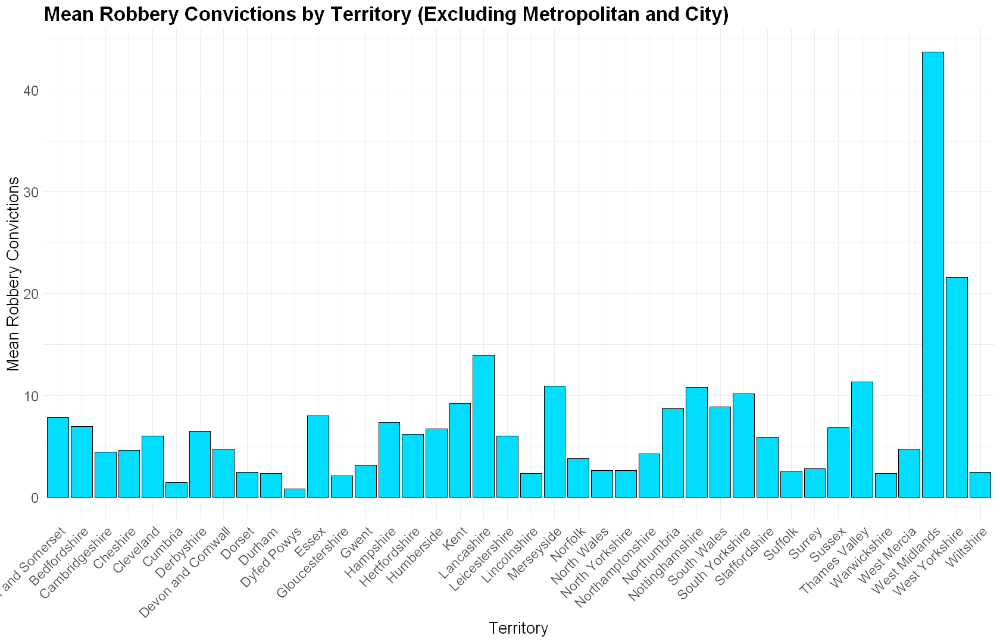

In [1333]:
filtered_df <- combined_df %>%
  filter(!Territory %in% c("Metropolitan and City"))

# Calculate the mean of Robbery Convictions by territory (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(Territory) %>%
  dplyr::summarize(Mean_Robbery_Convictions = mean(Robbery_Convictions, na.rm = TRUE))

# Bar chart of mean Robbery Convictions by territory
bar_chart <- ggplot(mean_stats, aes(x = Territory, y = Mean_Robbery_Convictions)) +
  geom_bar(stat = "identity", fill = "#00ddff", color = "black") +
  labs(title = "Mean Robbery Convictions by Territory (Excluding Metropolitan and City)",
       x = "Territory",
       y = "Mean Robbery Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 9)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.


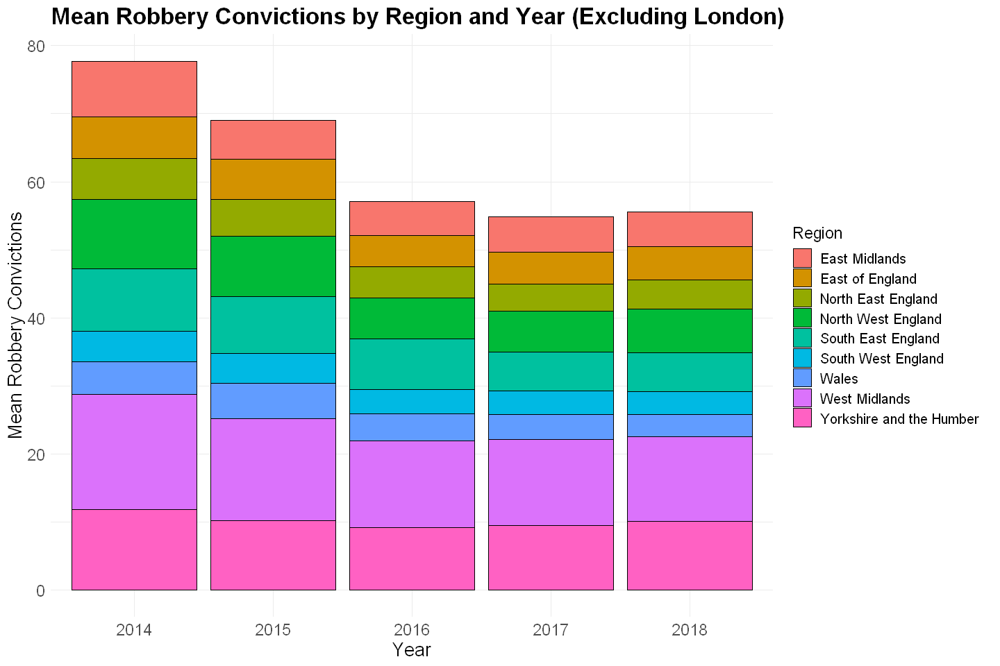

In [1334]:
# Filter out Metropolitan and City from the dataset
filtered_df <- combined_df %>%
  filter(!Region %in% c("London"))

# Calculate the mean of Robbery Convictions by region and year (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(Region, year) %>%
  dplyr::summarize(Mean_Robbery_Convictions = mean(Robbery_Convictions, na.rm = TRUE))

# Bar chart of mean Robbery Convictions by region and year
bar_chart <- ggplot(mean_stats, aes(x = year, y = Mean_Robbery_Convictions, fill = Region)) +
  geom_bar(stat = "identity", position = "stack", color = "black") +
  labs(title = "Mean Robbery Convictions by Region and Year (Excluding London)",
       x = "Year",
       y = "Mean Robbery Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'Territory', 'Region'. You can override
using the `.groups` argument.


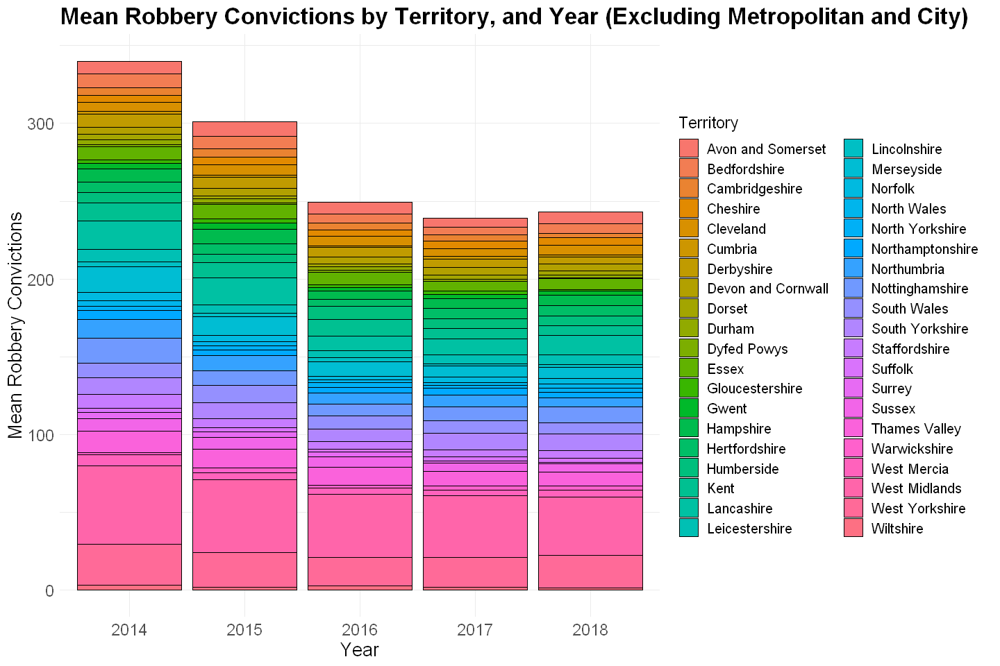

In [1335]:
filtered_df <- combined_df %>%
  filter(!Territory %in% c("Metropolitan and City"))

# Calculate the mean of Robbery Convictions by territory, region, and year (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(Territory, Region, year) %>%
  dplyr::summarize(Mean_Robbery_Convictions = mean(Robbery_Convictions, na.rm = TRUE))

# Bar chart of mean Robbery Convictions by territory, region, and year
bar_chart <- ggplot(mean_stats, aes(x = year, y = Mean_Robbery_Convictions, fill = Territory)) +
  geom_bar(stat = "identity", position = "stack", color = "black") +
  labs(title = "Mean Robbery Convictions by Territory, and Year (Excluding Metropolitan and City)",
       x = "Year",
       y = "Mean Robbery Convictions",
       fill = "Territory") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'Territory', 'Region'. You can override
using the `.groups` argument.


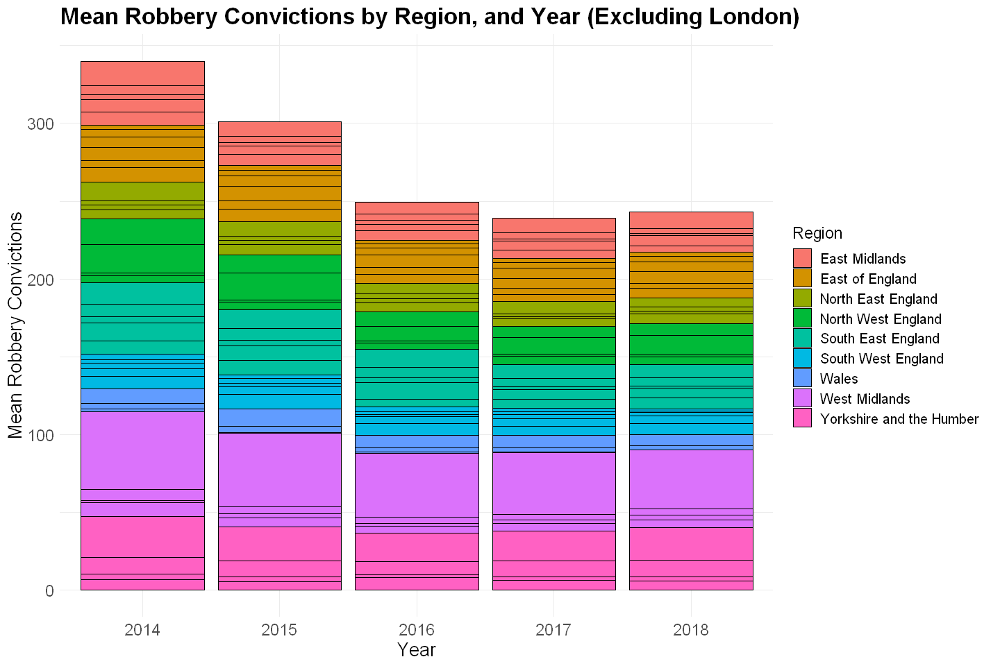

In [1336]:
# Filter out Metropolitan and City from the dataset
filtered_df <- combined_df %>%
  filter(!Region %in% c("London"))

# Calculate the mean of Robbery Convictions by territory, region, and year (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(Territory, Region, year) %>%
  dplyr::summarize(Mean_Robbery_Convictions = mean(Robbery_Convictions, na.rm = TRUE))

# Bar chart of mean Robbery Convictions by territory, region, and year
bar_chart <- ggplot(mean_stats, aes(x = year, y = Mean_Robbery_Convictions, fill = Region)) +
  geom_bar(stat = "identity", position = "stack", color = "black") +
  labs(title = "Mean Robbery Convictions by Region, and Year (Excluding London)",
       x = "Year",
       y = "Mean Robbery Convictions",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

# Display the chart
print(bar_chart)


Robbery Unsucccessful

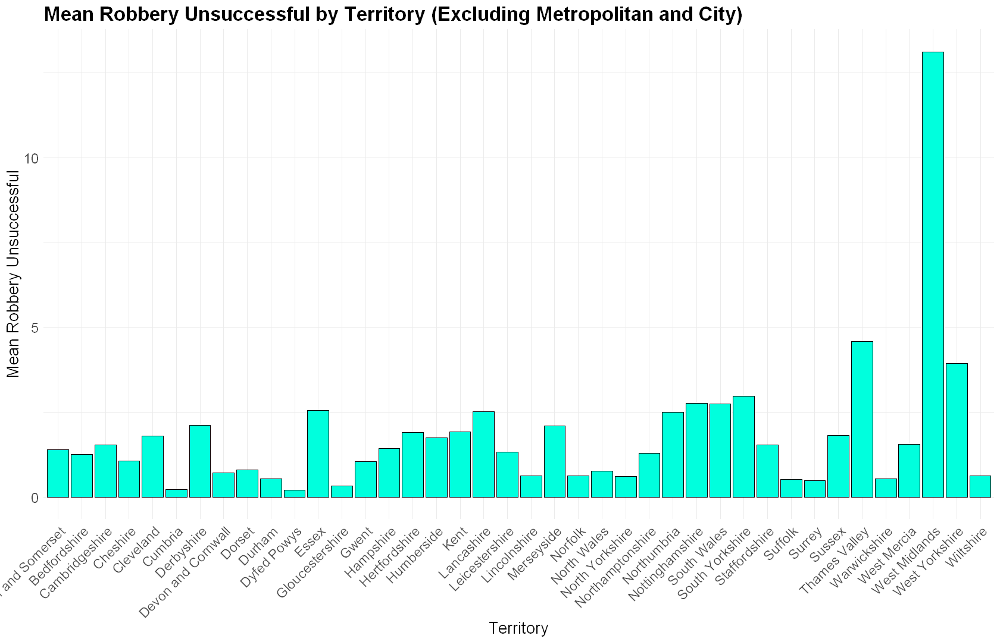

In [1337]:
# Filter out Metropolitan and City from the dataset
filtered_df <- combined_df %>%
  filter(!Territory %in% c("Metropolitan and City"))

# Calculate the mean of Robbery_Unsuccessful by territory (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(Territory) %>%
  dplyr::summarize(Mean_Robbery_Unsuccessful = mean(Robbery_Unsuccessful, na.rm = TRUE))

# Bar chart of mean Robbery_Unsuccessful by territory
bar_chart <- ggplot(mean_stats, aes(x = Territory, y = Mean_Robbery_Unsuccessful)) +
  geom_bar(stat = "identity", fill = "#00ffdd", color = "black") +
  labs(title = "Mean Robbery Unsuccessful by Territory (Excluding Metropolitan and City)",
       x = "Territory",
       y = "Mean Robbery Unsuccessful") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 9)

# Display the chart
print(bar_chart)


`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.


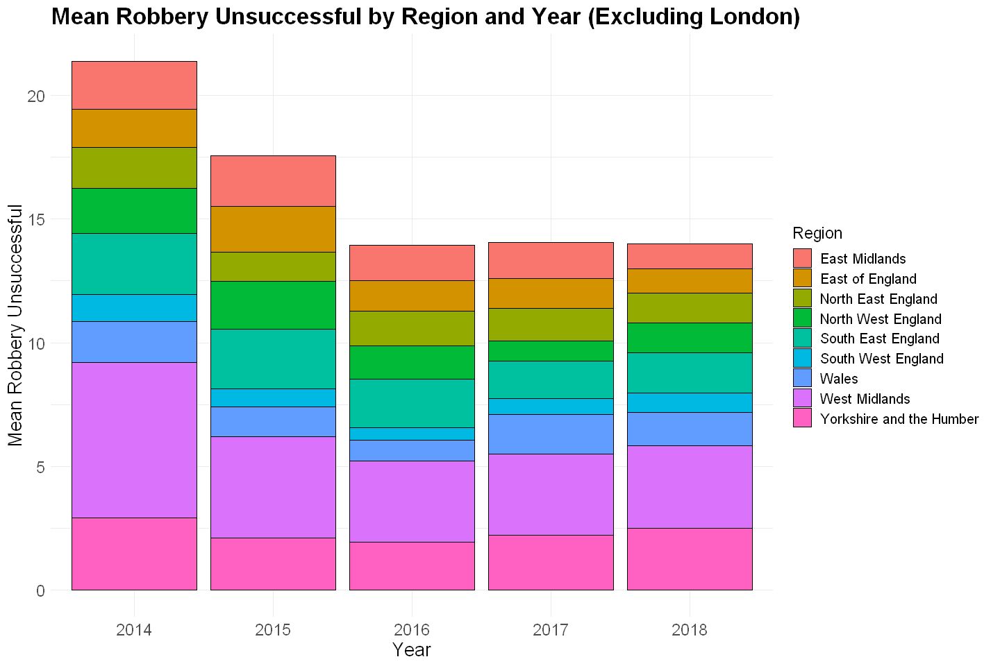

In [1338]:
# Filter out Metropolitan and City from the dataset
filtered_df <- combined_df %>%
  filter(!Region %in% c("London"))

# Calculate the mean of Robbery_Unsuccessful by region and year (excluding Metropolitan and City)
mean_stats <- filtered_df %>%
  group_by(Region, year) %>%
  dplyr::summarize(Mean_Robbery_Unsuccessful = mean(Robbery_Unsuccessful, na.rm = TRUE))

# Bar chart of mean Robbery_Unsuccessful by region and year
bar_chart <- ggplot(mean_stats, aes(x = year, y = Mean_Robbery_Unsuccessful, fill = Region)) +
  geom_bar(stat = "identity", position = "stack", color = "black") +
  labs(title = "Mean Robbery Unsuccessful by Region and Year (Excluding London)",
       x = "Year",
       y = "Mean Robbery Unsuccessful",
       fill = "Region") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        legend.title = element_text(size = 14),
        legend.text = element_text(size = 12))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

# Display the chart
print(bar_chart)


Offences ATP Convictions


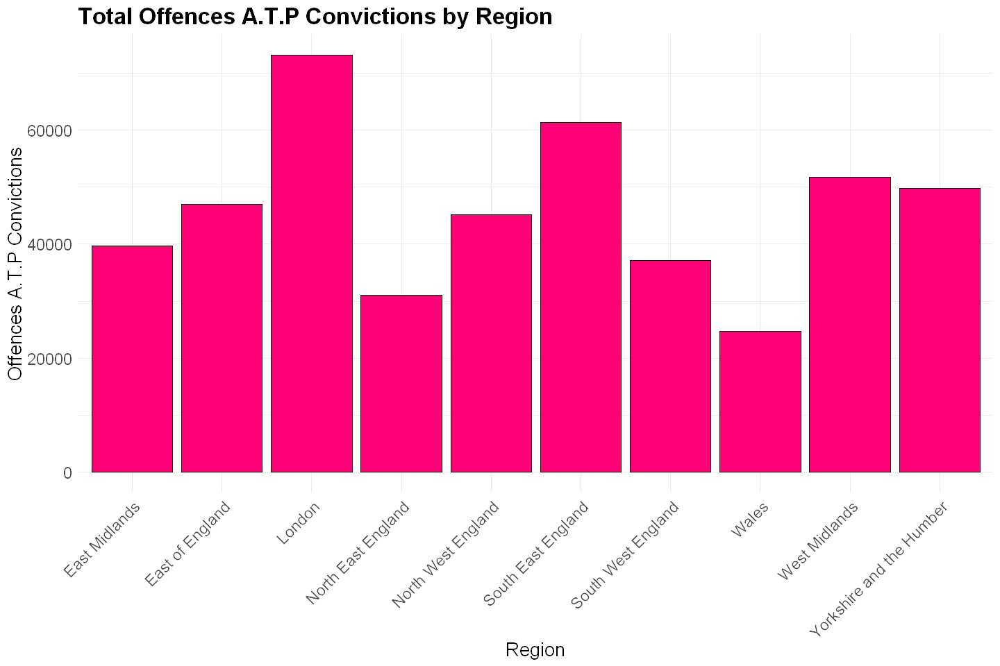

In [1339]:
# Calculate the total Offences_A.T.P_Convictions by Region
region_stats <- combined_df %>%
  group_by(Region) %>%
  dplyr::summarize(Total_Offences_A.T.P_Convictions = sum(Offences_A.T.P_Convictions, na.rm = TRUE))

# Bar chart of Offences_A.T.P_Convictions by Region
bar_chart_region <- ggplot(region_stats, aes(x = Region, y = Total_Offences_A.T.P_Convictions)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Total Offences A.T.P Convictions by Region",
       x = "Region",
       y = "Offences A.T.P Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

# Display the chart
print(bar_chart_region)



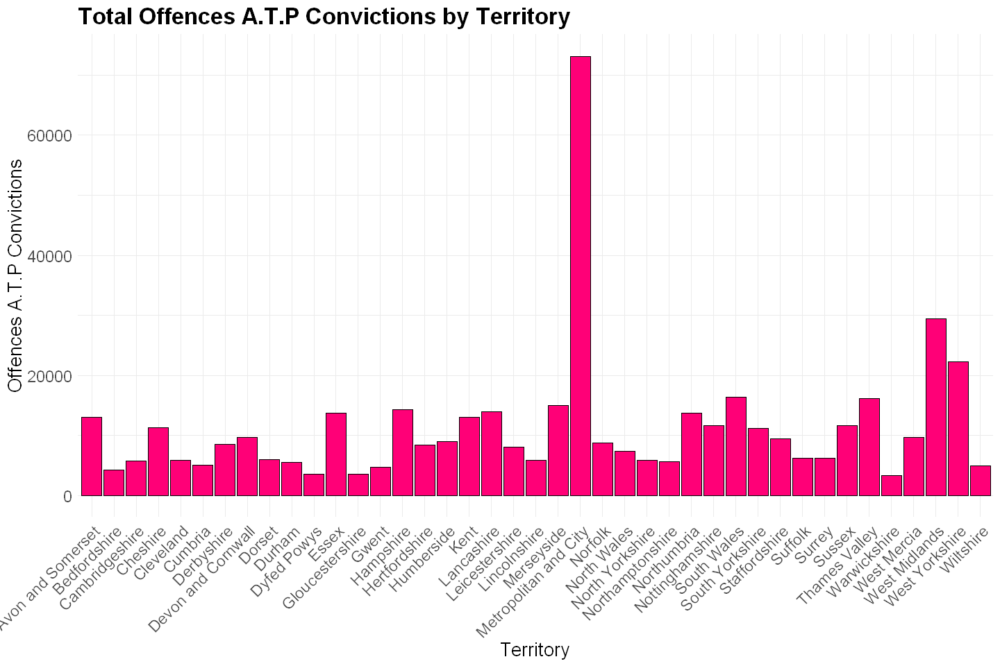

In [1340]:
# Calculate the total Offences_A.T.P_Convictions by Territory
territory_stats <- combined_df %>%
  group_by(Territory) %>%
  dplyr::summarize(Total_Offences_A.T.P_Convictions = sum(Offences_A.T.P_Convictions, na.rm = TRUE))

# Bar chart of Offences_A.T.P_Convictions by Territory
bar_chart_territory <- ggplot(territory_stats, aes(x = Territory, y = Total_Offences_A.T.P_Convictions)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Total Offences A.T.P Convictions by Territory",
       x = "Territory",
       y = "Offences A.T.P Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 8)

# Display the chart
print(bar_chart_territory)


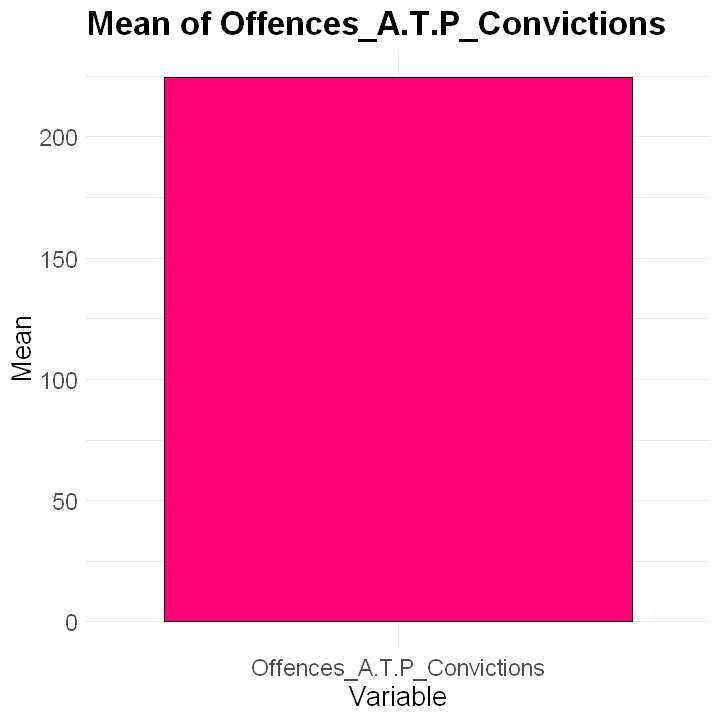

In [1341]:
# Calculate the mean of Offences_A.T.P_Convictions
mean_offences_atp <- mean(combined_df$Offences_A.T.P_Convictions, na.rm = TRUE)

# Create a data frame for plotting
mean_data <- data.frame(Variable = "Offences_A.T.P_Convictions", Mean = mean_offences_atp)

# Bar plot
bar_plot <- ggplot(mean_data, aes(x = Variable, y = Mean)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Mean of Offences_A.T.P_Convictions",
       x = "Variable",
       y = "Mean") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

# Set the size of the plot
options(repr.plot.width = 6, repr.plot.height = 6)

# Display the plot
print(bar_plot)


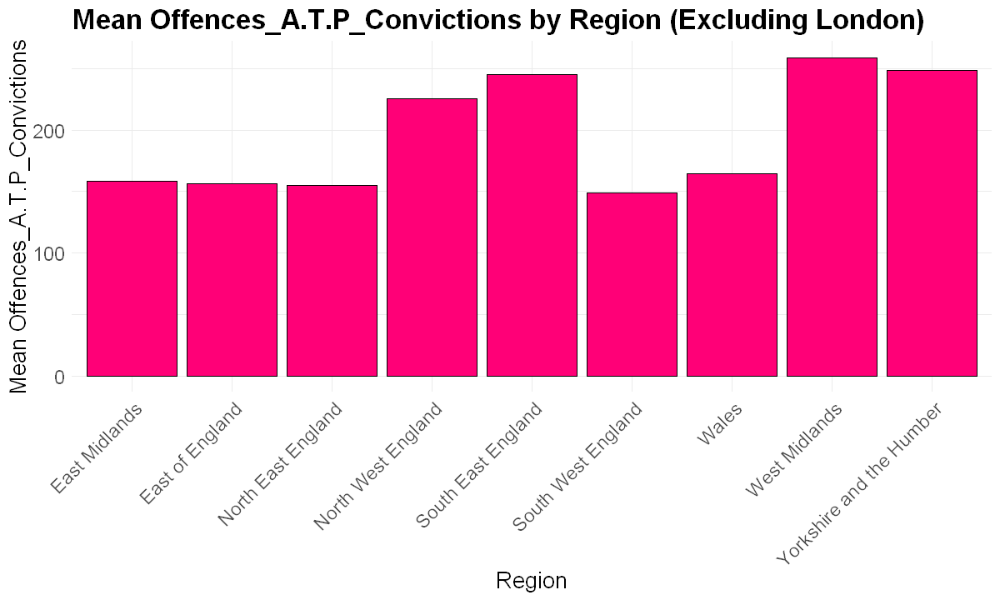

In [1342]:
# Filter out London from the dataset
filtered_df <- combined_df %>%
  filter(Region != "London")

# Calculate the mean of Offences_A.T.P_Convictions by region (excluding London)
mean_stats <- filtered_df %>%
  group_by(Region) %>%
  dplyr::summarize(Mean_Offences_A.T.P_Convictions = mean(Offences_A.T.P_Convictions, na.rm = TRUE))

# Bar plot of mean Offences_A.T.P_Convictions by region (excluding London)
bar_plot <- ggplot(mean_stats, aes(x = Region, y = Mean_Offences_A.T.P_Convictions)) +
  geom_bar(stat = "identity", fill = "#ff0077", color = "black") +
  labs(title = "Mean Offences_A.T.P_Convictions by Region (Excluding London)",
       x = "Region",
       y = "Mean Offences_A.T.P_Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# Set the size of the plot
options(repr.plot.width = 10, repr.plot.height = 6)

# Display the plot
print(bar_plot)


`summarise()` has grouped output by 'Territory'. You can override using the
`.groups` argument.


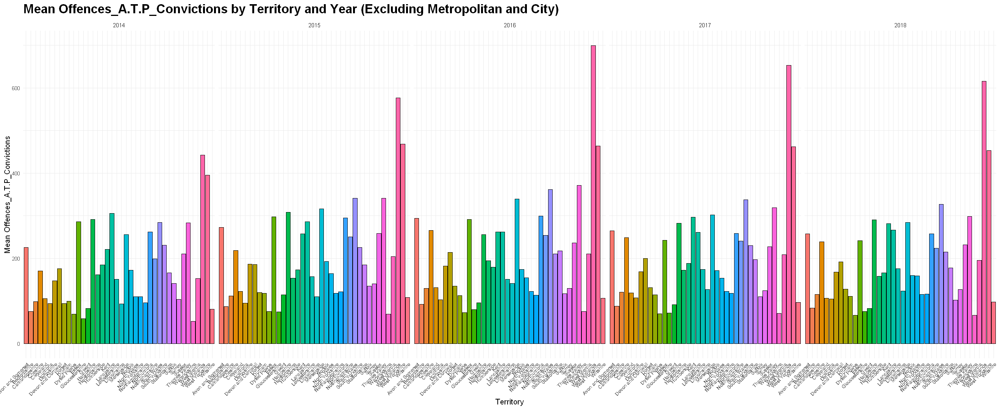

In [1343]:
# Filter out London from the dataset
filtered_df <- combined_df %>%
  filter(Territory != "Metropolitan and City")

# Calculate the mean of Offences_A.T.P_Convictions by territory and year (excluding London)
mean_stats <- filtered_df %>%
  group_by(Territory, year) %>%
  dplyr::summarize(Mean_Offences_A.T.P_Convictions = mean(Offences_A.T.P_Convictions, na.rm = TRUE))

# Bar chart of mean Offences_A.T.P_Convictions by territory and year (excluding London)
bar_chart <- ggplot(mean_stats, aes(x = Territory, y = Mean_Offences_A.T.P_Convictions, fill = Territory)) +
  geom_bar(stat = "identity", color = "black") +
  facet_grid(. ~ year, scales = "free_x") +
  labs(title = "Mean Offences_A.T.P_Convictions by Territory and Year (Excluding Metropolitan and City)",
       x = "Territory",
       y = "Mean Offences_A.T.P_Convictions",
       fill = "Territory") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 12),
        axis.text = element_text(size = 8),
        axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none")

# Set the size of the plot
options(repr.plot.width = 22, repr.plot.height = 9)

# Display the plot
print(bar_chart)


"Offences_A.T.P_Convictions" By country and year (aside from Metropolitan City). Using the facet_grid function, which enables different panels for each year, the bar chart is organised by year. The mean value for a certain territory is represented by each bar. The y-axis displays the mean "Offences_A.T.P_Convictions," the fill colour identifies the various territories, and the x-axis displays the various territories. For improved visibility, the x-axis labels are turned by 45 degrees.

Offences A.T.P Unsuccessful


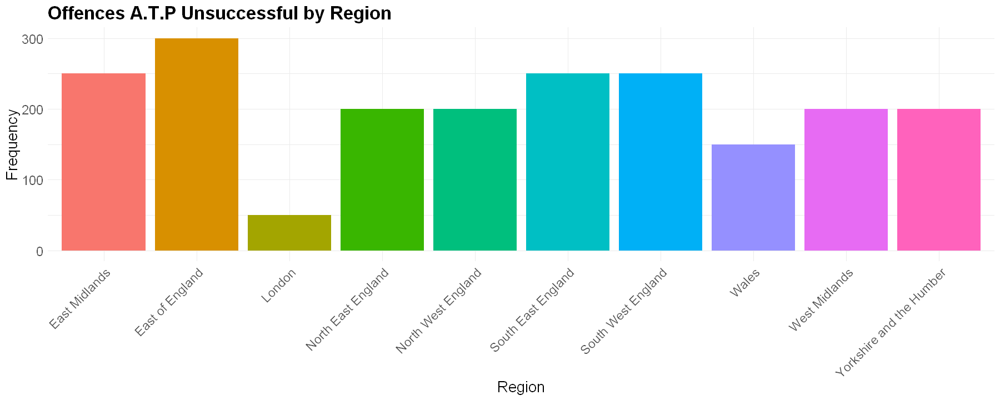

In [1344]:
# Bar chart of Offences A.T.P Unsuccessful by Region
bar_chart_region <- ggplot(combined_df, aes(x = Region, fill = Region)) +
  geom_bar() +
  labs(title = "Offences A.T.P Unsuccessful by Region",
       x = "Region",
       y = "Frequency") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none")

# Set the size of the plot
options(repr.plot.width = 15, repr.plot.height = 6)

# Display the plot
print(bar_chart_region)


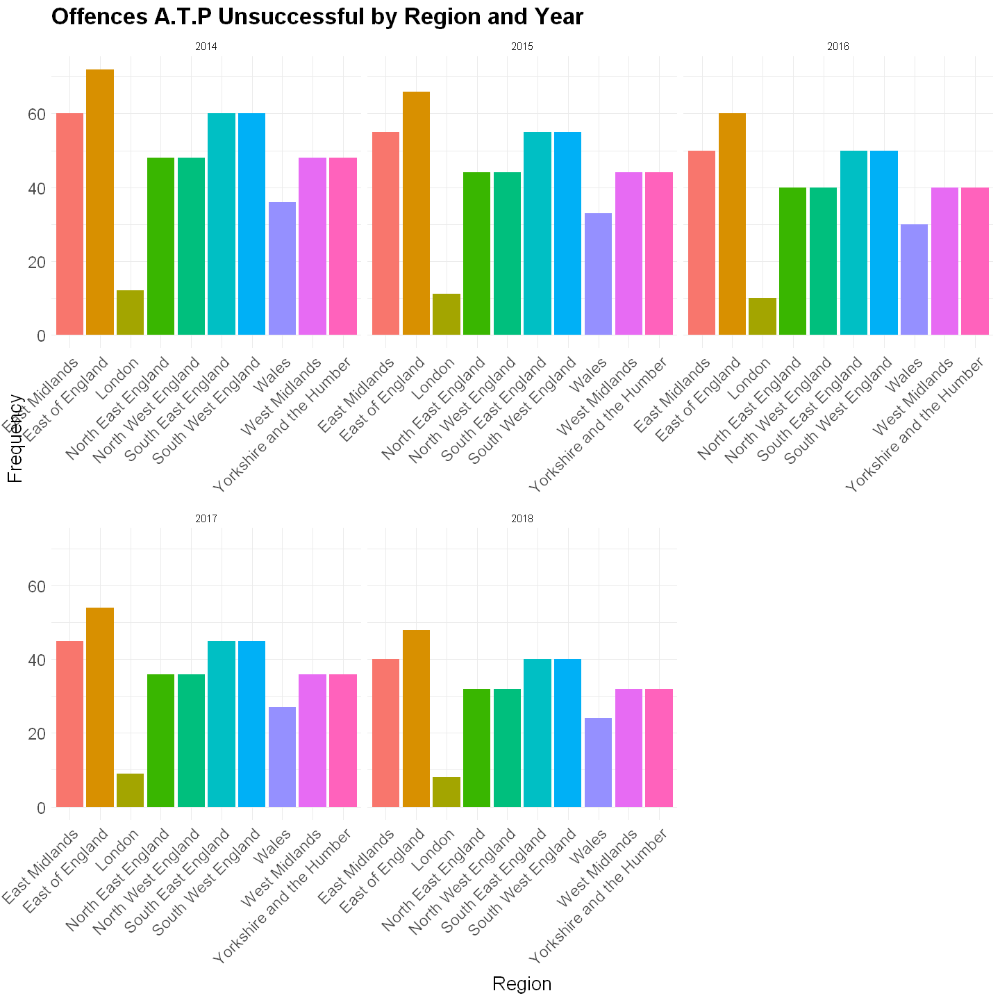

In [1345]:
# Bar chart of Offences A.T.P Unsuccessful by Region and Year
bar_chart_region_year <- ggplot(combined_df, aes(x = Region, fill = Region)) +
  geom_bar() +
  facet_wrap(~ year, scales = "free_x") +
  labs(title = "Offences A.T.P Unsuccessful by Region and Year",
       x = "Region",
       y = "Frequency") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none")

# Set the size of the plot
options(repr.plot.width = 12, repr.plot.height = 12)

# Display the plot
print(bar_chart_region_year)


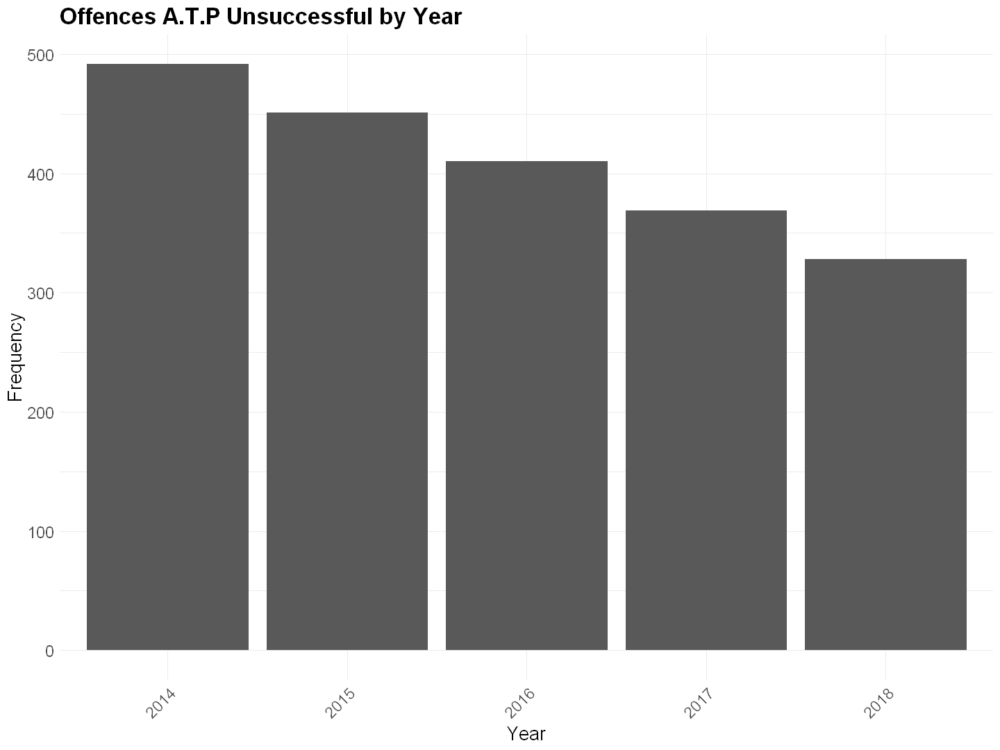

In [1346]:
# Bar chart of Offences A.T.P Unsuccessful by Year
bar_chart_year <- ggplot(combined_df, aes(x = year)) +
  geom_bar() +
  labs(title = "Offences A.T.P Unsuccessful by Year",
       x = "Year",
       y = "Frequency") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14),
        axis.text.x = element_text(angle = 45, hjust = 1))

# plotting size of figure
options(repr.plot.width = 12, repr.plot.height = 9)

# Display the plot
print(bar_chart_year)


Top 5 offences in London

In [1347]:
# Summing up the convictions for each offense
offenses <- c("Homicide_Convictions", "Robbery_Convictions", "Theft_and_Handling_Convictions",
              "Motoring_Offences_Convictions", "Offences_A.T.P_Convictions", "Sexual_Offences_Convictions",
              "Burgalary_Convictions", "Fraud_and_Forgery_Convictions", "Criminal_Damage_Convictions",
              "Drug_Offences_Convictions", "Public_Order_Offences_Convictions")

offense_totals <- colSums(combined_df[, offenses])

# Sorting offenses in descending order
top_5_offenses <- sort(offense_totals, decreasing = TRUE)[1:5]

print(top_5_offenses)


       Offences_A.T.P_Convictions    Theft_and_Handling_Convictions 
                           460590                            386693 
    Motoring_Offences_Convictions         Drug_Offences_Convictions 
                           374176                            193778 
Public_Order_Offences_Convictions 
                           165104 


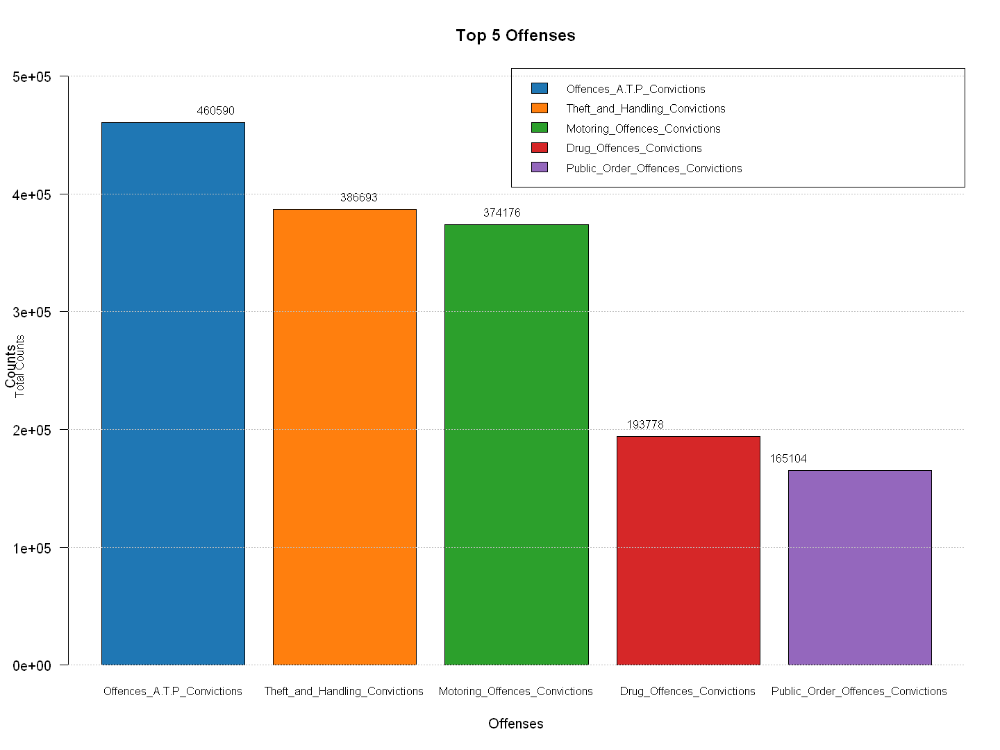

In [1348]:
# Visualise the bar chart of the top 5 offenses
bar_colors <- c("#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd")  # Custom colors for the bars

# Plotting the bar chart with rotated x-axis labels
barplot(top_5_offenses, col = bar_colors, xlab = "Offenses", ylab = "Counts",
        main = "Top 5 Offenses", las = 1, cex.names = 0.8, ylim = c(0, max(top_5_offenses) * 1.1))

# Print the sum of the offenses as a text label on top of each bar
text(1:5, top_5_offenses, labels = top_5_offenses, pos = 3, cex = 0.8)

legend("topright", legend = names(top_5_offenses), fill = bar_colors, cex = 0.8)


grid(nx = NA, ny = NULL, col = "gray", lty = "dotted")

# title for the y-axis
mtext("Total Counts", side = 2, line = 2.5, cex = 0.8)


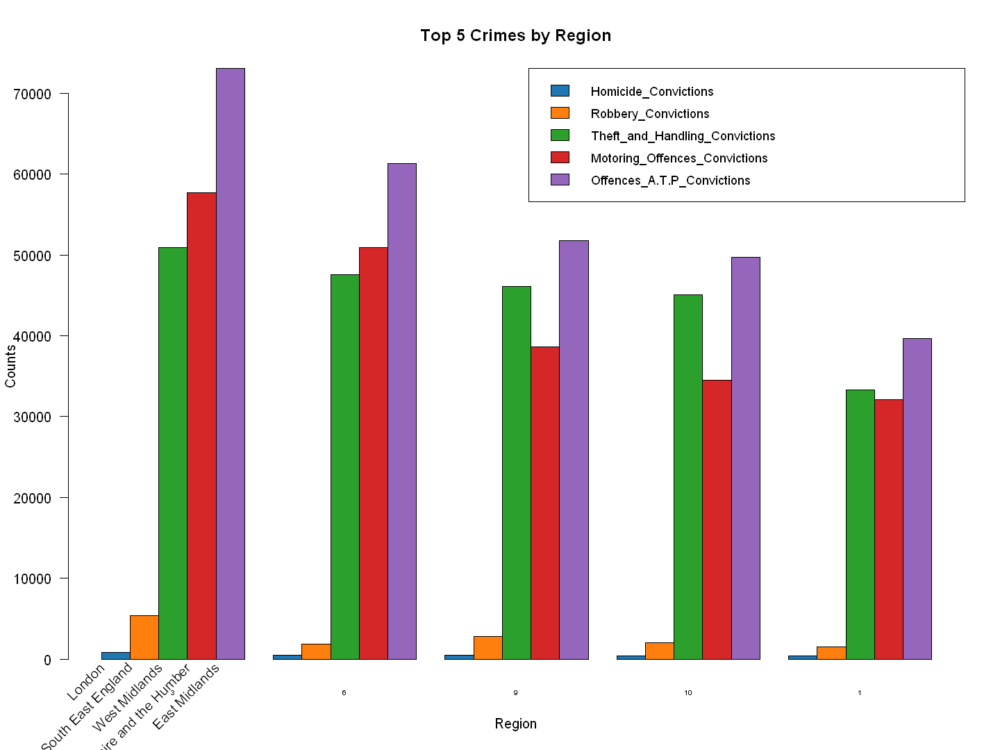

In [1349]:
# Subset the data for the top 5 offenses
top_5_offenses <- c("Homicide_Convictions", "Robbery_Convictions", "Theft_and_Handling_Convictions",
                    "Motoring_Offences_Convictions", "Offences_A.T.P_Convictions")
offense_data <- combined_df[, c("Region", top_5_offenses)]

# Calculate the total offenses for each region
region_totals <- aggregate(offense_data[, top_5_offenses], by = list(offense_data$Region), sum)
region_totals <- region_totals[order(region_totals$Homicide_Convictions, decreasing = TRUE), ]

# Subset the top 5 regions
top_5_regions <- head(region_totals$Group.1, 5)
top_5_region_data <- region_totals[region_totals$Group.1 %in% top_5_regions, ]

# Create a bar chart of the top 5 offenses by region
bar_colors <- c("#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd")  # Custom colors for the bars

# Plotting the bar chart
barplot(t(as.matrix(top_5_region_data[, -1])), col = bar_colors, xlab = "Region", ylab = "Counts",
        main = "Top 5 Crimes by Region", las = 1, cex.names = 0.5, beside = TRUE)

# Customize x-axis labels and rotation
par(xpd = TRUE)  # Enable clipping of labels outside the plot area
text(1:nrow(top_5_region_data), par("usr")[3] - 0.15, srt = 45, adj = 1, labels = top_5_region_data$Group.1, xpd = TRUE)

# Add a legend
legend("topright", legend = top_5_offenses, fill = bar_colors, cex = 0.9)

# Quareterly Analysis of crimes by region 

In [1350]:
combined_df$date <- as.Date(combined_df$date)

combined_df$Quarter <- lubridate::quarter(combined_df$date)

# Group the data by quarter and calculate the sum of offenses
offenses_by_quarter <- combined_df %>%
  group_by(Region,Quarter) %>%
  dplyr::summarise(Total_Offenses = sum(Homicide_Convictions + Offences_A.T.P_Convictions +
                                 Sexual_Offences_Convictions + Burgalary_Convictions +
                                 Robbery_Convictions + Theft_and_Handling_Convictions +
                                 Fraud_and_Forgery_Convictions + Criminal_Damage_Convictions +
                                 Drug_Offences_Convictions + Public_Order_Offences_Convictions +
                                 AOF_asides_Motoring_Convictions + Motoring_Offences_Convictions, na.rm = TRUE))

# Print the offenses by quarter
print(offenses_by_quarter)


`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.


# A tibble: 40 × 3
# Groups:   Region [10]
   Region          Quarter Total_Offenses
   <chr>             <int>          <dbl>
 1 East Midlands         1          42571
 2 East Midlands         2          29561
 3 East Midlands         3          46787
 4 East Midlands         4          39016
 5 East of England       1          49169
 6 East of England       2          33242
 7 East of England       3          51760
 8 East of England       4          43495
 9 London                1          85736
10 London                2          61929
# ℹ 30 more rows


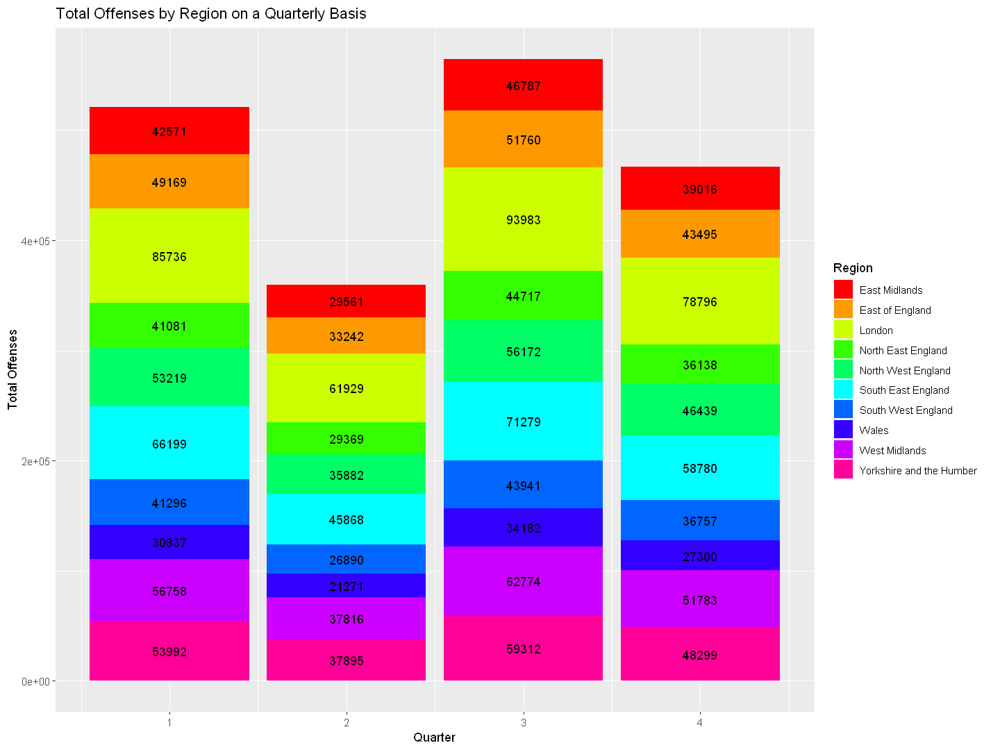

In [1351]:
# Create a bar plot with count values correctly placed inside each bar
barplot <- ggplot(data = offenses_by_quarter, aes(x = Quarter, y = Total_Offenses, fill = Region)) +
  geom_bar(stat = "identity") +
  geom_text(aes(label = Total_Offenses), position = position_stack(vjust = 0.5), color = "black") +  # Adjust label positioning
  labs(title = "Total Offenses by Region on a Quarterly Basis",
       x = "Quarter",
       y = "Total Offenses") +
  scale_fill_manual(values = rainbow(n_distinct(offenses_by_quarter$Region)))

# Print the bar plot
print(barplot)


In [1352]:
combined_df$date <- as.Date(combined_df$date)
combined_df$Quarter <- lubridate::quarter(combined_df$date)

# Select the columns related to convictions
conviction_columns <- c('Homicide_Convictions', 'Offences_A.T.P_Convictions', 'Sexual_Offences_Convictions',
                        'Burgalary_Convictions', 'Robbery_Convictions', 'Theft_and_Handling_Convictions',
                        'Fraud_and_Forgery_Convictions', 'Criminal_Damage_Convictions', 'Drug_Offences_Convictions',
                        'Public_Order_Offences_Convictions', 'AOF_asides_Motoring_Convictions', 'Motoring_Offences_Convictions')

# Group the data by region, quarter, and calculate the sum of convictions for each offense category
convictions_by_region_quarter <- combined_df %>%
  group_by(Region, Quarter) %>%
  dplyr::summarise(across(all_of(conviction_columns), sum, na.rm = TRUE))

# Determine the top offenses by region and quarter
top_offenses_by_region_quarter <- convictions_by_region_quarter %>%
  group_by(Region, Quarter) %>%
  summarise(Total_Offenses = sum(across(all_of(conviction_columns)))) %>%
  top_n(5, Total_Offenses) %>%
  arrange(Region, Quarter, desc(Total_Offenses))

# Print the top offenses by region and quarter
print(top_offenses_by_region_quarter)


`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'Region'. You can override using the
`.groups` argument.


# A tibble: 40 × 3
# Groups:   Region [10]
   Region          Quarter Total_Offenses
   <chr>             <int>          <dbl>
 1 East Midlands         1          42571
 2 East Midlands         2          29561
 3 East Midlands         3          46787
 4 East Midlands         4          39016
 5 East of England       1          49169
 6 East of England       2          33242
 7 East of England       3          51760
 8 East of England       4          43495
 9 London                1          85736
10 London                2          61929
# ℹ 30 more rows


`summarise()` has grouped output by 'Region', 'Year'. You can override using
the `.groups` argument.


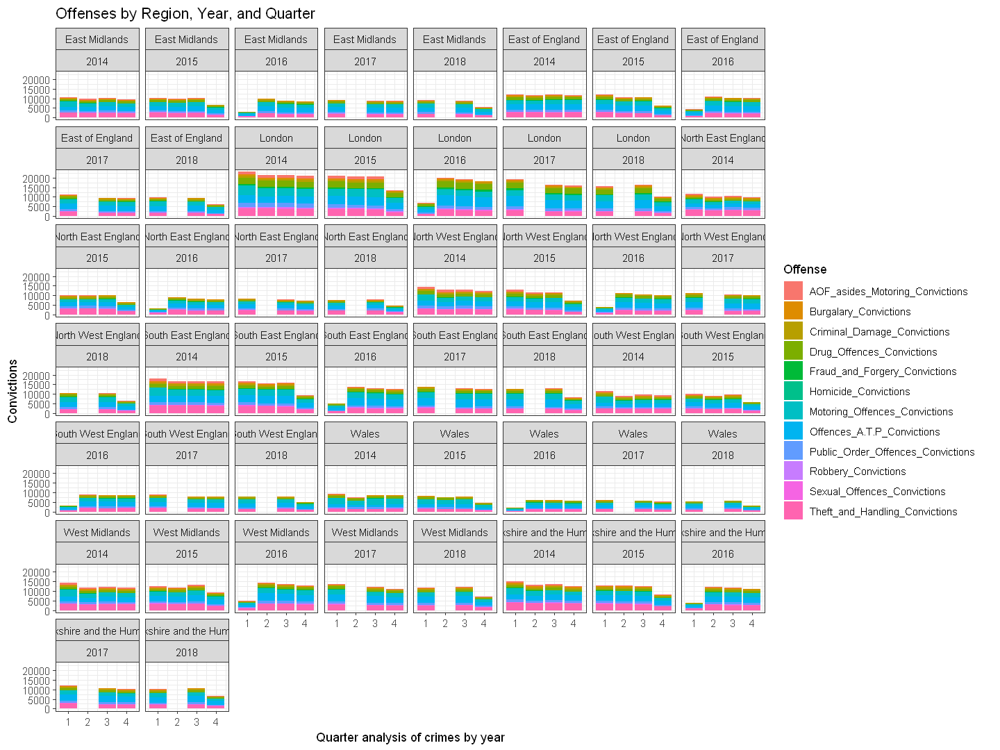

In [1353]:
combined_df$date <- as.Date(combined_df$date)
combined_df$Quarter <- lubridate::quarter(combined_df$date)
combined_df$Year <- lubridate::year(combined_df$date)

# Select the columns related to convictions
conviction_columns <- c('Homicide_Convictions', 'Offences_A.T.P_Convictions', 'Sexual_Offences_Convictions',
                        'Burgalary_Convictions', 'Robbery_Convictions', 'Theft_and_Handling_Convictions',
                        'Fraud_and_Forgery_Convictions', 'Criminal_Damage_Convictions', 'Drug_Offences_Convictions',
                        'Public_Order_Offences_Convictions', 'AOF_asides_Motoring_Convictions', 'Motoring_Offences_Convictions')

# Group the data by region, year, quarter, and calculate the sum of convictions for each offense category
convictions_by_region_year_quarter <- combined_df %>%
  group_by(Region, Year, Quarter) %>%
  summarise(across(all_of(conviction_columns), sum, na.rm = TRUE))

# Reshape the data from wide to long format for visualization
convictions_long <- convictions_by_region_year_quarter %>%
  pivot_longer(cols = all_of(conviction_columns), names_to = "Offense", values_to = "Convictions")

# Create the bar plot
barplot <- ggplot(data = convictions_long, aes(x = Quarter, y = Convictions, fill = Offense)) +
  geom_bar(stat = "identity", position = "stack") +
  labs(title = "Offenses by Region, Year, and Quarter",
       x = "Quarter analysis of crimes by year",
       y = "Convictions",
       fill = "Offense") +
  facet_wrap(~Region + Year, ) +
  theme_bw()

# Print the bar plot
print(barplot)


# Offences over time

Offences_ATP_Convictions

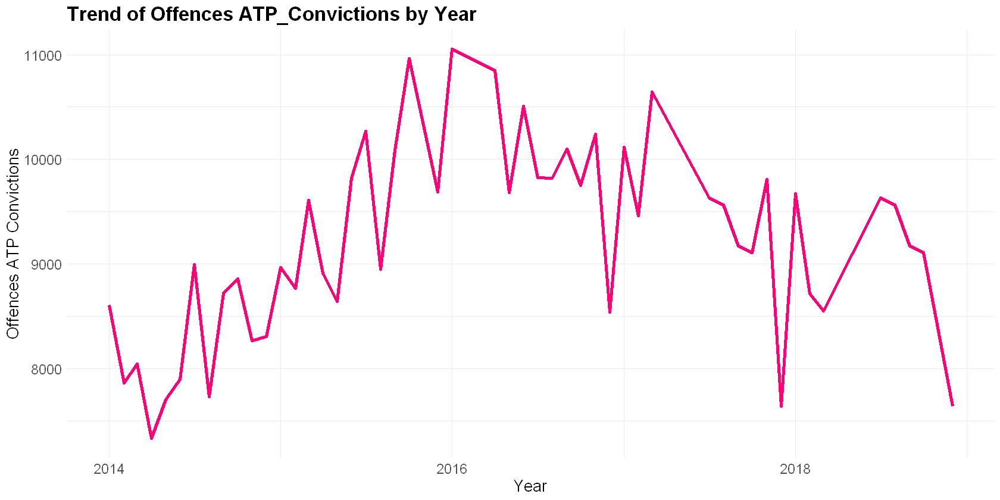

In [1354]:
summary_stats <- combined_df %>%
  group_by(date) %>%
  dplyr::summarize(Offences_A.T.P_Convictions = sum(Offences_A.T.P_Convictions))

# Line Graph
line_graph <- ggplot(summary_stats, aes(x = date, y = Offences_A.T.P_Convictions)) +
  geom_line(color = "#ff0077", size = 1.5) +
  labs(title = "Trend of Offences ATP_Convictions by Year",
       x = "Year",
       y = "Offences ATP Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

# Set the size of the plot
options(repr.plot.width = 14, repr.plot.height = 7)

# Display the chart
print(line_graph)

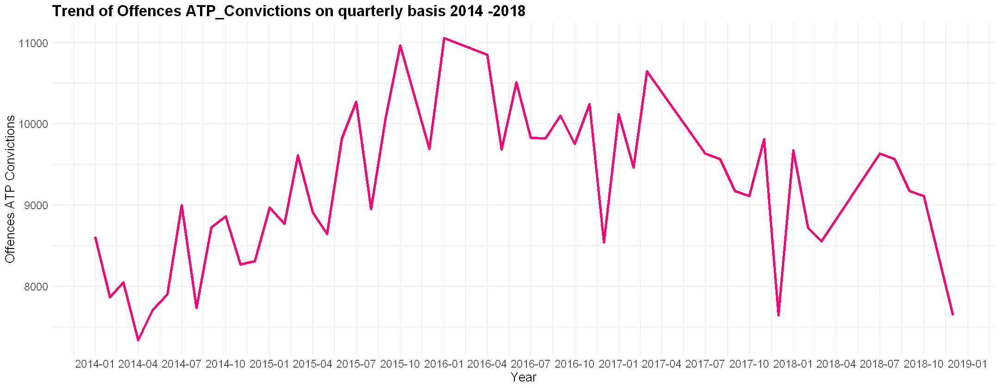

In [1355]:
combined_df$date <- as.Date(combined_df$date)

# Assuming 'combined_df' is your data frame containing the relevant data

summary_stats <- combined_df %>%
  group_by(date) %>%
  dplyr::summarize(Offences_A.T.P_Convictions = sum(Offences_A.T.P_Convictions))

# Line Graph
line_graph <- ggplot(summary_stats, aes(x = date, y = Offences_A.T.P_Convictions)) +
  geom_line(color = "#ff0077", size = 1.5) +
  labs(
    title = "Trend of Offences ATP_Convictions on quarterly basis 2014 -2018",
    x = "Year",
    y = "Offences ATP Convictions"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(size = 20, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  ) +
  scale_x_date(date_labels = "%Y-%m", date_breaks = "3 months")  # Adjust the x-axis labels

# Set the size of the plot
options(repr.plot.width = 18, repr.plot.height = 7)

# Display the chart
print(line_graph)


Theft and Handling Convictions

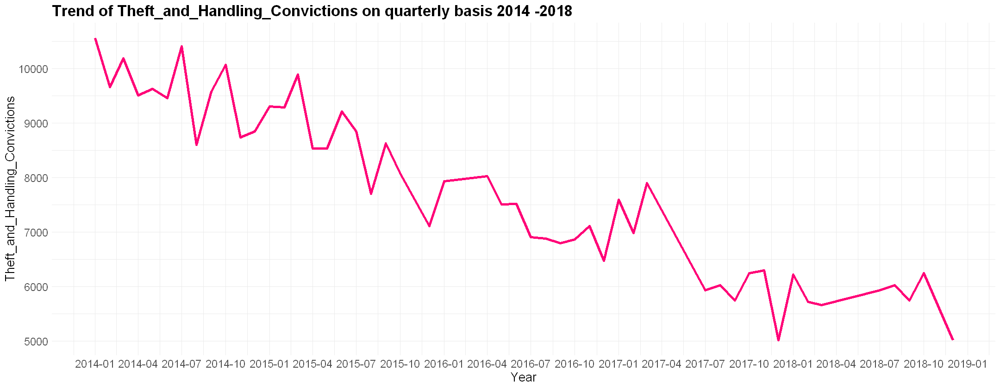

In [1356]:
combined_df$date <- as.Date(combined_df$date)

summary_stats <- combined_df %>%
  group_by(date) %>%
  dplyr::summarize(Theft_and_Handling_Convictions= sum(Theft_and_Handling_Convictions))

# Line Graph
line_graph <- ggplot(summary_stats, aes(x = date, y = Theft_and_Handling_Convictions)) +
  geom_line(color = "#ff0077", size = 1.5) +
  labs(
    title = "Trend of Theft_and_Handling_Convictions on quarterly basis 2014 -2018",
    x = "Year",
    y = "Theft_and_Handling_Convictions"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(size = 20, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  ) +
  scale_x_date(date_labels = "%Y-%m", date_breaks = "3 months")  # Adjust the x-axis labels

# Set the size of the plot
options(repr.plot.width = 18, repr.plot.height = 7)

# Display the chart
print(line_graph)


Motoring_Offences_Convictions

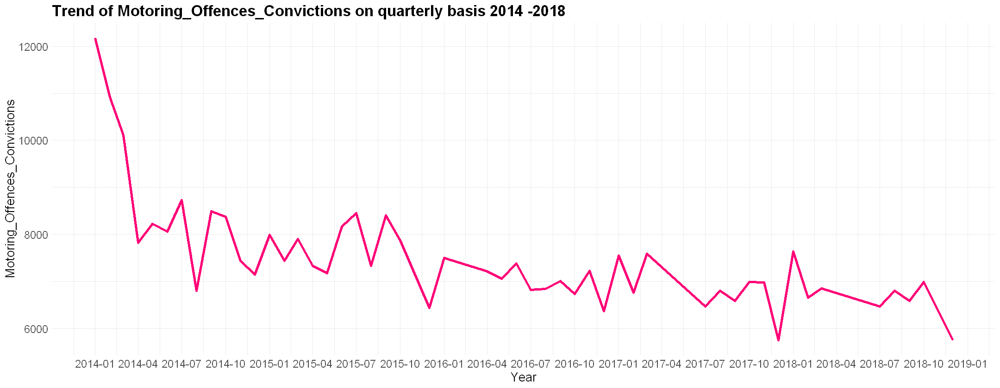

In [1357]:
combined_df$date <- as.Date(combined_df$date)

summary_stats <- combined_df %>%
  group_by(date) %>%
  dplyr::summarize(Motoring_Offences_Convictions= sum(Motoring_Offences_Convictions))

# Line Graph
line_graph <- ggplot(summary_stats, aes(x = date, y = Motoring_Offences_Convictions)) +
  geom_line(color = "#ff0077", size = 1.5) +
  labs(
    title = "Trend of Motoring_Offences_Convictions on quarterly basis 2014 -2018",
    x = "Year",
    y = "Motoring_Offences_Convictions"
  ) +
  theme_minimal() +
  theme(
    plot.title = element_text(size = 20, face = "bold"),
    axis.title = element_text(size = 16),
    axis.text = element_text(size = 14)
  ) +
  scale_x_date(date_labels = "%Y-%m", date_breaks = "3 months")  # Adjust the x-axis labels

# Set the size of the plot
options(repr.plot.width = 18, repr.plot.height = 7)

# Display the chart
print(line_graph)


In [1358]:
colnames(combined_df)

[1] "Territory"                              
 [2] "Homicide_Convictions"                   
 [3] "Homicide_Unsuccessful"                  
 [4] "Offences_A.T.P_Convictions"             
 [5] "Offences_A.T.P_Convictions_Unsuccessful"
 [6] "Sexual_Offences_Convictions"            
 [7] "Sexual_Offences_Unsuccessful"           
 [8] "Burgalary_Convictions"                  
 [9] "Burgalary_Unsuccessful"                 
[10] "Robbery_Convictions"                    
[11] "Robbery_Unsuccessful"                   
[12] "Theft_and_Handling_Convictions"         
[13] "Theft_and_Handling_Unsuccessful"        
[14] "Fraud_and_Forgery_Convictions"          
[15] "Fraud_and_Forgery_Unsuccessful"         
[16] "Criminal_Damage_Convictions"            
[17] "Criminal_Damage_Unsuccessful"           
[18] "Drug_Offences_Convictions"              
[19] "Drug_Offences_Unsuccessful"             
[20] "Public_Order_Offences_Convictions"      
[21] "Public_Order_Offences_Unsuccessful"     
[22] "AOF_asides_Motoring_Convictions"        
[23] "AOF_asides_Motoring_Unsuccessful"       
[24] "Motoring_Offences_Convictions"          
[25] "Motoring_Offences_Unsuccessful"         
[26] "Admin_Finalised_Unsuccessful"           
[27] "year"                                   
[28] "month"                                  
[29] "Region"                                 
[30] "date"                                   
[31] "Quarter"                                
[32] "Year"

# Correlation Analysis between theft and Handling convictions, Robbery Convictions, Burgalary Convictions

,Theft_and_Handling_Convictions,Theft_and_Handling_Unsuccessful,Robbery_Convictions,Robbery_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful
Theft_and_Handling_Convictions,1.0000000,0.9100819,0.8973103,0.8518109,0.9373637,0.8878359
Theft_and_Handling_Unsuccessful,0.9100819,1.0000000,0.8714700,0.8507119,0.9158346,0.9033163
Robbery_Convictions,0.8973103,0.8714700,1.0000000,0.9132585,0.9061792,0.8885323
Robbery_Unsuccessful,0.8518109,0.8507119,0.9132585,1.0000000,0.8581936,0.8673988
Burgalary_Convictions,0.9373637,0.9158346,0.9061792,0.8581936,1.0000000,0.9053744
Burgalary_Unsuccessful,0.8878359,0.9033163,0.8885323,0.8673988,0.9053744,1.0000000


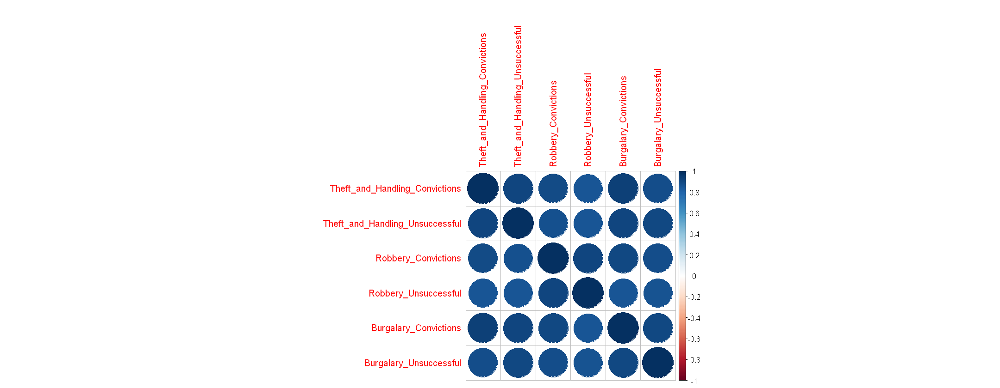

In [1359]:
# Select the variables you want to correlate
selected_vars <- c("Theft_and_Handling_Convictions", 'Theft_and_Handling_Unsuccessful', "Robbery_Convictions",'Robbery_Unsuccessful', "Burgalary_Convictions", 'Burgalary_Unsuccessful')

# Create a subset of your dataset with the selected variables
subset_data <- combined_df[, selected_vars]

# Calculate the correlation matrix
correlation_matrix <- cor(subset_data)

# Print the correlation matrix
head(correlation_matrix)

corrplot(correlation_matrix)


these crimes are very strongly correlated

#Kendall method

                                Theft_and_Handling_Convictions
Theft_and_Handling_Convictions                       1.0000000
Theft_and_Handling_Unsuccessful                      0.6320674
Robbery_Convictions                                  0.5105384
Robbery_Unsuccessful                                 0.4055904
Burgalary_Convictions                                0.6705699
Burgalary_Unsuccessful                               0.5194227
                                Theft_and_Handling_Unsuccessful
Theft_and_Handling_Convictions                        0.6320674
Theft_and_Handling_Unsuccessful                       1.0000000
Robbery_Convictions                                   0.4657303
Robbery_Unsuccessful                                  0.3575569
Burgalary_Convictions                                 0.5496507
Burgalary_Unsuccessful                                0.4801855
                                Robbery_Convictions Robbery_Unsuccessful
Theft_and_Handling_Convictions        

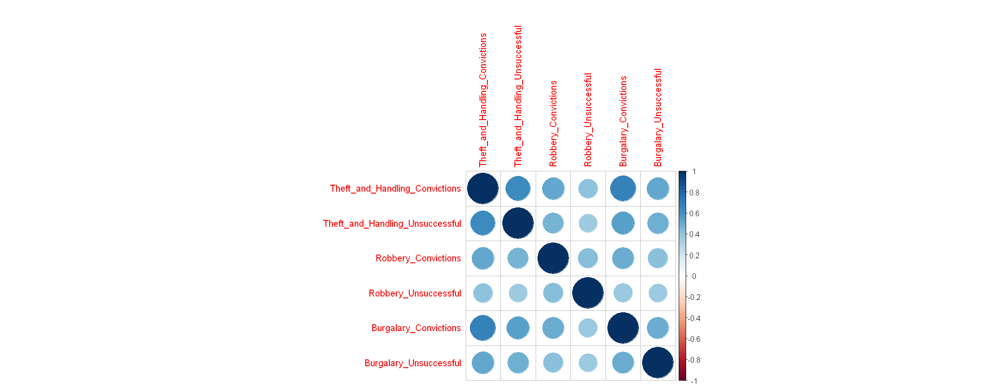

In [1360]:
# Select the variables you want to correlate
selected_vars <- c("Theft_and_Handling_Convictions", "Theft_and_Handling_Unsuccessful", "Robbery_Convictions", "Robbery_Unsuccessful", "Burgalary_Convictions", "Burgalary_Unsuccessful")

# Create a subset of your dataset with the selected variables
subset_data <- combined_df[, selected_vars]

# Calculate the correlation matrix using Kendall method
correlation_matrix <- cor(subset_data, method = "kendall")

# Print the correlation matrix
print(correlation_matrix)

# Visualize the correlation matrix
corrplot(correlation_matrix)


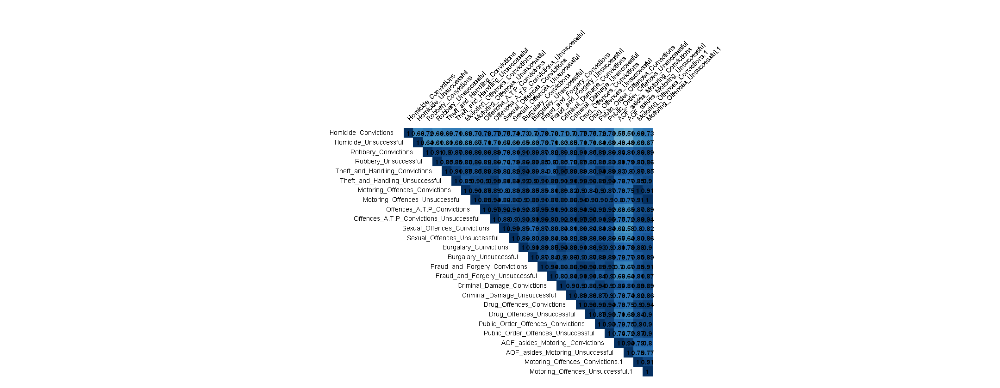

In [1361]:
selected_vars <- c("Homicide_Convictions", "Homicide_Unsuccessful", "Robbery_Convictions", "Robbery_Unsuccessful", "Theft_and_Handling_Convictions",
"Theft_and_Handling_Unsuccessful", "Motoring_Offences_Convictions", "Motoring_Offences_Unsuccessful", "Offences_A.T.P_Convictions", 
"Offences_A.T.P_Convictions_Unsuccessful","Sexual_Offences_Convictions", "Sexual_Offences_Unsuccessful", "Burgalary_Convictions", "Burgalary_Unsuccessful",
"Fraud_and_Forgery_Convictions", "Fraud_and_Forgery_Unsuccessful","Criminal_Damage_Convictions", "Criminal_Damage_Unsuccessful", "Drug_Offences_Convictions",
"Drug_Offences_Unsuccessful", "Public_Order_Offences_Convictions","Public_Order_Offences_Unsuccessful",
"AOF_asides_Motoring_Convictions", "AOF_asides_Motoring_Unsuccessful", "Motoring_Offences_Convictions", "Motoring_Offences_Unsuccessful")

# Subset the data based on selected variables
subset_data <- combined_df[, selected_vars]

# Calculate the correlation matrix
correlation_matrix <- cor(subset_data)

# Customize the correlation matrix plot
corrplot(correlation_matrix, method = "color", type = "upper",
         tl.col = "black", tl.srt = 45, tl.cex = 0.7,
         addCoef.col = "black", number.cex = 0.7, mar = c(0,0,0,0),
         tl.offset = 0.9, cl.pos = "n")

# Set the size of the plot
options(repr.plot.width = 18, repr.plot.height = 16)


the heatmap and matrxi above shows a strong correlation between the variables in the dataset. The correlation strength is indicated by a deeper blue which represents positive correlation when they are closer to the value of 1 and weak correlatons are indicated with a lighter blue or white indicator which shows eark correlation ot no correlation. Through this we can idenitfy the patterns and interpret further information in the dataaset.

Spearman method

In [1362]:
# Select only numeric columns from combined_df
numeric_df <- combined_df %>%
  select_if(is.numeric)

# Calculate the correlation matrix using Spearman method
crime_cor <- cor(numeric_df, method = "spearman")

# Print the correlation matrix
print(crime_cor)


                                        Homicide_Convictions
Homicide_Convictions                              1.00000000
Homicide_Unsuccessful                             0.38303881
Offences_A.T.P_Convictions                        0.47834572
Offences_A.T.P_Convictions_Unsuccessful           0.43953399
Sexual_Offences_Convictions                       0.44181426
Sexual_Offences_Unsuccessful                      0.37291768
Burgalary_Convictions                             0.41659493
Burgalary_Unsuccessful                            0.29902288
Robbery_Convictions                               0.38108885
Robbery_Unsuccessful                              0.33340154
Theft_and_Handling_Convictions                    0.38613515
Theft_and_Handling_Unsuccessful                   0.31976049
Fraud_and_Forgery_Convictions                     0.41722095
Fraud_and_Forgery_Unsuccessful                    0.32077412
Criminal_Damage_Convictions                       0.38729439
Criminal_Damage_Unsucces

# Correlation

,Homicide_Convictions,Homicide_Unsuccessful,Offences_A.T.P_Convictions,Offences_A.T.P_Convictions_Unsuccessful,Sexual_Offences_Convictions,Sexual_Offences_Unsuccessful,Burgalary_Convictions,Burgalary_Unsuccessful,Robbery_Convictions,Robbery_Unsuccessful,⋯,Drug_Offences_Unsuccessful,Public_Order_Offences_Convictions,Public_Order_Offences_Unsuccessful,AOF_asides_Motoring_Convictions,AOF_asides_Motoring_Unsuccessful,Motoring_Offences_Convictions,Motoring_Offences_Unsuccessful,Admin_Finalised_Unsuccessful,Quarter,Year
Homicide_Convictions,1.00000000,0.66494432,0.791315829,0.77067514,0.74861021,0.735962666,0.73079421,0.70200887,0.71656362,0.65686685,⋯,0.75375850,0.71639787,0.73478793,0.54870459,0.51349708,0.68548362,0.72590493,0.76534859,0.025221401,0.080880075
Homicide_Unsuccessful,0.66494432,1.00000000,0.713974810,0.71428151,0.66864771,0.656523509,0.65045400,0.63003069,0.63664009,0.61105738,⋯,0.70837473,0.64158021,0.68353112,0.49289640,0.47614445,0.62968577,0.66568335,0.70480884,0.014700454,0.043919365
Offences_A.T.P_Convictions,0.79131583,0.71397481,1.000000000,0.96758833,0.92381220,0.909533286,0.91597629,0.87485734,0.86430858,0.82363990,⋯,0.92420446,0.91542946,0.92345168,0.68766821,0.64848765,0.87493033,0.89446853,0.91885778,-0.001713121,0.030721930
Offences_A.T.P_Convictions_Unsuccessful,0.77067514,0.71428151,0.967588330,1.00000000,0.88176604,0.895069080,0.92527269,0.90927582,0.88132967,0.85810827,⋯,0.95363916,0.91228025,0.95078135,0.74556736,0.71992261,0.89045445,0.93616863,0.92771259,-0.012507241,-0.043440587
Sexual_Offences_Convictions,0.74861021,0.66864771,0.923812197,0.88176604,1.00000000,0.925176129,0.85021749,0.79477457,0.78663734,0.74322070,⋯,0.84386216,0.84038354,0.83719805,0.61925438,0.58092858,0.80384310,0.81666737,0.84832927,0.025410536,0.064045083
Sexual_Offences_Unsuccessful,0.73596267,0.65652351,0.909533286,0.89506908,0.92517613,1.000000000,0.86117381,0.82761879,0.80887555,0.78250451,⋯,0.86003927,0.85545109,0.85926624,0.66877720,0.64074561,0.82548116,0.85602965,0.86196233,0.015400779,0.004411044
Burgalary_Convictions,0.73079421,0.65045400,0.915976293,0.92527269,0.85021749,0.861173814,1.00000000,0.90537436,0.90617918,0.85819360,⋯,0.87700299,0.92586634,0.90498966,0.80754759,0.77685965,0.88495102,0.89676958,0.86207491,-0.030561389,-0.117696033
Burgalary_Unsuccessful,0.70200887,0.63003069,0.874857341,0.90927582,0.79477457,0.827618789,0.90537436,1.00000000,0.88853229,0.86739878,⋯,0.87144420,0.88356615,0.89370917,0.78749498,0.77040732,0.84593642,0.88862567,0.84410827,-0.029840079,-0.120167001
Robbery_Convictions,0.71656362,0.63664009,0.864308575,0.88132967,0.78663734,0.808875554,0.90617918,0.88853229,1.00000000,0.91325853,⋯,0.84734508,0.89488471,0.86326354,0.83807146,0.80753927,0.85805292,0.88638862,0.85305991,-0.032559365,-0.089286403
Robbery_Unsuccessful,0.65686685,0.61105738,0.823639900,0.85810827,0.74322070,0.782504510,0.85819360,0.86739878,0.91325853,1.00000000,⋯,0.82596311,0.84643172,0.83270111,0.80565612,0.79392256,0.82722692,0.86077367,0.82286917,-0.023537675,-0.085385098


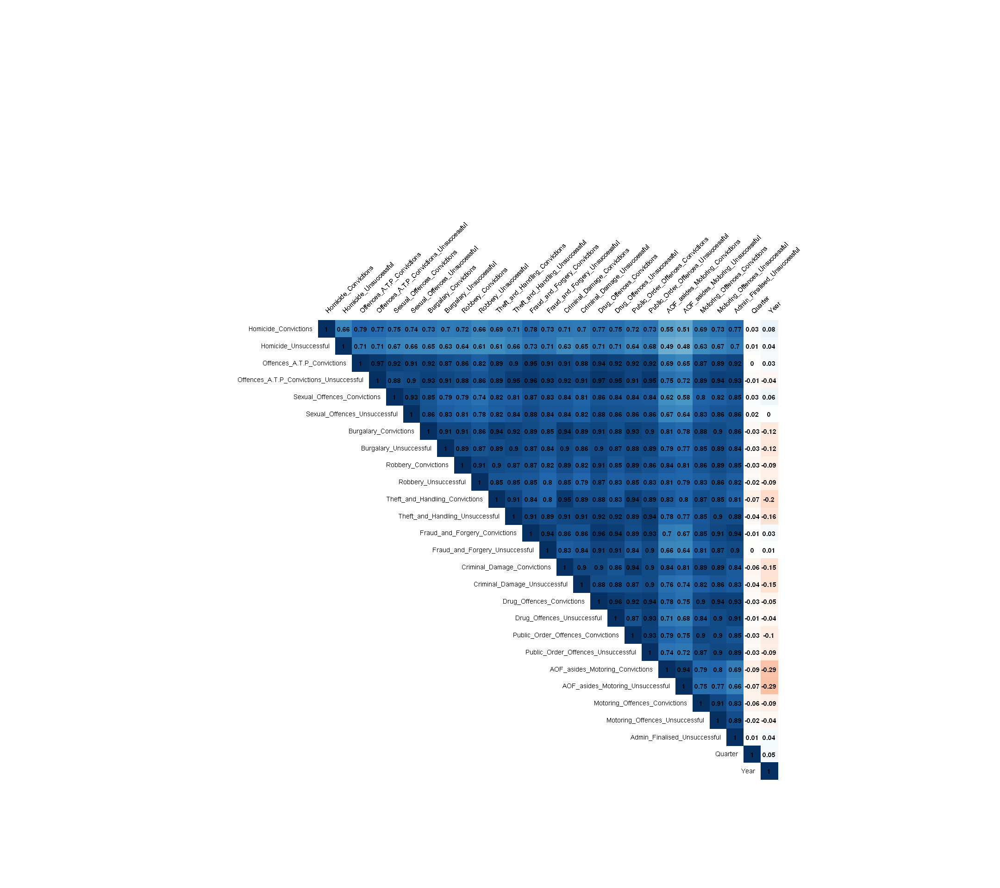

In [1363]:

# Select only numeric columns from combined_df
numeric_df <- combined_df %>%
  select_if(is.numeric)

# Calculate the correlation matrix
crime_cor <- cor(numeric_df, method = "pearson")

# Print the correlation matrix
crime_cor
corrplot(crime_cor, method = "color", type = "upper",
         tl.col = "black", tl.srt = 45, tl.cex = 0.7,
         addCoef.col = "black", number.cex = 0.7, mar = c(0,0,0,0),
         tl.offset = 0.5, cl.pos = "n")


This correlation matrix aboe does a general correaltion of the entire dataset. As the dataset is numeric and categroical, most of the numeric variables has about 1 

# Correlation for successful convictions

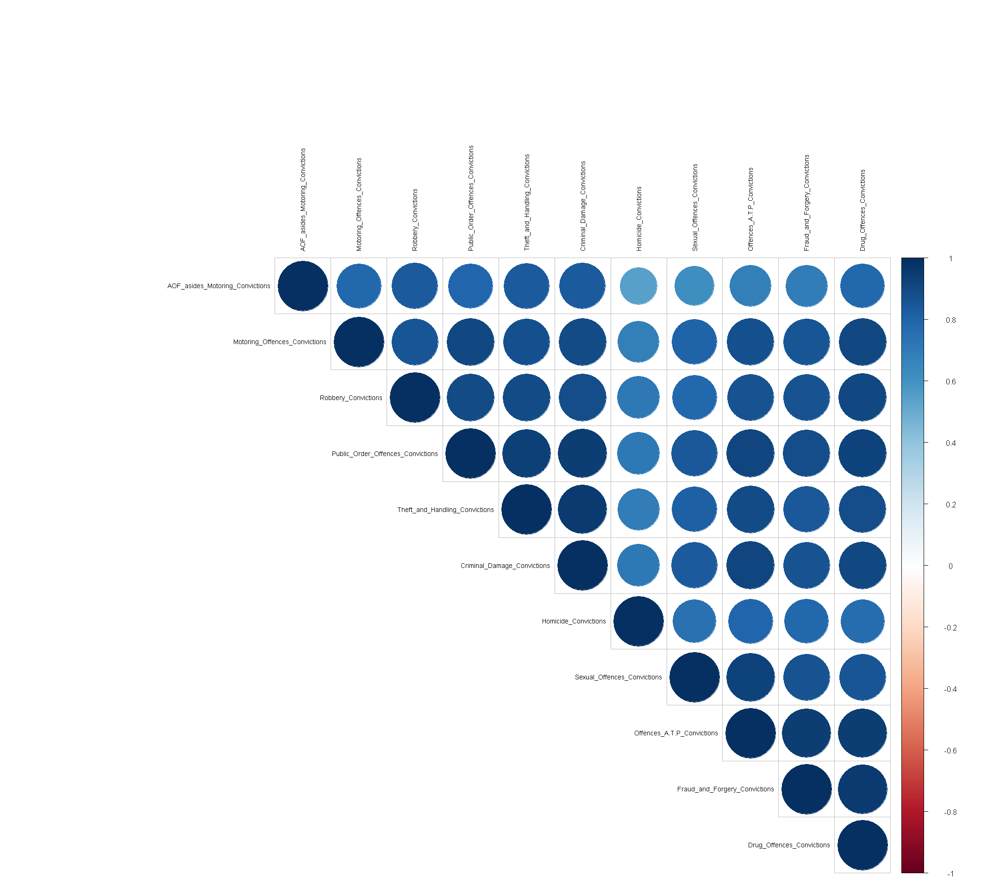

In [1364]:
columns <- c("Homicide_Convictions", "Robbery_Convictions", "Theft_and_Handling_Convictions", 
             "Motoring_Offences_Convictions", "Offences_A.T.P_Convictions", "Sexual_Offences_Convictions", 
             "Burglary_Convictions", "Fraud_and_Forgery_Convictions", "Criminal_Damage_Convictions", 
             "Drug_Offences_Convictions", "Public_Order_Offences_Convictions", "AOF_asides_Motoring_Convictions")

# Subset the column names to those that exist in the dataset
existing_columns <- intersect(columns, colnames(combined_df))

# Subset the dataset with the selected columns
subset_data <- combined_df[, existing_columns]

# Compute the correlation matrix
crime_corr <- cor(subset_data)

# Set up the plot area
par(mar = c(2, 2, 2, 2))

# Create the correlation plot
corrplot(crime_corr, type = "upper", order = "hclust", tl.cex = 0.7, tl.col = "black", is.corr = TRUE)

# Reset the plot margin
par(mar = c(5, 4, 4, 2))


Most crimes as seen in the correlation matrix

"Homicide_Unsuccessful", "Robbery_Unsuccessful", "Theft_and_Handling_Unsuccessful", "Motoring_Offences_Unsuccessful", "Offences_A.T.P_Convictions_Unsuccessful", "Sexual_Offences_Unsuccessful", ""Burgalary_Unsuccessful", "Fraud_and_Forgery_Unsuccessful", "Criminal_Damage_Unsuccessful", "Drug_Offences_Unsuccessful", "Public_Order_Offences_Unsuccessful", "AOF_asides_Motoring_Unsuccessful", "Motoring_Offences_Unsuccessful"

# Correlation for unsuccesful convictions

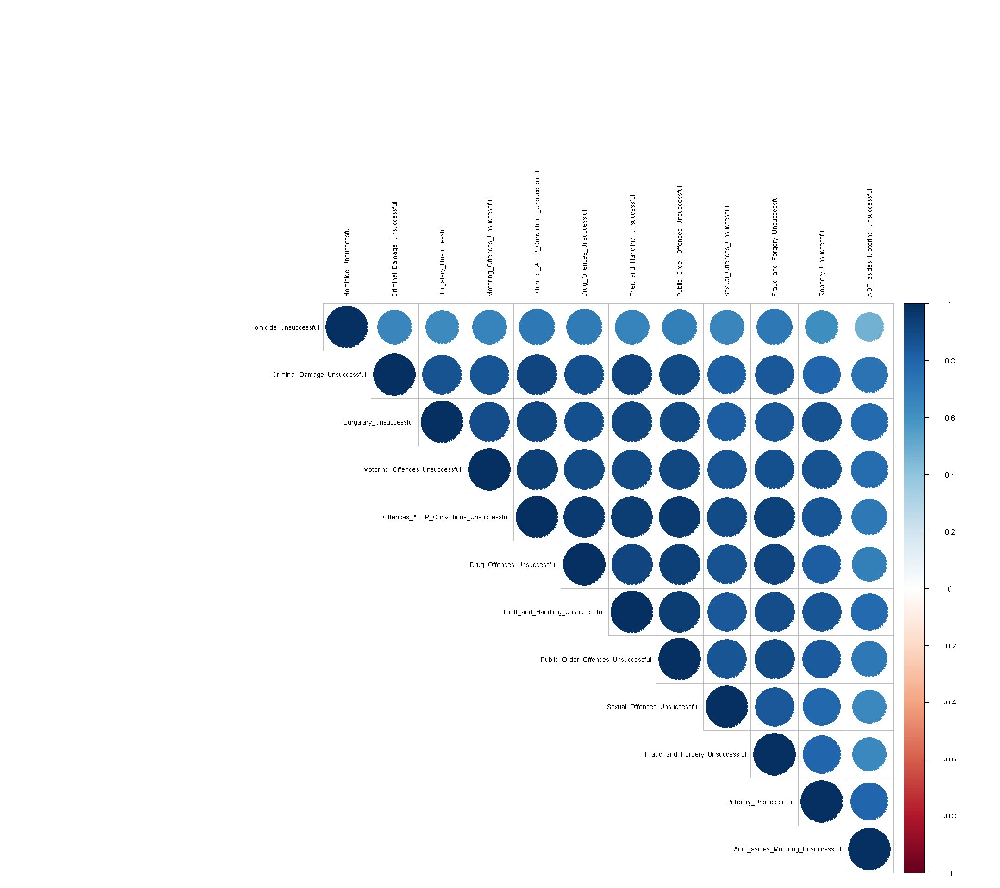

In [1365]:
columns <- c("Homicide_Unsuccessful", "Robbery_Unsuccessful", "Theft_and_Handling_Unsuccessful",
             "Motoring_Offences_Unsuccessful", "Offences_A.T.P_Convictions_Unsuccessful",
             "Sexual_Offences_Unsuccessful", "Burgalary_Unsuccessful", "Fraud_and_Forgery_Unsuccessful",
             "Criminal_Damage_Unsuccessful", "Drug_Offences_Unsuccessful",
             "Public_Order_Offences_Unsuccessful", "AOF_asides_Motoring_Unsuccessful",
             "Motoring_Offences_Unsuccessful")

existing_columns <- intersect(columns, colnames(combined_df))

subset_data <- combined_df[, existing_columns]

# Remove missing values from the subsetted data
subset_data <- na.omit(subset_data)

# Compute the correlation matrix
success_corr <- cor(subset_data)

# Set up the plot area
par(mar = c(2, 2, 2, 2))

# Create the correlation plot
corrplot(success_corr, type = "upper", order = "hclust", tl.cex = 0.7, tl.col = "black", is.corr = TRUE)

# Reset the plot margin
par(mar = c(5, 4, 4, 2))


Correlation between variables

# Theft_and _Handling and Robbery Convictions 

In [1366]:
# Calculate correlation between Theft_and_Handling_Convictions and Robbery_Convictions
correlation <- cor(combined_df$Theft_and_Handling_Convictions, combined_df$Robbery_Convictions, use = "complete.obs")

# Print the correlation coefficient
print(correlation)


[1] 0.8973103


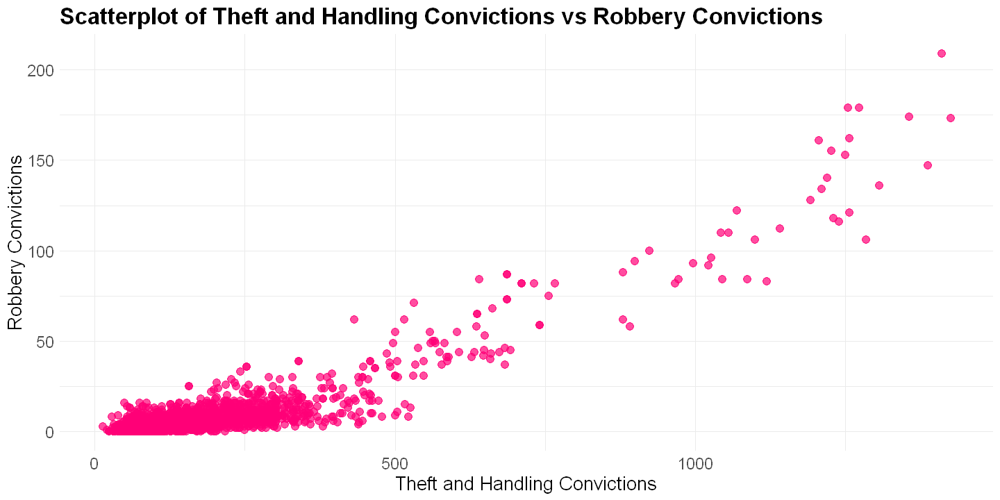

In [1367]:
scatterplot <- ggplot(combined_df, aes(x = Theft_and_Handling_Convictions, y = Robbery_Convictions)) +
  geom_point(color = "#ff0077", size = 3, alpha = 0.7) +
  labs(title = "Scatterplot of Theft and Handling Convictions vs Robbery Convictions",
       x = "Theft and Handling Convictions",
       y = "Robbery Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

options(repr.plot.width = 12, repr.plot.height = 6)

print(scatterplot)


The scatterplot indicates that For values 75 and above there is a higher correlation between Theft and Robbery while for lower values, there is no strong correlation.

In [1368]:
correlation <- cor(combined_df$Theft_and_Handling_Convictions, combined_df$Burgalary_Convictions, use = "complete.obs")

# Print the correlation coefficient
print(correlation)

[1] 0.9373637


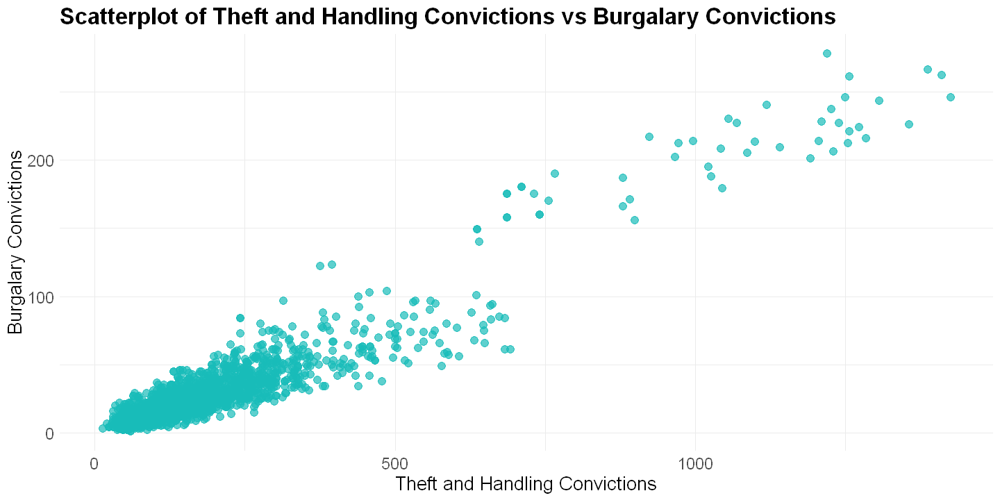

In [1369]:
scatterplot <- ggplot(combined_df, aes(x = Theft_and_Handling_Convictions, y = Burgalary_Convictions)) +
  geom_point(color = "#18bcb9", size = 3, alpha = 0.7) +
  labs(title = "Scatterplot of Theft and Handling Convictions vs Burgalary Convictions",
       x = "Theft and Handling Convictions",
       y = "Burgalary Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

options(repr.plot.width = 12, repr.plot.height = 6)

print(scatterplot)


In [1370]:
correlation <- cor(combined_df$Motoring_Offences_Convictions, combined_df$Motoring_Offences_Unsuccessful, use = "complete.obs")

# Print the correlation coefficient
print(correlation)

[1] 0.9130434


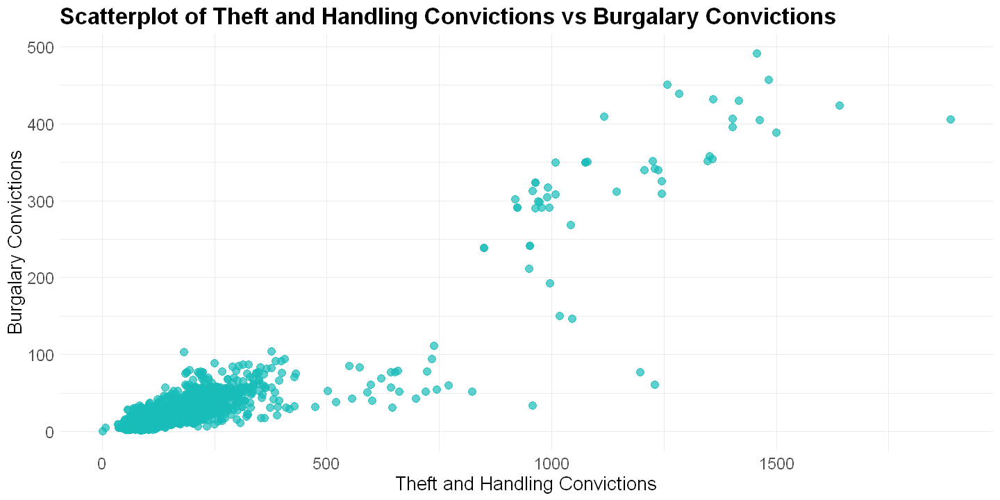

In [1371]:
scatterplot <- ggplot(combined_df, aes(x = Motoring_Offences_Convictions, y = Motoring_Offences_Unsuccessful)) +
  geom_point(color = "#18bcb9", size = 3, alpha = 0.7) +
  labs(title = "Scatterplot of Theft and Handling Convictions vs Burgalary Convictions",
       x = "Theft and Handling Convictions",
       y = "Burgalary Convictions") +
  theme_minimal() +
  theme(plot.title = element_text(size = 20, face = "bold"),
        axis.title = element_text(size = 16),
        axis.text = element_text(size = 14))

options(repr.plot.width = 12, repr.plot.height = 6)

print(scatterplot)

In [1372]:
#These two crimes are somwehat linear

`summarise()` has grouped output by 'year'. You can override using the
`.groups` argument.


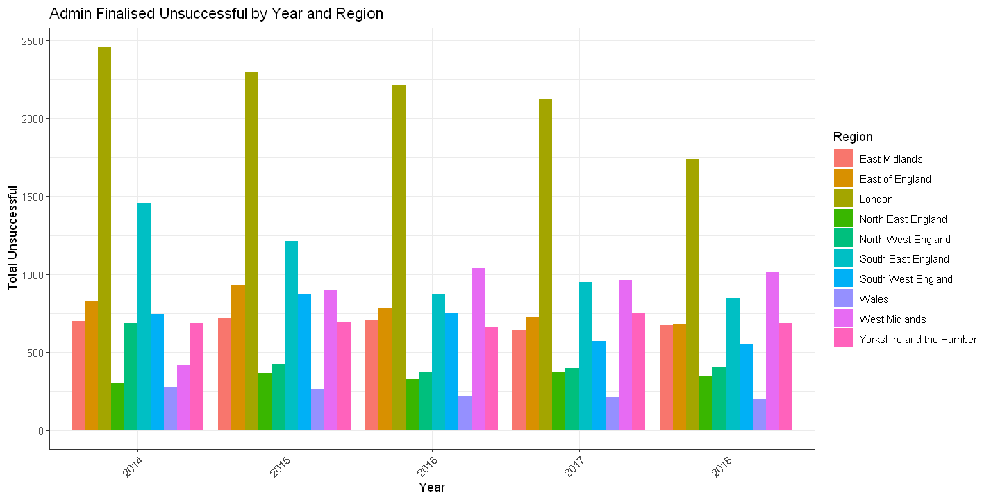

In [1373]:
# Subset the data for the specific variable and columns of interest
subset_data <- combined_df[, c("year", "Region", "Admin_Finalised_Unsuccessful")]

# Group the data by year and region and calculate the sum of 'Admin_Finalised_Unsuccessful'
grouped_data <- subset_data %>%
  group_by(year, Region) %>%
  dplyr::summarize(total_unsuccessful = sum(Admin_Finalised_Unsuccessful))

# Plot the bar plot
ggplot(grouped_data, aes(x = year, y = total_unsuccessful, fill = Region)) +
  geom_bar(stat = "identity", position = "dodge") +
  labs(x = "Year", y = "Total Unsuccessful", fill = "Region") +
  ggtitle("Admin Finalised Unsuccessful by Year and Region") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for better readability


Standard Normal dsitribution

In [1374]:
# Extract the specific variable from your dataset
homicide_convictions <- combined_df$Homicide_Convictions
# Calculate the standard deviation, excluding missing values
standard_deviation <- sd(homicide_convictions, na.rm = TRUE)

# Print the standard deviation
print(standard_deviation)

[1] 3.176639


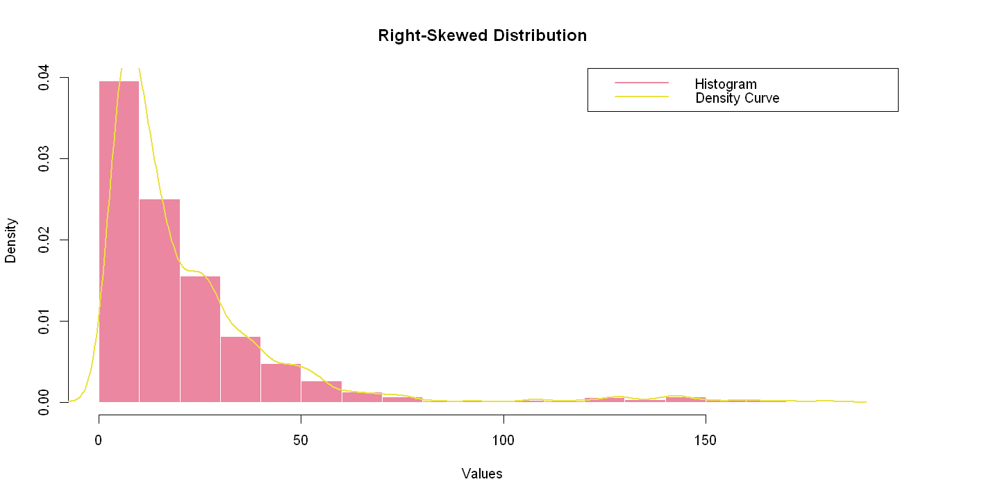

In [1375]:
my_variable <- combined_df$Sexual_Offences_Convictions

data <- rnorm(length(my_variable), mean = mean(my_variable), sd = sd(my_variable))

par(mfrow = c(1, 1))
par(mar = c(5, 4, 4, 6) + 0.1)  # Adjust the margins
par(mgp = c(3, 1, 0))  # Adjust the spacing

hist(my_variable, freq = FALSE, main = "Right-Skewed Distribution",
     xlab = "Values", ylab = "Density", col = "#eb87a0", border = "white")
lines(density(my_variable), col = "#ece040", lwd = 2)

legend("topright", legend = c("Histogram", "Density Curve"),
       col = c("#eb87a0", "#ece040"), lwd = 2)

title(main = "")



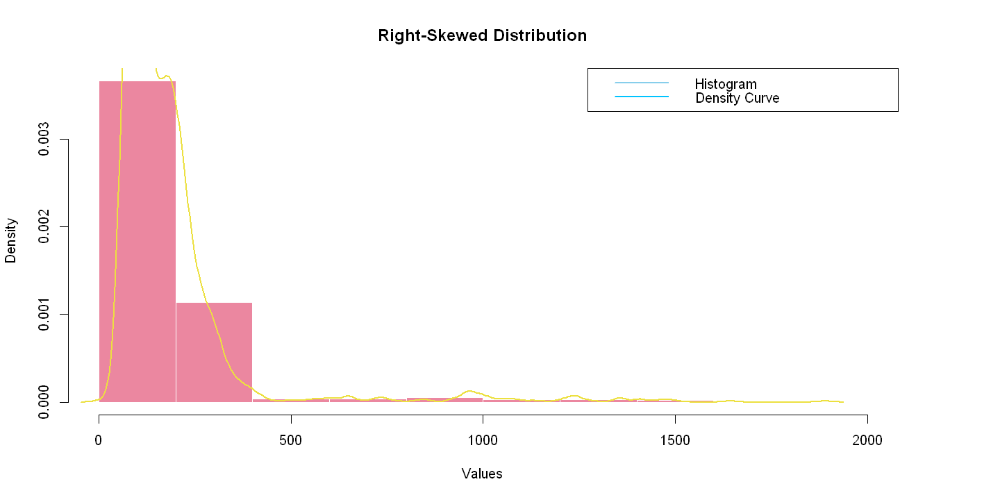

In [1376]:
my_variable <- combined_df$Motoring_Offences_Convictions

par(mfrow = c(1, 1))
par(mar = c(5, 4, 4, 6) + 0.1)  # Adjust the margins
par(mgp = c(3, 1, 0))  # Adjust the spacing

hist(my_variable, freq = FALSE, main = "Right-Skewed Distribution",
     xlab = "Values", ylab = "Density", col = "#eb87a0", border = "white")
lines(density(my_variable), col = "#ece040", lwd = 2)

legend("topright", legend = c("Histogram", "Density Curve"),
       col = c("skyblue", "#00c3ff"), lwd = 2)

title(main = "")

# Hypotheses 1

We want to investigate the Proportion of offences against the person is higher during the 3rd quarter compared to other offences.

Null : The mean of Conviction of Offences_A.T.P is the same each quarter

Alternate: The mean of Conviciton of Offences against a person is different in at least one quarter.

Test: One- way Anova

significance level = 0.05

In [1377]:
one_way_anova <- aov(Offences_A.T.P_Convictions ~ Quarter, data <- combined_df)

summary(one_way_anova)

              Df    Sum Sq Mean Sq F value Pr(>F)
Quarter        1       311     311   0.006  0.938
Residuals   2048 105919011   51718               

Interpretation -The p value results 0.938 which is greater than the signifance level of 0.5. Hence, we cannot reject the null hypothesis of a signifiacne level of 0.05. From my test, we can infer that offences against the person conviction happens all year round.

# Hypotheses 2

We want to investigate whether the Crown Prosecution service still has a decline in successful convictions over the years under the offences against a person crime category

Null Hypotheses - The Proportion of Unsuccesful crimes in the offences against the person category is <=50% (0.5)

Alt Hypotheses -The proportion of unsuccessful crime is  > 50%(0.5)

Test : Two sample Proportion test

In [1378]:
df <- combined_df
#df$Offences_A.T.P_Total <- df$Offences_A.T.P_Convictions  df$Offences_A.T.P_Conviction_Unsuccessful

df <- df %>%
  mutate( Offences_A.T.P_Total = Offences_A.T.P_Convictions + Offences_A.T.P_Convictions_Unsuccessful)


In [1379]:
observed_conviction_proportion <- sum(df$Offences_A.T.P_Convictions) / sum(df$Offences_A.T.P_Total)

observed_unsuccessful_proportion <- sum(df$Offences_A.T.P_Convictions_Unsuccessful) / sum(df$Offences_A.T.P_Total)

# Perform the two-sample proportion test

prop_test <- prop.test(x = sum(df$Offences_A.T.P_Convictions), n = sum(df$Offences_A.T.P_Convictions),

                       alternative = "less",

                       p = observed_unsuccessful_proportion)

# Extract the p-value from the test result

p_value <- prop_test$p.value

# Print the observed proportions and the p-value

cat("Observed Conviction Proportion:", observed_conviction_proportion, "\n")

cat("Observed Unsuccessful Proportion:", observed_unsuccessful_proportion, "\n")

cat("P-value:", p_value, "\n")

Observed Conviction Proportion: 0.7681852 
Observed Unsuccessful Proportion: 0.2318148 
P-value: 1 


Interpretation - The p value results 1 which is greater than the signifance level of 0.5. Hence, we cannot reject the null hypothesis of a signifiacne level of 0.05. From my test, we can infer that offences against the person conviction happens all year round.

# Hypotheses 3

We want to investigate whether crime rate is reducing year on year

Null - There is no change in crime rate year on year

Alt - There is a change in Offences against the person conviction rate year on year 

In [1380]:
Offences_ATP <- c("Offences_A.T.P_Total", "Offences_A.T.P_Convictions", "Offences_A.T.P_Convictions_Unsuccessful")


Offences_ATP_by_year <- aggregate(df[Offences_ATP], by = list(year = df$year), FUN = sum)


Offences_ATP_by_year$conviction_percentage <- (Offences_ATP_by_year$Offences_A.T.P_Convictions / Offences_ATP_by_year$Offences_A.T.P_Total) * 100

# Perform the Cochran-Armitage test for trend

trend_test <- prop.trend.test(Offences_ATP_by_year$Offences_A.T.P_Convictions, Offences_ATP_by_year$Offences_A.T.P_Total)

# Extract the p-value from the test result

p_value <- trend_test$p.value

# Print the p-value

cat("P-value:", p_value, "\n")

P-value: 4.865969e-225 


Based on the result above, the p value is lower than the significant level. Hence we can reject the Null hypotheses. There is a change in the Offences against the person offence year on year.

# Feature Selection

In [1381]:
set.seed(111)
boruta <- Boruta(Theft_and_Handling_Convictions ~ ., data = combined_df, doTrace = 2)

 1. run of importance source...



 2. run of importance source...

 3. run of importance source...

 4. run of importance source...

 5. run of importance source...

 6. run of importance source...

 7. run of importance source...

 8. run of importance source...

 9. run of importance source...

 10. run of importance source...

 11. run of importance source...

 12. run of importance source...

After 12 iterations, +46 secs: 

 confirmed 28 attributes: Admin_Finalised_Unsuccessful, AOF_asides_Motoring_Convictions, AOF_asides_Motoring_Unsuccessful, Burgalary_Convictions, Burgalary_Unsuccessful and 23 more;

 still have 3 attributes left.


 13. run of importance source...

 14. run of importance source...

 15. run of importance source...

 16. run of importance source...

After 16 iterations, +1 mins: 

 confirmed 1 attribute: month;

 still have 2 attributes left.


 17. run of importance source...

 18. run of importance source...

 19. run of importance source...

 20. run of importance source...

 21. run of impo

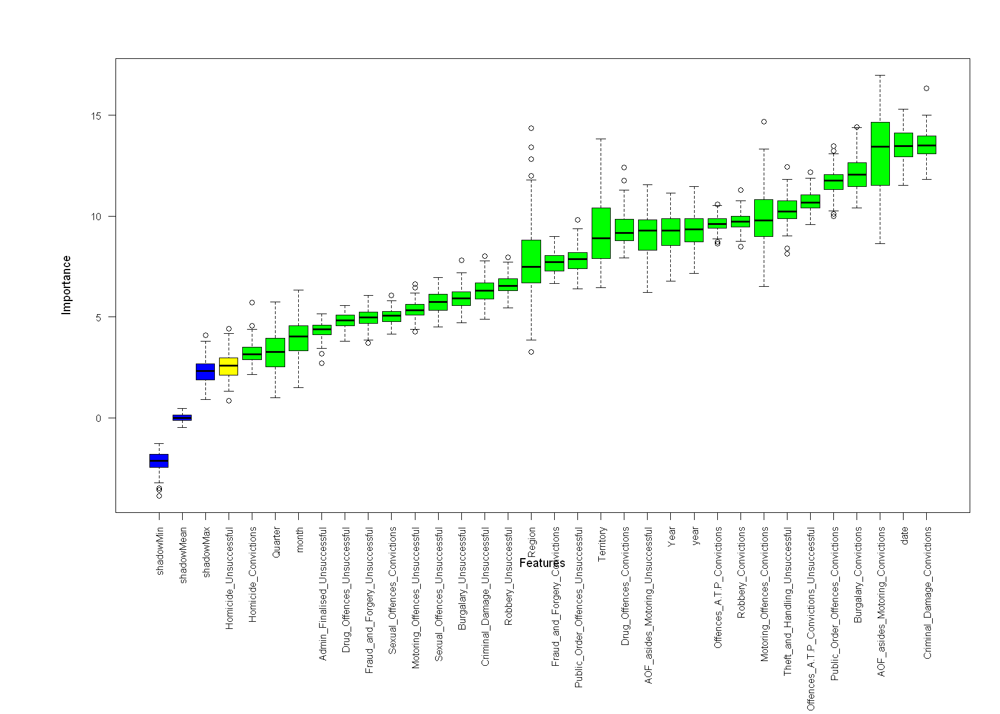

In [1382]:
# Increase the size of the plot
options(repr.plot.width = 14, repr.plot.height = 10)

# Rotate x-axis labels at 45 degrees
plot(boruta, las = 2, cex.axis = 0.8, xlab = "Features")

# Adjust the margins to provide more space for x-axis labels
par(mar = c(14, 8, 4, 2) + 0.1)

# Increase the size of the plot area
plot(boruta, las = 2, cex.axis = 0.8, xlab = "Features")


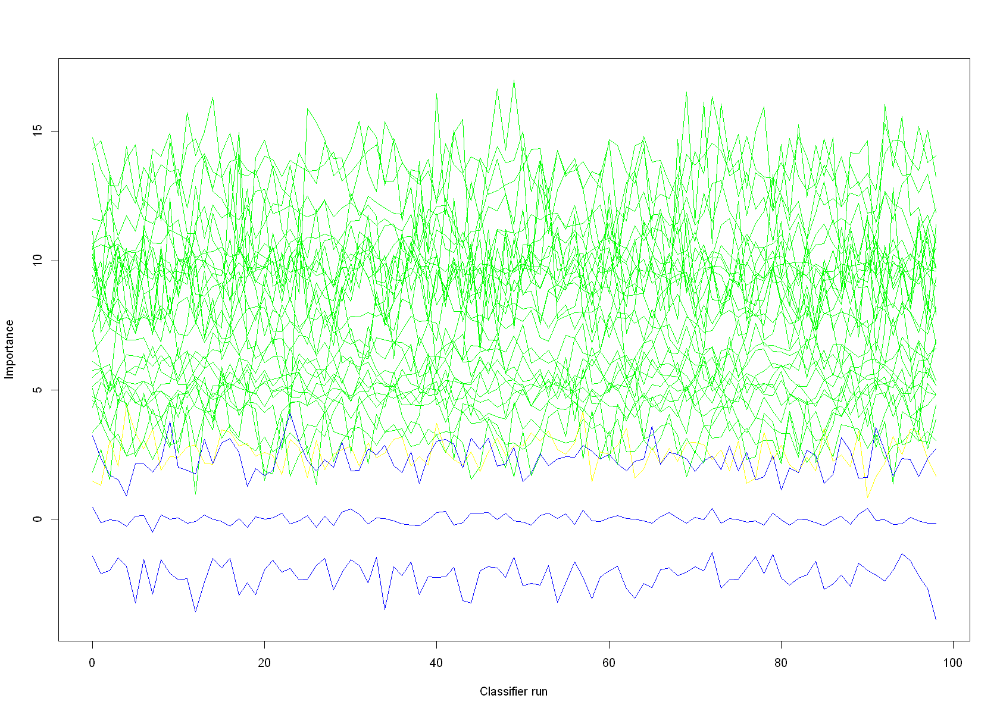

In [1383]:
plotImpHistory(boruta)

# Machine Learning

Train

In [1384]:
X <- combined_df[, !colnames(combined_df) %in% "Sexual_Offences_Convictions"]
y <- combined_df$Sexual_Offences_Convictions

In [1385]:
set.seed(123)

# Generate train indices
train_indices <- sample(1:nrow(combined_df), 0.7 * nrow(combined_df))

# Split the data into training and testing sets
X_train <- combined_df[train_indices, ]
y_train <- X_train$Sexual_Offences_Convictions
X_test <- combined_df[-train_indices, ]
y_test <- X_test$Sexual_Offences_Convictions


# Linear regression technique

In [1386]:
    encoded_df <- model.matrix(~., data = X_train)
    encoded_df <- as.data.frame(encoded_df)

    # Fit linear regression model
    lm_model <- lm(y_train ~ ., data = encoded_df)

    # Predict on the test set
    encoded_test <- model.matrix(~., data = X_test)
    encoded_test <- as.data.frame(encoded_test)
    predictions <- predict(lm_model, newdata = encoded_test)

    # Evaluate the model
    mse <- mean((predictions - y_test)^2)
    rmse <- sqrt(mse)

    # View the model coefficients
    coefficients <- coef(lm_model)


In [1387]:
print(paste("mse: ", mse))
print(paste("rmse: ", rmse))


[1] "mse:  5.81662548029378e-29"
[1] "rmse:  7.62668045763934e-15"


Decision tree

In [1388]:
set.seed(123)

# Generate train indices
train_indices <- sample(1:nrow(combined_df), 0.7 * nrow(combined_df))

# Split the data into training and testing sets
X_train <- combined_df[train_indices, ]
y_train <- X_train$Sexual_Offences_Convictions
X_test <- combined_df[-train_indices, ]
y_test <- X_test$Sexual_Offences_Convictions

# Create a decision tree regression model
tree_model <- rpart(Sexual_Offences_Convictions ~ ., data = X_train, method = "anova")

# Make predictions on the testing set
y_pred <- predict(tree_model, newdata = X_test)

# Evaluate the model
mse <- mean((y_pred - y_test)^2)
rmse <- sqrt(mse)


In [1389]:
print(paste("mse: ", mse))
print(paste("rmse: ", rmse))

[1] "mse:  60.4883169223492"
[1] "rmse:  7.77742354011591"


From my point of view, the Linear regression model is performing better in minimizing the prediction errors  compared to the decision tree model. Using the MSE which is the mean squared error,

# Feature selection for Clustering technique

In [1390]:
numeric_df <- select(combined_df, where(is.numeric))  # Select numeric columns

Variance Explained:
 [1] 0.7781398893 0.0578063193 0.0362864118 0.0231373026 0.0173262008
 [6] 0.0135668650 0.0109371560 0.0088681870 0.0078873936 0.0074946931
[11] 0.0047633360 0.0039896518 0.0037252661 0.0035826523 0.0029358030
[16] 0.0027942121 0.0025154498 0.0023055365 0.0021596619 0.0018806099
[21] 0.0017551440 0.0015283169 0.0013187700 0.0011104114 0.0009650656
[26] 0.0007232747 0.0004964195


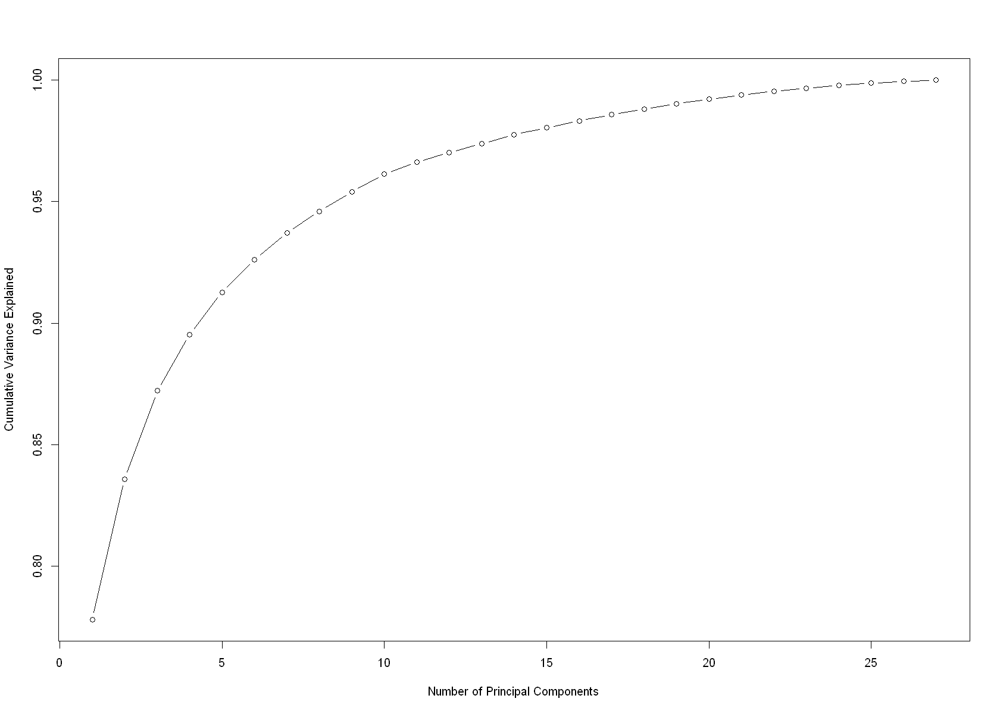

In [1391]:
# Standardize the data
scaled_data <- scale(numeric_df)

# Perform PCA
pca_result <- prcomp(scaled_data)

# Extract the principal components
principal_components <- pca_result$x

# Print the variance explained by each principal component
variance_explained <- (pca_result$sdev^2) / sum(pca_result$sdev^2)
cat("Variance Explained:\n")
print(variance_explained)

# Plot the cumulative variance explained
cumulative_variance <- cumsum(variance_explained)
plot(cumulative_variance, type = "b", xlab = "Number of Principal Components", ylab = "Cumulative Variance Explained")

# Choose the desired number of principal components to retain
desired_variance_explained <- 0.95  # Example: Retain 95% of variance
num_components <- sum(cumulative_variance <= desired_variance_explained)

# Transform the data using the selected principal components
reduced_data <- principal_components[, 1:num_components]


# Principal Component Analysis

In [1392]:
# Perform PCA
pca_res <- prcomp(numeric_df, scale. = TRUE)

# Extract the first two principal components
pc1 <- pca_res$x[, 1]
pc2 <- pca_res$x[, 2]

# Create a new dataframe with the first two principal components
pca_df <- data.frame(pc1, pc2)

# Clustering Technique

In [1393]:
K <- 3
numeric_df <- select(combined_df, where(is.numeric))  # Select numeric columns
km.res <- kmeans(numeric_df, centers = K, nstart = 20)

In [1394]:
K <- 3
km.res <- kmeans(pca_df, centers = K, nstart = 20)

# Print the cluster assignments
print(km.res$cluster)


   [1] 2 2 3 3 2 2 3 3 3 2 2 3 2 2 3 2 2 3 3 2 3 2 2 3 3 2 2 3 2 2 3 2 3 3 2 2 2
  [38] 3 2 2 3 3 2 2 2 2 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
  [75] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [112] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [149] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [186] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [223] 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [260] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [297] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [334] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 2 2 3 3 3 3 3 3 3 3 3 3 3
 [371] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [408] 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 [445] 3 3 3 3 3 3 3 3 3 3 3

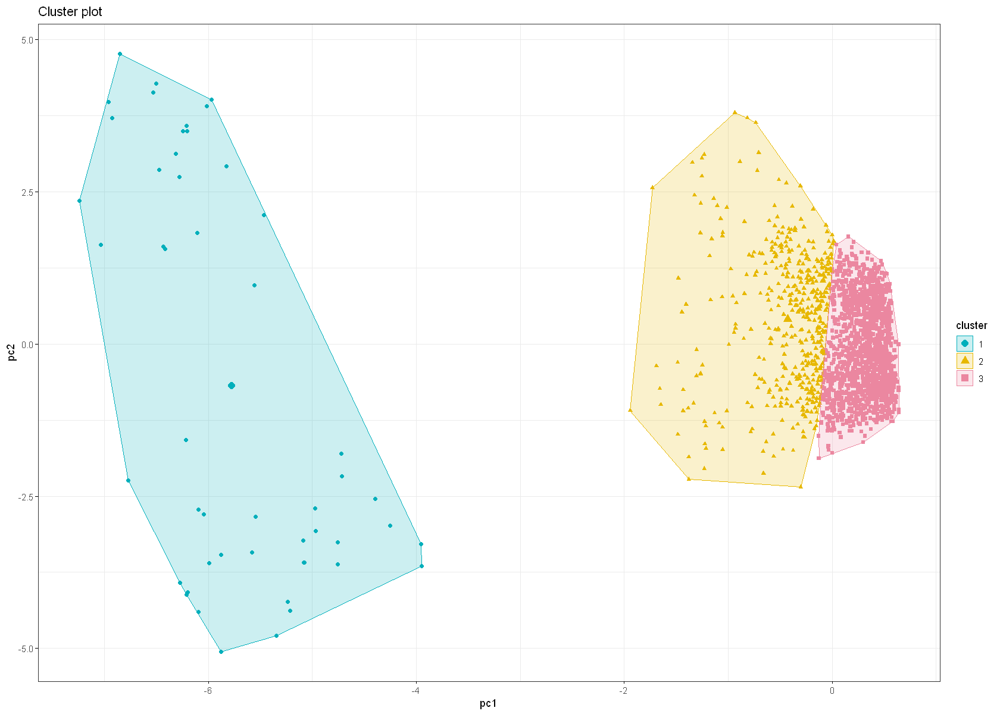

In [1395]:
# Plot the clustering result with the first two principal components
fviz_cluster(km.res, data = pca_df, geom = "point",
             palette = c("#00AFBB", "#E7B800", "#eb87a0"),
             ggtheme = theme_bw())


Warning message:
"did not converge in 10 iterations"


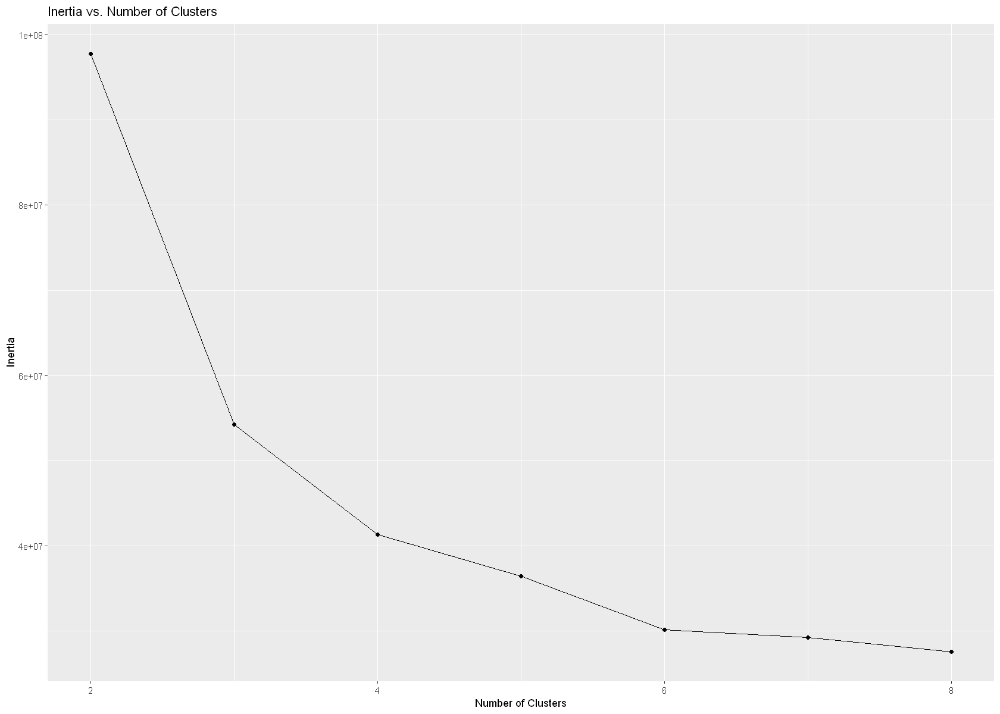

In [1396]:
k_values <- 2:8
inertia_values <- numeric(length(k_values))

# Perform k-means clustering for different cluster numbers
for (i in 1:length(k_values)) {
  km.res <- kmeans(numeric_df, centers = k_values[i], nstart = 20)
  inertia_values[i] <- km.res$tot.withinss
}

# Plot the inertia values against the number of clusters
ggplot(data.frame(k = k_values, inertia = inertia_values), aes(x = k, y = inertia)) +
  geom_line() +
  geom_point() +
  labs(x = "Number of Clusters", y = "Inertia") +
  ggtitle("Inertia vs. Number of Clusters")


# Hierchical clustering

In [1397]:
numeric_df <- select(combined_df, where(is.numeric))  # Select numeric columns
dist_matrix <- dist(numeric_df)  # Compute the distance matrix
hclust_res <- hclust(dist_matrix)  # Perform hierarchical clustering


Warning message in get_col(col, k):
"Length of color vector was longer than the number of clusters - first k elements are used"


   [1] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [38] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
  [75] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [112] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [149] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [186] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [223] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [260] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [297] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [334] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [371] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [408] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 [445] 1 1 1 1 1 1 1 1 1 1 1

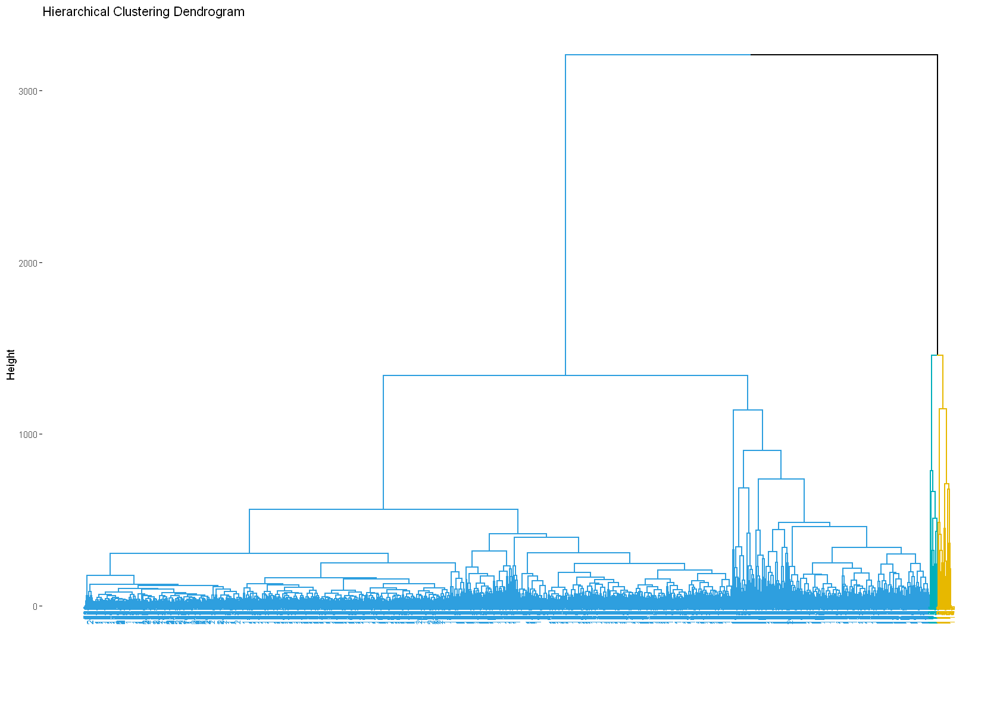

In [1398]:
# Plot the dendrogram
fviz_dend(hclust_res, main = "Hierarchical Clustering Dendrogram", 
          k = K, cex = 0.6, horiz = FALSE, 
          k_colors = c("#2E9FDF", "#00AFBB", "#E7B800", "#eb87a0"),
          guides = "none")

# Cut the dendrogram into K clusters
cut_clusters <- cutree(hclust_res, k = K)

# Print the cluster assignments
print(cut_clusters)

# Classification 

# Copy combined_df dataframe into a new dataframe
# Create a new column 1 and 0 based on Sexual Offence conviction
# A amcreatina new column, if sexual conviction is 0, let that new column be 0, else let it be 1.
# drop all other sexual offence convictions  # sexual offence conviction and sexual conviction unsuccessful.do fe
# split my data into train and test.
# do feature selection

In [1399]:
Class_df <- combined_df

In [1400]:
# Create a new column "Sexual_Crimes_Data" based on sexual convictions in other variables
Class_df$Sexual_Crimes_Data <- ifelse(Class_df$Sexual_Offences_Convictions >= 10 & Class_df$Sexual_Offences_Convictions <= 21, 1, 0)

# Print the updated data frame
print(Class_df$Sexual_Crimes_Data)


   [1] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
  [38] 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
  [75] 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 0 0 0
 [112] 1 0 0 0 0 1 0 1 1 1 1 0 1 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 1 1 1 1 0 1 0 0 1
 [149] 0 0 1 1 0 1 1 1 0 0 0 0 0 1 1 1 0 1 0 0 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 0
 [186] 0 0 0 0 1 1 0 1 1 1 0 1 1 1 1 1 0 1 0 0 1 1 0 0 1 0 1 0 1 0 1 1 1 1 1 0 1
 [223] 1 0 1 1 0 1 1 0 1 1 1 0 0 0 1 0 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0
 [260] 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 [297] 0 0 0 0 0 1 1 1 0 1 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 1 0 1 1 0 0 1 0 0 1 0 1
 [334] 0 1 0 1 0 0 0 1 1 1 1 0 1 0 0 1 1 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 1 0
 [371] 0 0 0 1 1 1 1 1 1 1 1 0 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 1 0
 [408] 1 0 0 0 1 0 1 0 0 0 0 1 0 0 0 0 1 1 1 1 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 1 1
 [445] 0 0 0 0 1 0 0 1 0 0 0

In [1401]:
# Set the seed for reproducibility
set.seed(123)

# Specify the proportion of data to be allocated for training
train_prop <- 0.7  # 70% of the data for training

# Create the data split
data_split <- createDataPartition(Class_df$Sexual_Crimes_Data, p = train_prop, list = FALSE)

# Split the data into training and testing sets
train_data <- Class_df[data_split, ]
test_data <- Class_df[-data_split, ]

# Check the dimensions of the training and testing sets
dim(train_data)
dim(test_data)


[1] 1435   33

[1] 615  33

Logistic regression

In [1402]:
# Fit the logistic regression model
logit_model <- glm(Sexual_Crimes_Data ~ ., data = train_data, family = binomial)

# Predicting the test data
predicted <- predict(logit_model, newdata = test_data, type = "response")

# Convert predicted probabilities to class labels
predicted_class <- ifelse(predicted >= 0.5, 1, 0)

# Create the confusion matrix
confusion <- table(test_data$Sexual_Crimes_Data, predicted_class)

# Print the confusion matrix
print(confusion)


Warning message in predict.lm(object, newdata, se.fit, scale = 1, type = if (type == :
"prediction from rank-deficient fit; attr(*, "non-estim") has doubtful cases"


   predicted_class
      0   1
  0 356  72
  1 103  84


In [1403]:
# Calculate the accuracy
accuracy <- sum(diag(confusion)) / sum(confusion)
cat("Accuracy:", accuracy, "\n")

Accuracy: 0.7154472 


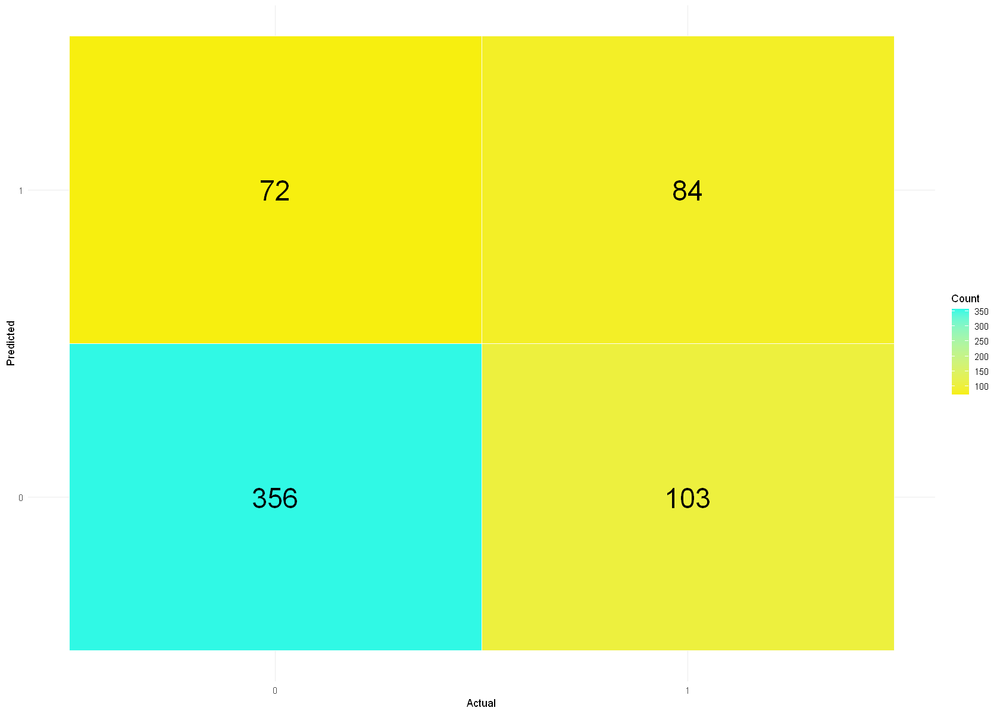

In [1404]:
# Convert confusion matrix to data frame for plotting
confusion_df <- as.data.frame(confusion)

# Rename the variable names
colnames(confusion_df) <- c("Actual", "Predicted", "Count")

# Convert the "Count" variable to numeric
confusion_df$Count <- as.numeric(as.character(confusion_df$Count))

# Plot the confusion matrix
ggplot(confusion_df, aes(x = Actual, y = Predicted, fill = Count)) +
  geom_tile(color = "#fdfdfd") +
  geom_text(aes(label = Count), color = "black", size = 10) +  # Add text labels
  scale_fill_gradient(low = "#f7ef0f", high = "#30f9e5", ) +
  labs(x = "Actual", y = "Predicted") +
  theme_minimal()


# Support Vector Machine

In [1405]:
# Fit the SVM model
svm_model <- svm(Sexual_Crimes_Data ~ ., data = train_data, kernel = "linear")

# Predict on the test data
predicted <- predict(svm_model, newdata = test_data)

# Create the confusion matrix
confusion <- table(test_data$Sexual_Crimes_Data, predicted)

# Calculate the accuracy
accuracy <- sum(diag(confusion)) / sum(confusion)
cat("Accuracy:", accuracy, "\n")


Accuracy: 0.001626016 


We can conclude that the logistic regression model is performing much better than the SVM model in terms of accuracy based on these accuracy figures. In the test data, the logistic regression model properly predicts the class labels for roughly 71.54% of the occurrences, whereas the SVM model only manages an accuracy of 0.16%.

This suggests that, at least based on the provided accuracy score, the logistic regression model is more appropriate for the current classification problem when compared to the SVM model. 